### SO here is the situation -- the required weather data is very hard to find for many locations for various metrics. For example, I haven't been able to find 24 precipitation for large portions of Canada. This emphasizes the need for alternative "reduced data" methods to determine the FWI. I'd like to try to build a machine learning model that can predict FWI based on temperature and wind speed alone (or some other combination).

In [1]:
import keras
import pandas as pd

In [2]:
singleDay = pd.read_csv("single_day_climate_data.csv")

# THese missing flags are actually mostly incorrect
#simpleDF=singleDay.query("TOTAL_PRECIPITATION_FLAG != 'M' and MEAN_TEMPERATURE_FLAG !='M' and SPEED_MAX_GUST_FLAG !='M' and MAX_REL_HUMIDITY_FLAG !='M'")

# Let's get the data for the stations that aren't missing any of the data (at least for this day)
simpleDF = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]


In [3]:
import math
# “”” Define Class FWI Class first”””
class FWICLASS:
    def __init__(self,temp,rhum,wind,prcp):
        self.h = rhum
        self.t = temp
        self.w = wind
        self.p = prcp
    def FFMCcalc(self,ffmc0):
        mo = (147.2*(101.0 - ffmc0))/(59.5 + ffmc0) #*Eq. 1*#
        if (self.p > 0.5):
            rf = self.p - 0.5 #*Eq. 2*#%%!
            if(mo > 150.0):
                mo = (mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf))) + (.0015*(mo - 150.0)**2)*math.sqrt(rf) #*Eq. 3b*#
            elif mo <= 150.0:
                mo = mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf)) #*Eq. 3a*#
        if(mo > 250.0):
            mo = 250.0
        ed = .942*(self.h**.679) + (11.0*math.exp((self.h-100.0)/10.0))+0.18*(21.1-self.t)*(1.0 - 1.0/math.exp(.1150 * self.h)) #*Eq. 4*#
        if(mo < ed):
            ew = .618*(self.h**.753) + (10.0*math.exp((self.h-100.0)/10.0))+ .18*(21.1-self.t)*(1.0 - 1.0/math.exp(.115 * self.h)) #*Eq. 5*#
            if(mo <= ew):
                kl = .424*(1.0-((100.0-self.h)/100.0)**1.7)+(.0694*math.sqrt(self.w))*(1.0 - ((100.0 - self.h)/100.0)**8) #*Eq. 7a*#
                kw = kl * (.581 * math.exp(.0365 * self.t)) #*Eq. 7b*#
                m = ew - (ew - mo)/10.0**kw #*Eq. 9*#
            elif mo > ew:
                m = mo
        elif(mo == ed):
            m = mo
        elif mo > ed:
            kl =.424*(1.0-(self.h/100.0)**1.7)+(.0694*math.sqrt(self.w))* (1.0-(self.h/100.0)**8) #*Eq. 6a*#
            kw = kl * (.581*math.exp(.0365*self.t)) #*Eq. 6b*#
            m = ed + (mo-ed)/10.0 ** kw #*Eq. 8*#
        ffmc = (59.5 * (250.0 -m)) / (147.2 + m)
        if (ffmc > 101.0):
            ffmc = 101.0
        if (ffmc <= 0.0):
            ffmc = 0.0
        return ffmc
#*Eq. 10*#
    def DMCcalc(self,dmc0,mth):
        el = [6.5,7.5,9.0,12.8,13.9,13.9,12.4,10.9,9.4,8.0,7.0,6.0]
        t = self.t
        if (t < -1.1):
            t = -1.1
        rk = 1.894*(t+1.1) * (100.0-self.h) * (el[mth-1]*0.0001) #*Eqs. 16 and 17*#

        if self.p > 1.5:
            ra= self.p
            rw = 0.92*ra - 1.27
            wmi = 20.0 + 280.0/math.exp(0.023*dmc0)
            if dmc0 <= 33.0:
                b = 100.0 /(0.5 + 0.3*dmc0)
            elif dmc0 > 33.0:
                if dmc0 <= 65.0:
                    b = 14.0 - 1.3*math.log(dmc0)
            elif dmc0 > 65.0:
                b = 6.2 * math.log(dmc0) - 17.2
            wmr = wmi + (1000*rw) / (48.77+b*rw)
            pr = 43.43 * (5.6348 - math.log(wmr-20.0))
        elif self.p <= 1.5:
            pr = dmc0
        if (pr<0.0):
            pr = 0.0
        dmc = pr + rk
        if(dmc<= 1.0):
            dmc = 1.0
        return dmc


    def DCcalc(self,dc0,mth):
        fl = [-1.6, -1.6, -1.6, 0.9, 3.8, 5.8, 6.4, 5.0, 2.4, 0.4, -1.6, -1.6]
        t = self.t
        if(t < -2.8):
            t = -2.8
        pe = (0.36*(t+2.8) + fl[mth-1] )/2
        if pe <=0.0:
            pe = 0.0
        #*Eq. 22*#
        if (self.p > 2.8):
            ra = self.p
            rw = 0.83*ra - 1.27 #*Eq. 18*#
            smi = 800.0 * math.exp(-dc0/400.0) #*Eq. 19*#
            dr = dc0 - 400.0*math.log( 1.0+((3.937*rw)/smi) ) #*Eqs. 20 and 21*#
            if (dr > 0.0):
                dc = dr + pe
            else: dc = dc0
        #elif self.p <= 2.8:
        else:
            dc = dc0 + pe
        return dc


    def ISIcalc(self,ffmc):
        mo = 147.2*(101.0-ffmc) / (59.5+ffmc)
        ff = 19.115*math.exp(mo*-0.1386) * (1.0+(mo**5.31)/49300000.0)
        isi = ff * math.exp(0.05039*self.w)
        return isi


    def BUIcalc(self,dmc,dc):
        if dmc <= 0.4*dc:
            bui = (0.8*dc*dmc) / (dmc+0.4*dc)
        else:
            bui = dmc-(1.0-0.8*dc/(dmc+0.4*dc))*(0.92+(0.0114*dmc)**1.7)
        if bui <0.0:
            bui = 0.0
        return bui


    def FWIcalc(self,isi,bui):
        if bui <= 80.0:
            bb = 0.1 * isi * (0.626*bui**0.809 + 2.0)
        else:
            bb = 0.1*isi*(1000.0/(25. + 108.64/math.exp(0.023*bui)))
        if(bb <= 1.0):
            fwi = bb
        else:
            fwi = math.exp(2.72 * (0.434*math.log(bb))**0.647)

        return fwi


def main():
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0
    infile = open('test_in_fwi.txt','r')
    outfile = open('fwioutput.txt','w')
    try:
        for line in infile:
            mth,day,temp,rhum,wind,prcp=[float(field) for field in line.strip().lstrip('[').rstrip(']').split()]
            if rhum>100.0:
                rhum = 100.0
            mth = int(mth)
            fwisystem = FWICLASS(temp,rhum,wind,prcp)
            ffmc = fwisystem.FFMCcalc(ffmc0)
            dmc = fwisystem.DMCcalc(dmc0,mth)
            dc = fwisystem.DCcalc(dc0,mth)
            isi = fwisystem.ISIcalc(ffmc)
            bui = fwisystem.BUIcalc(dmc,dc)
            fwi = fwisystem.FWIcalc(isi,bui)
            ffmc0 = ffmc
            dmc0 = dmc
            dc0 = dc
            print(str(ffmc),str(dmc),str(dc),str(isi),str(bui),str(fwi))
    finally:
        infile.close()
        outfile.close()
#main()

def computeFWI(temp,rhum,prcp,wind,mth):
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0

    if rhum>100.0:
        rhum = 100.0
    mth = int(mth)
    fwisystem = FWICLASS(temp,rhum,wind,prcp)
    ffmc = fwisystem.FFMCcalc(ffmc0)
    dmc = fwisystem.DMCcalc(dmc0,mth)
    dc = fwisystem.DCcalc(dc0,mth)
    isi = fwisystem.ISIcalc(ffmc)
    bui = fwisystem.BUIcalc(dmc,dc)
    fwi = fwisystem.FWIcalc(isi,bui)
    ffmc0 = ffmc
    dmc0 = dmc
    dc0 = dc
    return fwi

# FROM https://publications.gc.ca/collections/collection_2016/rncan-nrcan/Fo133-1-424-eng.pdf

87.12550153156418 7.811796612 19.204 9.516918108321766 7.8039278404027135 8.705700639590445
90.8244737324999 11.674698630000002 25.028 10.802241217606626 11.60163827115898 11.549865177133597
77.63471875369589 11.112184754829832 27.49489140897453 1.5914554957643685 11.107277643541376 1.1193002660344609
90.21988710465098 16.188479766829833 35.29889140897453 13.40597459113381 16.121817741412364 15.890875255293292
65.31710438957165 9.79111185128955 23.010025331964645 1.3910938250537408 9.761933065289 0.8283486511031101
55.41626480735404 6.059921033103912 10.184518341592803 1.1877201080809798 5.87752455287238 0.549121999201251
80.84398999216936 9.667191765103912 16.368518341592804 1.8641589805082597 9.485649709445626 1.3929517266332863
61.741292230592016 7.150708726042811 17.26749308437178 1.2412291865095855 7.1345147457447196 0.6291345862151786
64.4820361685994 7.735685778042811 21.29149308437178 1.7303567635065653 8.107380366269709 0.9349073503101377
77.63396316147791 9.201024334042812 25

In [4]:
#OK let's output the state as a .csv just so we have SOMETHING)


#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimpleDF = simpleDF[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis = []
for i in range(len(numpysimpleDF)):
    fwis.append(computeFWI(numpysimpleDF[i][0],numpysimpleDF[i][1],numpysimpleDF[i][2],numpysimpleDF[i][3],11))

simpleDF["fwi"] = fwis
    
simpleDF.set_index("STATION_NAME")[['x','y','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION','fwi']].to_csv("Initial_State.csv")

In [5]:
print(f"These are all the {len(simpleDF)} stations that have all 4 types of data (at least on november 2 2023)")

# There are 351 stations that have this data -- it actually feels like too  many for me to go through manually and select them.
# What if I just take ALL station data from the last like 10 years or something and just filter out all the ones that are missing data?

for i in range(len(simpleDF.STATION_NAME)):
    print(simpleDF.STATION_NAME.sort_values().values[i])

These are all the 351 stations that have all 4 types of data (at least on november 2 2023)
ABBOTSFORD A
AGASSIZ RCS
ARGENTIA (AUT)
ARMSTRONG A
ARVIAT A
ARVIAT CLIMATE
ATTAWAPISKAT A
BACCARO PT
BADGER (AUT)
BAGOTVILLE A
BAIE-COMEAU
BAIE-COMEAU A
BAKER LAKE A
BAKER LAKE CLIMATE
BALLENAS ISLAND
BARRIE-ORO
BAS CARAQUET
BATHURST A
BATHURST INLET
BEATRICE CLIMATE
BEAUPORT
BEAVER MINES
BELLA BELLA
BELLA COOLA AIRPORT
BIG TROUT LAKE
BIG TROUT LAKE A
BONAVISTA
BONILLA ISLAND (AUT)
BOW VALLEY
BRANDON A
BRANTFORD AIRPORT
BRIER ISLAND
BROCKVILLE CLIMATE
BUFFALO NARROWS (AUT)
BUFFALO NARROWS A
BURGEO NL
CALGARY INT'L CS
CALGARY INTL A
CALGARY SPRINGBANK A
CAMBRIDGE BAY GSN
CAP-CHAT
CAP-MADELEINE
CAP-TOURMENTE
CAPE LIVERPOOL
CAPE ST JAMES
CARBERRY CS
CARIBOU ISLAND (AUT)
CARIBOU POINT (AUT)
CARTWRIGHT A
CATHEDRAL POINT (AUT)
CHARLEVOIX (MRC)
CHARLO AUTO
CHARLOTTETOWN A
CHATHAM KENT
CHETICAMP HIGHLANDS NATIONAL PARK
CHEVERY
CHIBOUGAMAU CHAPAIS A
CHIBOUGAMAU-CHAPAIS
CHURCHILL A
CHURCHILL CLIMATE
CLARE

In [6]:
simpleDF_on = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000 and PROVINCE_CODE=='ON'")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]
for i in range(len(simpleDF_on.STATION_NAME)):
    print(simpleDF_on.STATION_NAME.sort_values().values[i])

ARMSTRONG A
ATTAWAPISKAT A
BARRIE-ORO
BEATRICE CLIMATE
BIG TROUT LAKE
BIG TROUT LAKE A
BRANTFORD AIRPORT
BROCKVILLE CLIMATE
CARIBOU ISLAND (AUT)
CHATHAM KENT
COBOURG (AUT)
DELHI CS
DRYDEN REGIONAL
EARLTON A
EARLTON CLIMATE
EGBERT CS
ELORA RCS
FORT SEVERN A
GODERICH
GORE BAY CLIMATE
GORE BAY-MANITOULIN
HAMILTON A
HARROW CDA AUTO
KAPUSKASING A
KAPUSKASING CDA ON
KEMPTVILLE CS
KENORA A
KENORA RCS
KINGSTON CLIMATE
KITCHENER/WATERLOO
LANSDOWNE HOUSE (AUT)
LANSDOWNE HOUSE A
MONO CENTRE
MOOSE CREEK WELLS
MOOSONEE
MOUNT FOREST (AUT)
NORTH BAY A
NORTH BAY AIRPORT
OGOKI POST A
OSHAWA
OTTAWA CDA RCS
OTTAWA INTL A
PEAWANUCK (AUT)
PEAWANUCK A
PETERBOROUGH A
PICKLE LAKE (AUT)
PICKLE LAKE A
POINT PETRE (AUT)
PORT WELLER (AUT)
PUKASKWA (AUT)
RIDGETOWN RCS
SARNIA
SARNIA CLIMATE
SAULT STE MARIE A
SAULT STE. MARIE AIRPORT
SIOUX LOOKOUT A
SIOUX LOOKOUT AIRPORT
SUDBURY A
SUDBURY CLIMATE
TERRACE BAY AIRPORT
TIMMINS A
TIMMINS CLIMATE
TOBERMORY RCS
TORONTO CITY CENTRE
TORONTO INTL A
TRENTON A
UXBRIDGE WEST
VI

### A small subset of the data is included on the github, but the full dataset can be accessed here:
### https://climate-change.canada.ca/climate-data/#/daily-climate-data

In [21]:
# OK I downloaded all data from the above stations from 2000 - 2023; lets load it in 

import glob
climateData = sorted(glob.glob("climate_daily_ontario_since_2000-reduced/*.csv"))
all_csv = []

for i in range(len(climateData)):
    
    #I'm just going to dropna from all of the data because at this point I'm running out of time to try to process it more involvedly.
    all_csv.append(pd.read_csv(climateData[i])[['x','y','LOCAL_DATE','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']].dropna())

In [22]:
# Let's concat all of those to have one dataframe with everything.
full_df = pd.concat(all_csv).reset_index().drop("index",axis = 1)
full_df = full_df.dropna()
full_df = full_df.sort_values("STATION_NAME")
full_df = full_df.reset_index(drop = True)

# It is length 170,000.
# Honestly this is probably good enough to train a model of 4 parameters and one output.

In [23]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0
...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6


In [27]:
#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimple_fullDF = full_df[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis_full = []
for i in range(len(numpysimple_fullDF)):
    fwis_full.append(computeFWI(numpysimple_fullDF[i][0],numpysimple_fullDF[i][1],numpysimple_fullDF[i][2],numpysimple_fullDF[i][3],11))

full_df["fwi"] = fwis_full

full_df.to_csv('ontariostations_2000_to_2023_t_h_s_p_fwi.csv')

In [28]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION,fwi
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0,8.415498
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2,14.899067
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0,9.671279
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0,7.684838
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0,5.695663
...,...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0,7.780153
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0,17.317508
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0,31.715704
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6,0.724868


In [29]:
### Ok now we need to build a DNN that learns to predict FWI from 3 parameters

# let's first scramble the dataframe to make sure we get a nice random order
full_df_scramble = full_df.sample(frac=1).reset_index(drop=True)

features_numpy = full_df_scramble[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()
labels_numpy = full_df_scramble.fwi.values

In [35]:
train_features = features_numpy[:-int(len(features_numpy)/4)]
train_labels = labels_numpy[:-int(len(features_numpy)/4)]

test_features = features_numpy[-int(len(features_numpy)/4):]
test_labels = labels_numpy[-int(len(features_numpy)/4):]

In [105]:
import keras


model = keras.Sequential()
#we'll just flatten the one hot encoded sequence
model.add(keras.layers.Dense(4, input_shape=(4,), activation='leaky_relu'))
# Experimented with various hidden layers lead to this
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(50, activation='leaky_relu'))

model.add(keras.layers.Dense(1, activation='relu'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])

history=model.fit(train_features.reshape(-1,4),train_labels, epochs=100000, batch_size=50000,verbose = 1,validation_data=(test_features.reshape(-1,4), test_labels))


Epoch 1/100000
3/3 [==============================] - 4s 428ms/step - loss: 56.7937 - mean_squared_error: 56.7937 - val_loss: 48.5459 - val_mean_squared_error: 48.5459
Epoch 2/100000
3/3 [==============================] - 0s 83ms/step - loss: 54.2460 - mean_squared_error: 54.2460 - val_loss: 44.9781 - val_mean_squared_error: 44.9781
Epoch 3/100000
3/3 [==============================] - 0s 77ms/step - loss: 50.3314 - mean_squared_error: 50.3314 - val_loss: 40.4598 - val_mean_squared_error: 40.4598
Epoch 4/100000
3/3 [==============================] - 0s 65ms/step - loss: 45.9623 - mean_squared_error: 45.9623 - val_loss: 36.7667 - val_mean_squared_error: 36.7667
Epoch 5/100000
3/3 [==============================] - 0s 63ms/step - loss: 42.6359 - mean_squared_error: 42.6359 - val_loss: 34.3446 - val_mean_squared_error: 34.3446
Epoch 6/100000
3/3 [==============================] - 0s 59ms/step - loss: 40.4139 - mean_squared_error: 40.4139 - val_loss: 33.0822 - val_mean_squared_error: 33.08

Epoch 50/100000
3/3 [==============================] - 0s 48ms/step - loss: 13.3844 - mean_squared_error: 13.3844 - val_loss: 9.4970 - val_mean_squared_error: 9.4970
Epoch 51/100000
3/3 [==============================] - 0s 62ms/step - loss: 12.9845 - mean_squared_error: 12.9845 - val_loss: 9.1587 - val_mean_squared_error: 9.1587
Epoch 52/100000
3/3 [==============================] - 0s 71ms/step - loss: 12.6265 - mean_squared_error: 12.6265 - val_loss: 8.8642 - val_mean_squared_error: 8.8642
Epoch 53/100000
3/3 [==============================] - 0s 66ms/step - loss: 12.2819 - mean_squared_error: 12.2819 - val_loss: 8.5835 - val_mean_squared_error: 8.5835
Epoch 54/100000
3/3 [==============================] - 0s 58ms/step - loss: 11.9329 - mean_squared_error: 11.9329 - val_loss: 8.2911 - val_mean_squared_error: 8.2911
Epoch 55/100000
3/3 [==============================] - 0s 59ms/step - loss: 11.5882 - mean_squared_error: 11.5882 - val_loss: 8.0051 - val_mean_squared_error: 8.0051
Epoc

Epoch 100/100000
3/3 [==============================] - 0s 75ms/step - loss: 4.1830 - mean_squared_error: 4.1830 - val_loss: 2.5305 - val_mean_squared_error: 2.5305
Epoch 101/100000
3/3 [==============================] - 0s 62ms/step - loss: 4.1255 - mean_squared_error: 4.1255 - val_loss: 2.4660 - val_mean_squared_error: 2.4660
Epoch 102/100000
3/3 [==============================] - 0s 70ms/step - loss: 4.0447 - mean_squared_error: 4.0447 - val_loss: 2.3986 - val_mean_squared_error: 2.3986
Epoch 103/100000
3/3 [==============================] - 0s 66ms/step - loss: 3.9738 - mean_squared_error: 3.9738 - val_loss: 2.3722 - val_mean_squared_error: 2.3722
Epoch 104/100000
3/3 [==============================] - 0s 60ms/step - loss: 3.9033 - mean_squared_error: 3.9033 - val_loss: 2.3141 - val_mean_squared_error: 2.3141
Epoch 105/100000
3/3 [==============================] - 0s 52ms/step - loss: 3.8413 - mean_squared_error: 3.8413 - val_loss: 2.2670 - val_mean_squared_error: 2.2670
Epoch 106/

Epoch 150/100000
3/3 [==============================] - 0s 49ms/step - loss: 2.0790 - mean_squared_error: 2.0790 - val_loss: 1.2316 - val_mean_squared_error: 1.2316
Epoch 151/100000
3/3 [==============================] - 0s 65ms/step - loss: 2.0504 - mean_squared_error: 2.0504 - val_loss: 1.2274 - val_mean_squared_error: 1.2274
Epoch 152/100000
3/3 [==============================] - 0s 70ms/step - loss: 2.0406 - mean_squared_error: 2.0406 - val_loss: 1.2231 - val_mean_squared_error: 1.2231
Epoch 153/100000
3/3 [==============================] - 0s 69ms/step - loss: 2.0192 - mean_squared_error: 2.0192 - val_loss: 1.2086 - val_mean_squared_error: 1.2086
Epoch 154/100000
3/3 [==============================] - 0s 65ms/step - loss: 1.9956 - mean_squared_error: 1.9956 - val_loss: 1.1964 - val_mean_squared_error: 1.1964
Epoch 155/100000
3/3 [==============================] - 0s 51ms/step - loss: 1.9876 - mean_squared_error: 1.9876 - val_loss: 1.1888 - val_mean_squared_error: 1.1888
Epoch 156/

Epoch 200/100000
3/3 [==============================] - 0s 77ms/step - loss: 1.4645 - mean_squared_error: 1.4645 - val_loss: 0.9727 - val_mean_squared_error: 0.9727
Epoch 201/100000
3/3 [==============================] - 0s 75ms/step - loss: 1.4476 - mean_squared_error: 1.4476 - val_loss: 0.9822 - val_mean_squared_error: 0.9822
Epoch 202/100000
3/3 [==============================] - 0s 61ms/step - loss: 1.4555 - mean_squared_error: 1.4555 - val_loss: 0.9589 - val_mean_squared_error: 0.9589
Epoch 203/100000
3/3 [==============================] - 0s 64ms/step - loss: 1.4378 - mean_squared_error: 1.4378 - val_loss: 0.9857 - val_mean_squared_error: 0.9857
Epoch 204/100000
3/3 [==============================] - 0s 65ms/step - loss: 1.4427 - mean_squared_error: 1.4427 - val_loss: 0.9561 - val_mean_squared_error: 0.9561
Epoch 205/100000
3/3 [==============================] - 0s 62ms/step - loss: 1.4156 - mean_squared_error: 1.4156 - val_loss: 0.9537 - val_mean_squared_error: 0.9537
Epoch 206/

Epoch 250/100000
3/3 [==============================] - 0s 49ms/step - loss: 1.1615 - mean_squared_error: 1.1615 - val_loss: 0.8687 - val_mean_squared_error: 0.8687
Epoch 251/100000
3/3 [==============================] - 0s 73ms/step - loss: 1.1517 - mean_squared_error: 1.1517 - val_loss: 0.8672 - val_mean_squared_error: 0.8672
Epoch 252/100000
3/3 [==============================] - 0s 75ms/step - loss: 1.1464 - mean_squared_error: 1.1464 - val_loss: 0.8659 - val_mean_squared_error: 0.8659
Epoch 253/100000
3/3 [==============================] - 0s 72ms/step - loss: 1.1408 - mean_squared_error: 1.1408 - val_loss: 0.8658 - val_mean_squared_error: 0.8658
Epoch 254/100000
3/3 [==============================] - 0s 64ms/step - loss: 1.1364 - mean_squared_error: 1.1364 - val_loss: 0.8634 - val_mean_squared_error: 0.8634
Epoch 255/100000
3/3 [==============================] - 0s 62ms/step - loss: 1.1311 - mean_squared_error: 1.1311 - val_loss: 0.8612 - val_mean_squared_error: 0.8612
Epoch 256/

Epoch 300/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.9689 - mean_squared_error: 0.9689 - val_loss: 0.7981 - val_mean_squared_error: 0.7981
Epoch 301/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.9663 - mean_squared_error: 0.9663 - val_loss: 0.8070 - val_mean_squared_error: 0.8070
Epoch 302/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.9688 - mean_squared_error: 0.9688 - val_loss: 0.7940 - val_mean_squared_error: 0.7940
Epoch 303/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.9645 - mean_squared_error: 0.9645 - val_loss: 0.7951 - val_mean_squared_error: 0.7951
Epoch 304/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.9566 - mean_squared_error: 0.9566 - val_loss: 0.7953 - val_mean_squared_error: 0.7953
Epoch 305/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.9566 - mean_squared_error: 0.9566 - val_loss: 0.7910 - val_mean_squared_error: 0.7910
Epoch 306/

Epoch 350/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.8668 - mean_squared_error: 0.8668 - val_loss: 0.7611 - val_mean_squared_error: 0.7611
Epoch 351/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.8638 - mean_squared_error: 0.8638 - val_loss: 0.7627 - val_mean_squared_error: 0.7627
Epoch 352/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.8648 - mean_squared_error: 0.8648 - val_loss: 0.7611 - val_mean_squared_error: 0.7611
Epoch 353/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.8642 - mean_squared_error: 0.8642 - val_loss: 0.7746 - val_mean_squared_error: 0.7746
Epoch 354/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.8760 - mean_squared_error: 0.8760 - val_loss: 0.7763 - val_mean_squared_error: 0.7763
Epoch 355/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.8731 - mean_squared_error: 0.8731 - val_loss: 0.7691 - val_mean_squared_error: 0.7691
Epoch 356/

Epoch 400/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.8068 - mean_squared_error: 0.8068 - val_loss: 0.7488 - val_mean_squared_error: 0.7488
Epoch 401/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.8055 - mean_squared_error: 0.8055 - val_loss: 0.7461 - val_mean_squared_error: 0.7461
Epoch 402/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.8102 - mean_squared_error: 0.8102 - val_loss: 0.7549 - val_mean_squared_error: 0.7549
Epoch 403/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.8166 - mean_squared_error: 0.8166 - val_loss: 0.7577 - val_mean_squared_error: 0.7577
Epoch 404/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.8194 - mean_squared_error: 0.8194 - val_loss: 0.7500 - val_mean_squared_error: 0.7500
Epoch 405/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.8045 - mean_squared_error: 0.8045 - val_loss: 0.7397 - val_mean_squared_error: 0.7397
Epoch 406/

Epoch 450/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.7692 - mean_squared_error: 0.7692 - val_loss: 0.7461 - val_mean_squared_error: 0.7461
Epoch 451/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.7795 - mean_squared_error: 0.7795 - val_loss: 0.7261 - val_mean_squared_error: 0.7261
Epoch 452/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.7639 - mean_squared_error: 0.7639 - val_loss: 0.7238 - val_mean_squared_error: 0.7238
Epoch 453/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.7619 - mean_squared_error: 0.7619 - val_loss: 0.7246 - val_mean_squared_error: 0.7246
Epoch 454/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.7628 - mean_squared_error: 0.7628 - val_loss: 0.7253 - val_mean_squared_error: 0.7253
Epoch 455/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.7622 - mean_squared_error: 0.7622 - val_loss: 0.7226 - val_mean_squared_error: 0.7226
Epoch 456/

Epoch 500/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.7479 - mean_squared_error: 0.7479 - val_loss: 0.7188 - val_mean_squared_error: 0.7188
Epoch 501/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.7417 - mean_squared_error: 0.7417 - val_loss: 0.7165 - val_mean_squared_error: 0.7165
Epoch 502/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.7393 - mean_squared_error: 0.7393 - val_loss: 0.7159 - val_mean_squared_error: 0.7159
Epoch 503/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.7374 - mean_squared_error: 0.7374 - val_loss: 0.7172 - val_mean_squared_error: 0.7172
Epoch 504/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.7438 - mean_squared_error: 0.7438 - val_loss: 0.7123 - val_mean_squared_error: 0.7123
Epoch 505/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.7447 - mean_squared_error: 0.7447 - val_loss: 0.7164 - val_mean_squared_error: 0.7164
Epoch 506/

Epoch 550/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.7148 - mean_squared_error: 0.7148 - val_loss: 0.7061 - val_mean_squared_error: 0.7061
Epoch 551/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.7262 - mean_squared_error: 0.7262 - val_loss: 0.7050 - val_mean_squared_error: 0.7050
Epoch 552/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.7154 - mean_squared_error: 0.7154 - val_loss: 0.7003 - val_mean_squared_error: 0.7003
Epoch 553/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.7138 - mean_squared_error: 0.7138 - val_loss: 0.6965 - val_mean_squared_error: 0.6965
Epoch 554/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.7137 - mean_squared_error: 0.7137 - val_loss: 0.6955 - val_mean_squared_error: 0.6955
Epoch 555/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.7118 - mean_squared_error: 0.7118 - val_loss: 0.7014 - val_mean_squared_error: 0.7014
Epoch 556/

Epoch 600/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.6958 - mean_squared_error: 0.6958 - val_loss: 0.6870 - val_mean_squared_error: 0.6870
Epoch 601/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.6949 - mean_squared_error: 0.6949 - val_loss: 0.6842 - val_mean_squared_error: 0.6842
Epoch 602/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.6924 - mean_squared_error: 0.6924 - val_loss: 0.6842 - val_mean_squared_error: 0.6842
Epoch 603/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.6942 - mean_squared_error: 0.6942 - val_loss: 0.6823 - val_mean_squared_error: 0.6823
Epoch 604/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.6928 - mean_squared_error: 0.6928 - val_loss: 0.6868 - val_mean_squared_error: 0.6868
Epoch 605/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.6985 - mean_squared_error: 0.6985 - val_loss: 0.6923 - val_mean_squared_error: 0.6923
Epoch 606/

Epoch 650/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.6750 - mean_squared_error: 0.6750 - val_loss: 0.6742 - val_mean_squared_error: 0.6742
Epoch 651/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.6770 - mean_squared_error: 0.6770 - val_loss: 0.6703 - val_mean_squared_error: 0.6703
Epoch 652/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.6768 - mean_squared_error: 0.6768 - val_loss: 0.6806 - val_mean_squared_error: 0.6806
Epoch 653/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.6790 - mean_squared_error: 0.6790 - val_loss: 0.6751 - val_mean_squared_error: 0.6751
Epoch 654/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.6834 - mean_squared_error: 0.6834 - val_loss: 0.6721 - val_mean_squared_error: 0.6721
Epoch 655/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.6797 - mean_squared_error: 0.6797 - val_loss: 0.7009 - val_mean_squared_error: 0.7009
Epoch 656/

Epoch 700/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.6644 - mean_squared_error: 0.6644 - val_loss: 0.6945 - val_mean_squared_error: 0.6945
Epoch 701/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.6897 - mean_squared_error: 0.6897 - val_loss: 0.6698 - val_mean_squared_error: 0.6698
Epoch 702/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.6621 - mean_squared_error: 0.6621 - val_loss: 0.6766 - val_mean_squared_error: 0.6766
Epoch 703/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.6777 - mean_squared_error: 0.6777 - val_loss: 0.6712 - val_mean_squared_error: 0.6712
Epoch 704/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.6626 - mean_squared_error: 0.6626 - val_loss: 0.6587 - val_mean_squared_error: 0.6587
Epoch 705/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.6579 - mean_squared_error: 0.6579 - val_loss: 0.6648 - val_mean_squared_error: 0.6648
Epoch 706/

Epoch 750/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.6445 - mean_squared_error: 0.6445 - val_loss: 0.6534 - val_mean_squared_error: 0.6534
Epoch 751/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.6491 - mean_squared_error: 0.6491 - val_loss: 0.6663 - val_mean_squared_error: 0.6663
Epoch 752/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.6602 - mean_squared_error: 0.6602 - val_loss: 0.6565 - val_mean_squared_error: 0.6565
Epoch 753/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.6469 - mean_squared_error: 0.6469 - val_loss: 0.6519 - val_mean_squared_error: 0.6519
Epoch 754/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.6575 - mean_squared_error: 0.6575 - val_loss: 0.6888 - val_mean_squared_error: 0.6888
Epoch 755/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.6721 - mean_squared_error: 0.6721 - val_loss: 0.6601 - val_mean_squared_error: 0.6601
Epoch 756/

Epoch 800/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.6284 - mean_squared_error: 0.6284 - val_loss: 0.6397 - val_mean_squared_error: 0.6397
Epoch 801/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.6294 - mean_squared_error: 0.6294 - val_loss: 0.6444 - val_mean_squared_error: 0.6444
Epoch 802/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.6325 - mean_squared_error: 0.6325 - val_loss: 0.6425 - val_mean_squared_error: 0.6425
Epoch 803/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.6278 - mean_squared_error: 0.6278 - val_loss: 0.6545 - val_mean_squared_error: 0.6545
Epoch 804/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.6569 - mean_squared_error: 0.6569 - val_loss: 0.6882 - val_mean_squared_error: 0.6882
Epoch 805/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.6560 - mean_squared_error: 0.6560 - val_loss: 0.6443 - val_mean_squared_error: 0.6443
Epoch 806/

Epoch 850/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.6339 - mean_squared_error: 0.6339 - val_loss: 0.6373 - val_mean_squared_error: 0.6373
Epoch 851/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.6205 - mean_squared_error: 0.6205 - val_loss: 0.6420 - val_mean_squared_error: 0.6420
Epoch 852/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.6270 - mean_squared_error: 0.6270 - val_loss: 0.6352 - val_mean_squared_error: 0.6352
Epoch 853/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.6219 - mean_squared_error: 0.6219 - val_loss: 0.6292 - val_mean_squared_error: 0.6292
Epoch 854/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.6174 - mean_squared_error: 0.6174 - val_loss: 0.6436 - val_mean_squared_error: 0.6436
Epoch 855/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.6257 - mean_squared_error: 0.6257 - val_loss: 0.6299 - val_mean_squared_error: 0.6299
Epoch 856/

Epoch 900/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.6078 - mean_squared_error: 0.6078 - val_loss: 0.6267 - val_mean_squared_error: 0.6267
Epoch 901/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.6120 - mean_squared_error: 0.6120 - val_loss: 0.6360 - val_mean_squared_error: 0.6360
Epoch 902/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.6194 - mean_squared_error: 0.6194 - val_loss: 0.6348 - val_mean_squared_error: 0.6348
Epoch 903/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.6170 - mean_squared_error: 0.6170 - val_loss: 0.6267 - val_mean_squared_error: 0.6267
Epoch 904/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.6081 - mean_squared_error: 0.6081 - val_loss: 0.6221 - val_mean_squared_error: 0.6221
Epoch 905/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.6054 - mean_squared_error: 0.6054 - val_loss: 0.6291 - val_mean_squared_error: 0.6291
Epoch 906/

Epoch 950/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.6044 - mean_squared_error: 0.6044 - val_loss: 0.6527 - val_mean_squared_error: 0.6527
Epoch 951/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.6430 - mean_squared_error: 0.6430 - val_loss: 0.6671 - val_mean_squared_error: 0.6671
Epoch 952/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.6391 - mean_squared_error: 0.6391 - val_loss: 0.6195 - val_mean_squared_error: 0.6195
Epoch 953/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.6015 - mean_squared_error: 0.6015 - val_loss: 0.6294 - val_mean_squared_error: 0.6294
Epoch 954/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.6102 - mean_squared_error: 0.6102 - val_loss: 0.6238 - val_mean_squared_error: 0.6238
Epoch 955/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.6010 - mean_squared_error: 0.6010 - val_loss: 0.6137 - val_mean_squared_error: 0.6137
Epoch 956/

Epoch 1000/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.5930 - mean_squared_error: 0.5930 - val_loss: 0.6377 - val_mean_squared_error: 0.6377
Epoch 1001/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.6179 - mean_squared_error: 0.6179 - val_loss: 0.6275 - val_mean_squared_error: 0.6275
Epoch 1002/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.5968 - mean_squared_error: 0.5968 - val_loss: 0.6080 - val_mean_squared_error: 0.6080
Epoch 1003/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.5898 - mean_squared_error: 0.5898 - val_loss: 0.6176 - val_mean_squared_error: 0.6176
Epoch 1004/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.5940 - mean_squared_error: 0.5940 - val_loss: 0.6079 - val_mean_squared_error: 0.6079
Epoch 1005/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.5867 - mean_squared_error: 0.5867 - val_loss: 0.6156 - val_mean_squared_error: 0.6156
Epoc

3/3 [==============================] - 0s 75ms/step - loss: 0.5762 - mean_squared_error: 0.5762 - val_loss: 0.6127 - val_mean_squared_error: 0.6127
Epoch 1099/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.5852 - mean_squared_error: 0.5852 - val_loss: 0.6041 - val_mean_squared_error: 0.6041
Epoch 1100/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.5757 - mean_squared_error: 0.5757 - val_loss: 0.6053 - val_mean_squared_error: 0.6053
Epoch 1101/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.5867 - mean_squared_error: 0.5867 - val_loss: 0.6211 - val_mean_squared_error: 0.6211
Epoch 1102/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.5944 - mean_squared_error: 0.5944 - val_loss: 0.6094 - val_mean_squared_error: 0.6094
Epoch 1103/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.5828 - mean_squared_error: 0.5828 - val_loss: 0.5974 - val_mean_squared_error: 0.5974
Epoch 1104/100000
3/3 

3/3 [==============================] - 0s 57ms/step - loss: 0.5717 - mean_squared_error: 0.5717 - val_loss: 0.6017 - val_mean_squared_error: 0.6017
Epoch 1197/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.5716 - mean_squared_error: 0.5716 - val_loss: 0.5930 - val_mean_squared_error: 0.5930
Epoch 1198/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.5706 - mean_squared_error: 0.5706 - val_loss: 0.5993 - val_mean_squared_error: 0.5993
Epoch 1199/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.5730 - mean_squared_error: 0.5730 - val_loss: 0.5970 - val_mean_squared_error: 0.5970
Epoch 1200/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.5660 - mean_squared_error: 0.5660 - val_loss: 0.6015 - val_mean_squared_error: 0.6015
Epoch 1201/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.5808 - mean_squared_error: 0.5808 - val_loss: 0.6180 - val_mean_squared_error: 0.6180
Epoch 1202/100000
3/3 

3/3 [==============================] - 0s 85ms/step - loss: 0.5599 - mean_squared_error: 0.5599 - val_loss: 0.5919 - val_mean_squared_error: 0.5919
Epoch 1295/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.5602 - mean_squared_error: 0.5602 - val_loss: 0.5856 - val_mean_squared_error: 0.5856
Epoch 1296/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.5549 - mean_squared_error: 0.5549 - val_loss: 0.5806 - val_mean_squared_error: 0.5806
Epoch 1297/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.5504 - mean_squared_error: 0.5504 - val_loss: 0.5797 - val_mean_squared_error: 0.5797
Epoch 1298/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.5488 - mean_squared_error: 0.5488 - val_loss: 0.5850 - val_mean_squared_error: 0.5850
Epoch 1299/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.5521 - mean_squared_error: 0.5521 - val_loss: 0.5832 - val_mean_squared_error: 0.5832
Epoch 1300/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.5641 - mean_squared_error: 0.5641 - val_loss: 0.5838 - val_mean_squared_error: 0.5838
Epoch 1393/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.5471 - mean_squared_error: 0.5471 - val_loss: 0.5731 - val_mean_squared_error: 0.5731
Epoch 1394/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.5392 - mean_squared_error: 0.5392 - val_loss: 0.5719 - val_mean_squared_error: 0.5719
Epoch 1395/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.5402 - mean_squared_error: 0.5402 - val_loss: 0.5784 - val_mean_squared_error: 0.5784
Epoch 1396/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.5504 - mean_squared_error: 0.5504 - val_loss: 0.5852 - val_mean_squared_error: 0.5852
Epoch 1397/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.5458 - mean_squared_error: 0.5458 - val_loss: 0.5720 - val_mean_squared_error: 0.5720
Epoch 1398/100000
3/3 

3/3 [==============================] - 0s 60ms/step - loss: 0.5410 - mean_squared_error: 0.5410 - val_loss: 0.5853 - val_mean_squared_error: 0.5853
Epoch 1491/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.5442 - mean_squared_error: 0.5442 - val_loss: 0.5689 - val_mean_squared_error: 0.5689
Epoch 1492/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.5332 - mean_squared_error: 0.5332 - val_loss: 0.5730 - val_mean_squared_error: 0.5730
Epoch 1493/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.5354 - mean_squared_error: 0.5354 - val_loss: 0.5694 - val_mean_squared_error: 0.5694
Epoch 1494/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.5328 - mean_squared_error: 0.5328 - val_loss: 0.5859 - val_mean_squared_error: 0.5859
Epoch 1495/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.5544 - mean_squared_error: 0.5544 - val_loss: 0.5785 - val_mean_squared_error: 0.5785
Epoch 1496/100000
3/3 

3/3 [==============================] - 0s 57ms/step - loss: 0.5330 - mean_squared_error: 0.5330 - val_loss: 0.5736 - val_mean_squared_error: 0.5736
Epoch 1589/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.5362 - mean_squared_error: 0.5362 - val_loss: 0.5667 - val_mean_squared_error: 0.5667
Epoch 1590/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.5266 - mean_squared_error: 0.5266 - val_loss: 0.5630 - val_mean_squared_error: 0.5630
Epoch 1591/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.5293 - mean_squared_error: 0.5293 - val_loss: 0.5697 - val_mean_squared_error: 0.5697
Epoch 1592/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.5284 - mean_squared_error: 0.5284 - val_loss: 0.5612 - val_mean_squared_error: 0.5612
Epoch 1593/100000
3/3 [==============================] - 0s 89ms/step - loss: 0.5257 - mean_squared_error: 0.5257 - val_loss: 0.5737 - val_mean_squared_error: 0.5737
Epoch 1594/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 0.5461 - mean_squared_error: 0.5461 - val_loss: 0.5791 - val_mean_squared_error: 0.5791
Epoch 1687/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.5289 - mean_squared_error: 0.5289 - val_loss: 0.5537 - val_mean_squared_error: 0.5537
Epoch 1688/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.5218 - mean_squared_error: 0.5218 - val_loss: 0.5769 - val_mean_squared_error: 0.5769
Epoch 1689/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.5344 - mean_squared_error: 0.5344 - val_loss: 0.5608 - val_mean_squared_error: 0.5608
Epoch 1690/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.5170 - mean_squared_error: 0.5170 - val_loss: 0.5534 - val_mean_squared_error: 0.5534
Epoch 1691/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.5164 - mean_squared_error: 0.5164 - val_loss: 0.5575 - val_mean_squared_error: 0.5575
Epoch 1692/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 0.5182 - mean_squared_error: 0.5182 - val_loss: 0.5534 - val_mean_squared_error: 0.5534
Epoch 1785/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.5075 - mean_squared_error: 0.5075 - val_loss: 0.5473 - val_mean_squared_error: 0.5473
Epoch 1786/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.5072 - mean_squared_error: 0.5072 - val_loss: 0.5495 - val_mean_squared_error: 0.5495
Epoch 1787/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.5101 - mean_squared_error: 0.5101 - val_loss: 0.5504 - val_mean_squared_error: 0.5504
Epoch 1788/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.5094 - mean_squared_error: 0.5094 - val_loss: 0.5526 - val_mean_squared_error: 0.5526
Epoch 1789/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.5147 - mean_squared_error: 0.5147 - val_loss: 0.5565 - val_mean_squared_error: 0.5565
Epoch 1790/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.5010 - mean_squared_error: 0.5010 - val_loss: 0.5412 - val_mean_squared_error: 0.5412
Epoch 1883/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.5058 - mean_squared_error: 0.5058 - val_loss: 0.5654 - val_mean_squared_error: 0.5654
Epoch 1884/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.5208 - mean_squared_error: 0.5208 - val_loss: 0.5533 - val_mean_squared_error: 0.5533
Epoch 1885/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.5121 - mean_squared_error: 0.5121 - val_loss: 0.5426 - val_mean_squared_error: 0.5426
Epoch 1886/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.5022 - mean_squared_error: 0.5022 - val_loss: 0.5587 - val_mean_squared_error: 0.5587
Epoch 1887/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.5267 - mean_squared_error: 0.5267 - val_loss: 0.5964 - val_mean_squared_error: 0.5964
Epoch 1888/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 0.4968 - mean_squared_error: 0.4968 - val_loss: 0.5438 - val_mean_squared_error: 0.5438
Epoch 1981/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.4978 - mean_squared_error: 0.4978 - val_loss: 0.5402 - val_mean_squared_error: 0.5402
Epoch 1982/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.4947 - mean_squared_error: 0.4947 - val_loss: 0.5364 - val_mean_squared_error: 0.5364
Epoch 1983/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.4956 - mean_squared_error: 0.4956 - val_loss: 0.5398 - val_mean_squared_error: 0.5398
Epoch 1984/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.4938 - mean_squared_error: 0.4938 - val_loss: 0.5336 - val_mean_squared_error: 0.5336
Epoch 1985/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.4919 - mean_squared_error: 0.4919 - val_loss: 0.5336 - val_mean_squared_error: 0.5336
Epoch 1986/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.4830 - mean_squared_error: 0.4830 - val_loss: 0.5244 - val_mean_squared_error: 0.5244
Epoch 2079/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.4859 - mean_squared_error: 0.4859 - val_loss: 0.5337 - val_mean_squared_error: 0.5337
Epoch 2080/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.4960 - mean_squared_error: 0.4960 - val_loss: 0.5545 - val_mean_squared_error: 0.5545
Epoch 2081/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.5146 - mean_squared_error: 0.5146 - val_loss: 0.5615 - val_mean_squared_error: 0.5615
Epoch 2082/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.5184 - mean_squared_error: 0.5184 - val_loss: 0.5359 - val_mean_squared_error: 0.5359
Epoch 2083/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4865 - mean_squared_error: 0.4865 - val_loss: 0.5265 - val_mean_squared_error: 0.5265
Epoch 2084/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 0.4923 - mean_squared_error: 0.4923 - val_loss: 0.5202 - val_mean_squared_error: 0.5202
Epoch 2177/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.4760 - mean_squared_error: 0.4760 - val_loss: 0.5189 - val_mean_squared_error: 0.5189
Epoch 2178/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.4765 - mean_squared_error: 0.4765 - val_loss: 0.5190 - val_mean_squared_error: 0.5190
Epoch 2179/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.4751 - mean_squared_error: 0.4751 - val_loss: 0.5167 - val_mean_squared_error: 0.5167
Epoch 2180/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.4761 - mean_squared_error: 0.4761 - val_loss: 0.5258 - val_mean_squared_error: 0.5258
Epoch 2181/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.4880 - mean_squared_error: 0.4880 - val_loss: 0.5422 - val_mean_squared_error: 0.5422
Epoch 2182/100000
3/3 

3/3 [==============================] - 0s 61ms/step - loss: 0.4813 - mean_squared_error: 0.4813 - val_loss: 0.5415 - val_mean_squared_error: 0.5415
Epoch 2275/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.4957 - mean_squared_error: 0.4957 - val_loss: 0.5366 - val_mean_squared_error: 0.5366
Epoch 2276/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.4881 - mean_squared_error: 0.4881 - val_loss: 0.5200 - val_mean_squared_error: 0.5200
Epoch 2277/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.4721 - mean_squared_error: 0.4721 - val_loss: 0.5109 - val_mean_squared_error: 0.5109
Epoch 2278/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4671 - mean_squared_error: 0.4671 - val_loss: 0.5196 - val_mean_squared_error: 0.5196
Epoch 2279/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.4771 - mean_squared_error: 0.4771 - val_loss: 0.5389 - val_mean_squared_error: 0.5389
Epoch 2280/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 0.4619 - mean_squared_error: 0.4619 - val_loss: 0.5186 - val_mean_squared_error: 0.5186
Epoch 2373/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4732 - mean_squared_error: 0.4732 - val_loss: 0.5115 - val_mean_squared_error: 0.5115
Epoch 2374/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.4637 - mean_squared_error: 0.4637 - val_loss: 0.5070 - val_mean_squared_error: 0.5070
Epoch 2375/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.4622 - mean_squared_error: 0.4622 - val_loss: 0.5099 - val_mean_squared_error: 0.5099
Epoch 2376/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.4607 - mean_squared_error: 0.4607 - val_loss: 0.5066 - val_mean_squared_error: 0.5066
Epoch 2377/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.4587 - mean_squared_error: 0.4587 - val_loss: 0.5078 - val_mean_squared_error: 0.5078
Epoch 2378/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.4594 - mean_squared_error: 0.4594 - val_loss: 0.5295 - val_mean_squared_error: 0.5295
Epoch 2471/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.4968 - mean_squared_error: 0.4968 - val_loss: 0.5709 - val_mean_squared_error: 0.5709
Epoch 2472/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.5078 - mean_squared_error: 0.5078 - val_loss: 0.5211 - val_mean_squared_error: 0.5211
Epoch 2473/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4615 - mean_squared_error: 0.4615 - val_loss: 0.5040 - val_mean_squared_error: 0.5040
Epoch 2474/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.4600 - mean_squared_error: 0.4600 - val_loss: 0.5215 - val_mean_squared_error: 0.5215
Epoch 2475/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.4659 - mean_squared_error: 0.4659 - val_loss: 0.5022 - val_mean_squared_error: 0.5022
Epoch 2476/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 0.4576 - mean_squared_error: 0.4576 - val_loss: 0.5021 - val_mean_squared_error: 0.5021
Epoch 2569/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.4462 - mean_squared_error: 0.4462 - val_loss: 0.5032 - val_mean_squared_error: 0.5032
Epoch 2570/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.4547 - mean_squared_error: 0.4547 - val_loss: 0.5086 - val_mean_squared_error: 0.5086
Epoch 2571/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.4534 - mean_squared_error: 0.4534 - val_loss: 0.5021 - val_mean_squared_error: 0.5021
Epoch 2572/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.4478 - mean_squared_error: 0.4478 - val_loss: 0.4950 - val_mean_squared_error: 0.4950
Epoch 2573/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.4437 - mean_squared_error: 0.4437 - val_loss: 0.4954 - val_mean_squared_error: 0.4954
Epoch 2574/100000
3/3 

3/3 [==============================] - 0s 78ms/step - loss: 0.4761 - mean_squared_error: 0.4761 - val_loss: 0.5728 - val_mean_squared_error: 0.5728
Epoch 2667/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.4892 - mean_squared_error: 0.4892 - val_loss: 0.4918 - val_mean_squared_error: 0.4918
Epoch 2668/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.4447 - mean_squared_error: 0.4447 - val_loss: 0.5185 - val_mean_squared_error: 0.5185
Epoch 2669/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.4706 - mean_squared_error: 0.4706 - val_loss: 0.5258 - val_mean_squared_error: 0.5258
Epoch 2670/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.4601 - mean_squared_error: 0.4601 - val_loss: 0.4945 - val_mean_squared_error: 0.4945
Epoch 2671/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.4396 - mean_squared_error: 0.4396 - val_loss: 0.4959 - val_mean_squared_error: 0.4959
Epoch 2672/100000
3/3 

3/3 [==============================] - 0s 69ms/step - loss: 0.4291 - mean_squared_error: 0.4291 - val_loss: 0.4877 - val_mean_squared_error: 0.4877
Epoch 2765/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.4307 - mean_squared_error: 0.4307 - val_loss: 0.4909 - val_mean_squared_error: 0.4909
Epoch 2766/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.4334 - mean_squared_error: 0.4334 - val_loss: 0.4902 - val_mean_squared_error: 0.4902
Epoch 2767/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.4311 - mean_squared_error: 0.4311 - val_loss: 0.4906 - val_mean_squared_error: 0.4906
Epoch 2768/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.4335 - mean_squared_error: 0.4335 - val_loss: 0.5039 - val_mean_squared_error: 0.5039
Epoch 2769/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.4536 - mean_squared_error: 0.4536 - val_loss: 0.5319 - val_mean_squared_error: 0.5319
Epoch 2770/100000
3/3 

3/3 [==============================] - 0s 59ms/step - loss: 0.4216 - mean_squared_error: 0.4216 - val_loss: 0.4812 - val_mean_squared_error: 0.4812
Epoch 2863/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.4222 - mean_squared_error: 0.4222 - val_loss: 0.4801 - val_mean_squared_error: 0.4801
Epoch 2864/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4215 - mean_squared_error: 0.4215 - val_loss: 0.4782 - val_mean_squared_error: 0.4782
Epoch 2865/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.4205 - mean_squared_error: 0.4205 - val_loss: 0.4794 - val_mean_squared_error: 0.4794
Epoch 2866/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.4209 - mean_squared_error: 0.4209 - val_loss: 0.4824 - val_mean_squared_error: 0.4824
Epoch 2867/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.4264 - mean_squared_error: 0.4264 - val_loss: 0.4916 - val_mean_squared_error: 0.4916
Epoch 2868/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.4278 - mean_squared_error: 0.4278 - val_loss: 0.4792 - val_mean_squared_error: 0.4792
Epoch 2961/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.4241 - mean_squared_error: 0.4241 - val_loss: 0.4859 - val_mean_squared_error: 0.4859
Epoch 2962/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.4240 - mean_squared_error: 0.4240 - val_loss: 0.4783 - val_mean_squared_error: 0.4783
Epoch 2963/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.4203 - mean_squared_error: 0.4203 - val_loss: 0.4735 - val_mean_squared_error: 0.4735
Epoch 2964/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.4173 - mean_squared_error: 0.4173 - val_loss: 0.4745 - val_mean_squared_error: 0.4745
Epoch 2965/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.4176 - mean_squared_error: 0.4176 - val_loss: 0.4825 - val_mean_squared_error: 0.4825
Epoch 2966/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 0.4104 - mean_squared_error: 0.4104 - val_loss: 0.4673 - val_mean_squared_error: 0.4673
Epoch 3059/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.4097 - mean_squared_error: 0.4097 - val_loss: 0.4658 - val_mean_squared_error: 0.4658
Epoch 3060/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.4100 - mean_squared_error: 0.4100 - val_loss: 0.4812 - val_mean_squared_error: 0.4812
Epoch 3061/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.4352 - mean_squared_error: 0.4352 - val_loss: 0.5021 - val_mean_squared_error: 0.5021
Epoch 3062/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.4343 - mean_squared_error: 0.4343 - val_loss: 0.4676 - val_mean_squared_error: 0.4676
Epoch 3063/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.4118 - mean_squared_error: 0.4118 - val_loss: 0.4730 - val_mean_squared_error: 0.4730
Epoch 3064/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 0.4098 - mean_squared_error: 0.4098 - val_loss: 0.4765 - val_mean_squared_error: 0.4765
Epoch 3157/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.4218 - mean_squared_error: 0.4218 - val_loss: 0.4939 - val_mean_squared_error: 0.4939
Epoch 3158/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.4468 - mean_squared_error: 0.4468 - val_loss: 0.5014 - val_mean_squared_error: 0.5014
Epoch 3159/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.4264 - mean_squared_error: 0.4264 - val_loss: 0.4573 - val_mean_squared_error: 0.4573
Epoch 3160/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.4061 - mean_squared_error: 0.4061 - val_loss: 0.4874 - val_mean_squared_error: 0.4874
Epoch 3161/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.4302 - mean_squared_error: 0.4302 - val_loss: 0.4702 - val_mean_squared_error: 0.4702
Epoch 3162/100000
3/3 

3/3 [==============================] - 0s 71ms/step - loss: 0.4134 - mean_squared_error: 0.4134 - val_loss: 0.4522 - val_mean_squared_error: 0.4522
Epoch 3255/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.3976 - mean_squared_error: 0.3976 - val_loss: 0.4582 - val_mean_squared_error: 0.4582
Epoch 3256/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.3985 - mean_squared_error: 0.3985 - val_loss: 0.4539 - val_mean_squared_error: 0.4539
Epoch 3257/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.3948 - mean_squared_error: 0.3948 - val_loss: 0.4556 - val_mean_squared_error: 0.4556
Epoch 3258/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.3991 - mean_squared_error: 0.3991 - val_loss: 0.4544 - val_mean_squared_error: 0.4544
Epoch 3259/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.3967 - mean_squared_error: 0.3967 - val_loss: 0.4550 - val_mean_squared_error: 0.4550
Epoch 3260/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.3901 - mean_squared_error: 0.3901 - val_loss: 0.4544 - val_mean_squared_error: 0.4544
Epoch 3353/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3964 - mean_squared_error: 0.3964 - val_loss: 0.4590 - val_mean_squared_error: 0.4590
Epoch 3354/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.4005 - mean_squared_error: 0.4005 - val_loss: 0.4569 - val_mean_squared_error: 0.4569
Epoch 3355/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3965 - mean_squared_error: 0.3965 - val_loss: 0.4489 - val_mean_squared_error: 0.4489
Epoch 3356/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.3890 - mean_squared_error: 0.3890 - val_loss: 0.4500 - val_mean_squared_error: 0.4500
Epoch 3357/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.3887 - mean_squared_error: 0.3887 - val_loss: 0.4521 - val_mean_squared_error: 0.4521
Epoch 3358/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 0.3868 - mean_squared_error: 0.3868 - val_loss: 0.4466 - val_mean_squared_error: 0.4466
Epoch 3451/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.3824 - mean_squared_error: 0.3824 - val_loss: 0.4451 - val_mean_squared_error: 0.4451
Epoch 3452/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.3834 - mean_squared_error: 0.3834 - val_loss: 0.4466 - val_mean_squared_error: 0.4466
Epoch 3453/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.3853 - mean_squared_error: 0.3853 - val_loss: 0.4522 - val_mean_squared_error: 0.4522
Epoch 3454/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.3870 - mean_squared_error: 0.3870 - val_loss: 0.4424 - val_mean_squared_error: 0.4424
Epoch 3455/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.3809 - mean_squared_error: 0.3809 - val_loss: 0.4437 - val_mean_squared_error: 0.4437
Epoch 3456/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.3838 - mean_squared_error: 0.3838 - val_loss: 0.4398 - val_mean_squared_error: 0.4398
Epoch 3549/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.3758 - mean_squared_error: 0.3758 - val_loss: 0.4379 - val_mean_squared_error: 0.4379
Epoch 3550/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.3766 - mean_squared_error: 0.3766 - val_loss: 0.4388 - val_mean_squared_error: 0.4388
Epoch 3551/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.3763 - mean_squared_error: 0.3763 - val_loss: 0.4406 - val_mean_squared_error: 0.4406
Epoch 3552/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.3839 - mean_squared_error: 0.3839 - val_loss: 0.4691 - val_mean_squared_error: 0.4691
Epoch 3553/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.4084 - mean_squared_error: 0.4084 - val_loss: 0.4733 - val_mean_squared_error: 0.4733
Epoch 3554/100000
3/3 

3/3 [==============================] - 0s 54ms/step - loss: 0.3851 - mean_squared_error: 0.3851 - val_loss: 0.4490 - val_mean_squared_error: 0.4490
Epoch 3647/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.3862 - mean_squared_error: 0.3862 - val_loss: 0.4414 - val_mean_squared_error: 0.4414
Epoch 3648/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.3733 - mean_squared_error: 0.3733 - val_loss: 0.4369 - val_mean_squared_error: 0.4369
Epoch 3649/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.3820 - mean_squared_error: 0.3820 - val_loss: 0.4696 - val_mean_squared_error: 0.4696
Epoch 3650/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.4030 - mean_squared_error: 0.4030 - val_loss: 0.4500 - val_mean_squared_error: 0.4500
Epoch 3651/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.3818 - mean_squared_error: 0.3818 - val_loss: 0.4359 - val_mean_squared_error: 0.4359
Epoch 3652/100000
3/3 

3/3 [==============================] - 0s 60ms/step - loss: 0.3654 - mean_squared_error: 0.3654 - val_loss: 0.4252 - val_mean_squared_error: 0.4252
Epoch 3745/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3638 - mean_squared_error: 0.3638 - val_loss: 0.4324 - val_mean_squared_error: 0.4324
Epoch 3746/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3655 - mean_squared_error: 0.3655 - val_loss: 0.4263 - val_mean_squared_error: 0.4263
Epoch 3747/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.3647 - mean_squared_error: 0.3647 - val_loss: 0.4239 - val_mean_squared_error: 0.4239
Epoch 3748/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.3640 - mean_squared_error: 0.3640 - val_loss: 0.4410 - val_mean_squared_error: 0.4410
Epoch 3749/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.3706 - mean_squared_error: 0.3706 - val_loss: 0.4245 - val_mean_squared_error: 0.4245
Epoch 3750/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 0.3596 - mean_squared_error: 0.3596 - val_loss: 0.4193 - val_mean_squared_error: 0.4193
Epoch 3843/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3587 - mean_squared_error: 0.3587 - val_loss: 0.4214 - val_mean_squared_error: 0.4214
Epoch 3844/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.3595 - mean_squared_error: 0.3595 - val_loss: 0.4221 - val_mean_squared_error: 0.4221
Epoch 3845/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3595 - mean_squared_error: 0.3595 - val_loss: 0.4221 - val_mean_squared_error: 0.4221
Epoch 3846/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.3589 - mean_squared_error: 0.3589 - val_loss: 0.4214 - val_mean_squared_error: 0.4214
Epoch 3847/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.3623 - mean_squared_error: 0.3623 - val_loss: 0.4462 - val_mean_squared_error: 0.4462
Epoch 3848/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 0.3725 - mean_squared_error: 0.3725 - val_loss: 0.4215 - val_mean_squared_error: 0.4215
Epoch 3941/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.3570 - mean_squared_error: 0.3570 - val_loss: 0.4151 - val_mean_squared_error: 0.4151
Epoch 3942/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.3577 - mean_squared_error: 0.3577 - val_loss: 0.4304 - val_mean_squared_error: 0.4304
Epoch 3943/100000
3/3 [==============================] - 0s 92ms/step - loss: 0.3708 - mean_squared_error: 0.3708 - val_loss: 0.4274 - val_mean_squared_error: 0.4274
Epoch 3944/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3618 - mean_squared_error: 0.3618 - val_loss: 0.4182 - val_mean_squared_error: 0.4182
Epoch 3945/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.3561 - mean_squared_error: 0.3561 - val_loss: 0.4143 - val_mean_squared_error: 0.4143
Epoch 3946/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 0.3710 - mean_squared_error: 0.3710 - val_loss: 0.4316 - val_mean_squared_error: 0.4316
Epoch 4039/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.3609 - mean_squared_error: 0.3609 - val_loss: 0.4149 - val_mean_squared_error: 0.4149
Epoch 4040/100000
3/3 [==============================] - 0s 89ms/step - loss: 0.3693 - mean_squared_error: 0.3693 - val_loss: 0.4544 - val_mean_squared_error: 0.4544
Epoch 4041/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.3821 - mean_squared_error: 0.3821 - val_loss: 0.4129 - val_mean_squared_error: 0.4129
Epoch 4042/100000
3/3 [==============================] - 0s 93ms/step - loss: 0.3534 - mean_squared_error: 0.3534 - val_loss: 0.4489 - val_mean_squared_error: 0.4489
Epoch 4043/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.3827 - mean_squared_error: 0.3827 - val_loss: 0.4208 - val_mean_squared_error: 0.4208
Epoch 4044/100000
3/3 

3/3 [==============================] - 0s 54ms/step - loss: 0.3724 - mean_squared_error: 0.3724 - val_loss: 0.4044 - val_mean_squared_error: 0.4044
Epoch 4137/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.3500 - mean_squared_error: 0.3500 - val_loss: 0.4413 - val_mean_squared_error: 0.4413
Epoch 4138/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.3815 - mean_squared_error: 0.3815 - val_loss: 0.4284 - val_mean_squared_error: 0.4284
Epoch 4139/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.3566 - mean_squared_error: 0.3566 - val_loss: 0.4043 - val_mean_squared_error: 0.4043
Epoch 4140/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.3499 - mean_squared_error: 0.3499 - val_loss: 0.4239 - val_mean_squared_error: 0.4239
Epoch 4141/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.3548 - mean_squared_error: 0.3548 - val_loss: 0.4033 - val_mean_squared_error: 0.4033
Epoch 4142/100000
3/3 

3/3 [==============================] - 0s 61ms/step - loss: 0.3508 - mean_squared_error: 0.3508 - val_loss: 0.4035 - val_mean_squared_error: 0.4035
Epoch 4235/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.3420 - mean_squared_error: 0.3420 - val_loss: 0.4064 - val_mean_squared_error: 0.4064
Epoch 4236/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.3475 - mean_squared_error: 0.3475 - val_loss: 0.4072 - val_mean_squared_error: 0.4072
Epoch 4237/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.3440 - mean_squared_error: 0.3440 - val_loss: 0.4051 - val_mean_squared_error: 0.4051
Epoch 4238/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3383 - mean_squared_error: 0.3383 - val_loss: 0.3994 - val_mean_squared_error: 0.3994
Epoch 4239/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.3392 - mean_squared_error: 0.3392 - val_loss: 0.3989 - val_mean_squared_error: 0.3989
Epoch 4240/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 0.3344 - mean_squared_error: 0.3344 - val_loss: 0.4014 - val_mean_squared_error: 0.4014
Epoch 4333/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.3429 - mean_squared_error: 0.3429 - val_loss: 0.3995 - val_mean_squared_error: 0.3995
Epoch 4334/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.3345 - mean_squared_error: 0.3345 - val_loss: 0.4036 - val_mean_squared_error: 0.4036
Epoch 4335/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.3471 - mean_squared_error: 0.3471 - val_loss: 0.4131 - val_mean_squared_error: 0.4131
Epoch 4336/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.3497 - mean_squared_error: 0.3497 - val_loss: 0.3963 - val_mean_squared_error: 0.3963
Epoch 4337/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.3332 - mean_squared_error: 0.3332 - val_loss: 0.3963 - val_mean_squared_error: 0.3963
Epoch 4338/100000
3/3 

3/3 [==============================] - 0s 85ms/step - loss: 0.3389 - mean_squared_error: 0.3389 - val_loss: 0.3873 - val_mean_squared_error: 0.3873
Epoch 4431/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.3274 - mean_squared_error: 0.3274 - val_loss: 0.3951 - val_mean_squared_error: 0.3951
Epoch 4432/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.3323 - mean_squared_error: 0.3323 - val_loss: 0.3986 - val_mean_squared_error: 0.3986
Epoch 4433/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.3419 - mean_squared_error: 0.3419 - val_loss: 0.3986 - val_mean_squared_error: 0.3986
Epoch 4434/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.3313 - mean_squared_error: 0.3313 - val_loss: 0.4003 - val_mean_squared_error: 0.4003
Epoch 4435/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3483 - mean_squared_error: 0.3483 - val_loss: 0.4302 - val_mean_squared_error: 0.4302
Epoch 4436/100000
3/3 

3/3 [==============================] - 0s 76ms/step - loss: 0.3384 - mean_squared_error: 0.3384 - val_loss: 0.4355 - val_mean_squared_error: 0.4355
Epoch 4529/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.3784 - mean_squared_error: 0.3784 - val_loss: 0.4182 - val_mean_squared_error: 0.4182
Epoch 4530/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.3415 - mean_squared_error: 0.3415 - val_loss: 0.3929 - val_mean_squared_error: 0.3929
Epoch 4531/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.3368 - mean_squared_error: 0.3368 - val_loss: 0.4062 - val_mean_squared_error: 0.4062
Epoch 4532/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.3461 - mean_squared_error: 0.3461 - val_loss: 0.4089 - val_mean_squared_error: 0.4089
Epoch 4533/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.3374 - mean_squared_error: 0.3374 - val_loss: 0.3826 - val_mean_squared_error: 0.3826
Epoch 4534/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 0.3274 - mean_squared_error: 0.3274 - val_loss: 0.3817 - val_mean_squared_error: 0.3817
Epoch 4627/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.3318 - mean_squared_error: 0.3318 - val_loss: 0.3939 - val_mean_squared_error: 0.3939
Epoch 4628/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.3247 - mean_squared_error: 0.3247 - val_loss: 0.3759 - val_mean_squared_error: 0.3759
Epoch 4629/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.3203 - mean_squared_error: 0.3203 - val_loss: 0.3920 - val_mean_squared_error: 0.3920
Epoch 4630/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.3282 - mean_squared_error: 0.3282 - val_loss: 0.3790 - val_mean_squared_error: 0.3790
Epoch 4631/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.3178 - mean_squared_error: 0.3178 - val_loss: 0.3793 - val_mean_squared_error: 0.3793
Epoch 4632/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.3190 - mean_squared_error: 0.3190 - val_loss: 0.3780 - val_mean_squared_error: 0.3780
Epoch 4725/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.3180 - mean_squared_error: 0.3180 - val_loss: 0.3744 - val_mean_squared_error: 0.3744
Epoch 4726/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.3140 - mean_squared_error: 0.3140 - val_loss: 0.3752 - val_mean_squared_error: 0.3752
Epoch 4727/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.3213 - mean_squared_error: 0.3213 - val_loss: 0.3843 - val_mean_squared_error: 0.3843
Epoch 4728/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3194 - mean_squared_error: 0.3194 - val_loss: 0.3699 - val_mean_squared_error: 0.3699
Epoch 4729/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.3131 - mean_squared_error: 0.3131 - val_loss: 0.3818 - val_mean_squared_error: 0.3818
Epoch 4730/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 0.3101 - mean_squared_error: 0.3101 - val_loss: 0.3753 - val_mean_squared_error: 0.3753
Epoch 4823/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.3165 - mean_squared_error: 0.3165 - val_loss: 0.3740 - val_mean_squared_error: 0.3740
Epoch 4824/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.3192 - mean_squared_error: 0.3192 - val_loss: 0.3793 - val_mean_squared_error: 0.3793
Epoch 4825/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.3184 - mean_squared_error: 0.3184 - val_loss: 0.3677 - val_mean_squared_error: 0.3677
Epoch 4826/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.3069 - mean_squared_error: 0.3069 - val_loss: 0.3674 - val_mean_squared_error: 0.3674
Epoch 4827/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.3105 - mean_squared_error: 0.3105 - val_loss: 0.3687 - val_mean_squared_error: 0.3687
Epoch 4828/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 0.3043 - mean_squared_error: 0.3043 - val_loss: 0.3647 - val_mean_squared_error: 0.3647
Epoch 4921/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.3059 - mean_squared_error: 0.3059 - val_loss: 0.3586 - val_mean_squared_error: 0.3586
Epoch 4922/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.3046 - mean_squared_error: 0.3046 - val_loss: 0.3653 - val_mean_squared_error: 0.3653
Epoch 4923/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.3103 - mean_squared_error: 0.3103 - val_loss: 0.3738 - val_mean_squared_error: 0.3738
Epoch 4924/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.3180 - mean_squared_error: 0.3180 - val_loss: 0.3762 - val_mean_squared_error: 0.3762
Epoch 4925/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3163 - mean_squared_error: 0.3163 - val_loss: 0.3704 - val_mean_squared_error: 0.3704
Epoch 4926/100000
3/3 

3/3 [==============================] - 0s 57ms/step - loss: 0.3043 - mean_squared_error: 0.3043 - val_loss: 0.3626 - val_mean_squared_error: 0.3626
Epoch 5019/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.3023 - mean_squared_error: 0.3023 - val_loss: 0.3544 - val_mean_squared_error: 0.3544
Epoch 5020/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.2973 - mean_squared_error: 0.2973 - val_loss: 0.3542 - val_mean_squared_error: 0.3542
Epoch 5021/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.3000 - mean_squared_error: 0.3000 - val_loss: 0.3598 - val_mean_squared_error: 0.3598
Epoch 5022/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.3001 - mean_squared_error: 0.3001 - val_loss: 0.3524 - val_mean_squared_error: 0.3524
Epoch 5023/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.2987 - mean_squared_error: 0.2987 - val_loss: 0.3658 - val_mean_squared_error: 0.3658
Epoch 5024/100000
3/3 

3/3 [==============================] - 0s 57ms/step - loss: 0.2982 - mean_squared_error: 0.2982 - val_loss: 0.3619 - val_mean_squared_error: 0.3619
Epoch 5117/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.2986 - mean_squared_error: 0.2986 - val_loss: 0.3505 - val_mean_squared_error: 0.3505
Epoch 5118/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.2945 - mean_squared_error: 0.2945 - val_loss: 0.3573 - val_mean_squared_error: 0.3573
Epoch 5119/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.3039 - mean_squared_error: 0.3039 - val_loss: 0.3700 - val_mean_squared_error: 0.3700
Epoch 5120/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.3085 - mean_squared_error: 0.3085 - val_loss: 0.3634 - val_mean_squared_error: 0.3634
Epoch 5121/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.3073 - mean_squared_error: 0.3073 - val_loss: 0.3616 - val_mean_squared_error: 0.3616
Epoch 5122/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 0.2835 - mean_squared_error: 0.2835 - val_loss: 0.3500 - val_mean_squared_error: 0.3500
Epoch 5215/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.2962 - mean_squared_error: 0.2962 - val_loss: 0.3498 - val_mean_squared_error: 0.3498
Epoch 5216/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.2889 - mean_squared_error: 0.2889 - val_loss: 0.3398 - val_mean_squared_error: 0.3398
Epoch 5217/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.2815 - mean_squared_error: 0.2815 - val_loss: 0.3423 - val_mean_squared_error: 0.3423
Epoch 5218/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2857 - mean_squared_error: 0.2857 - val_loss: 0.3469 - val_mean_squared_error: 0.3469
Epoch 5219/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.2886 - mean_squared_error: 0.2886 - val_loss: 0.3481 - val_mean_squared_error: 0.3481
Epoch 5220/100000
3/3 

3/3 [==============================] - 0s 77ms/step - loss: 0.2858 - mean_squared_error: 0.2858 - val_loss: 0.3363 - val_mean_squared_error: 0.3363
Epoch 5313/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.2824 - mean_squared_error: 0.2824 - val_loss: 0.3413 - val_mean_squared_error: 0.3413
Epoch 5314/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.2831 - mean_squared_error: 0.2831 - val_loss: 0.3445 - val_mean_squared_error: 0.3445
Epoch 5315/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.2900 - mean_squared_error: 0.2900 - val_loss: 0.3585 - val_mean_squared_error: 0.3585
Epoch 5316/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.3016 - mean_squared_error: 0.3016 - val_loss: 0.3653 - val_mean_squared_error: 0.3653
Epoch 5317/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.3118 - mean_squared_error: 0.3118 - val_loss: 0.3727 - val_mean_squared_error: 0.3727
Epoch 5318/100000
3/3 

3/3 [==============================] - 0s 54ms/step - loss: 0.2777 - mean_squared_error: 0.2777 - val_loss: 0.3263 - val_mean_squared_error: 0.3263
Epoch 5411/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.2757 - mean_squared_error: 0.2757 - val_loss: 0.3529 - val_mean_squared_error: 0.3529
Epoch 5412/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.2982 - mean_squared_error: 0.2982 - val_loss: 0.3471 - val_mean_squared_error: 0.3471
Epoch 5413/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2808 - mean_squared_error: 0.2808 - val_loss: 0.3277 - val_mean_squared_error: 0.3277
Epoch 5414/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2726 - mean_squared_error: 0.2726 - val_loss: 0.3337 - val_mean_squared_error: 0.3337
Epoch 5415/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.2805 - mean_squared_error: 0.2805 - val_loss: 0.3458 - val_mean_squared_error: 0.3458
Epoch 5416/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 0.2740 - mean_squared_error: 0.2740 - val_loss: 0.3414 - val_mean_squared_error: 0.3414
Epoch 5648/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.2824 - mean_squared_error: 0.2824 - val_loss: 0.3409 - val_mean_squared_error: 0.3409
Epoch 5649/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2817 - mean_squared_error: 0.2817 - val_loss: 0.3293 - val_mean_squared_error: 0.3293
Epoch 5650/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.2658 - mean_squared_error: 0.2658 - val_loss: 0.3180 - val_mean_squared_error: 0.3180
Epoch 5651/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.2576 - mean_squared_error: 0.2576 - val_loss: 0.3181 - val_mean_squared_error: 0.3181
Epoch 5652/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.3223 - val_mean_squared_error: 0.3223
Epoch 5653/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 0.2539 - mean_squared_error: 0.2539 - val_loss: 0.3190 - val_mean_squared_error: 0.3190
Epoch 5746/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.2644 - mean_squared_error: 0.2644 - val_loss: 0.3380 - val_mean_squared_error: 0.3380
Epoch 5747/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.2870 - mean_squared_error: 0.2870 - val_loss: 0.3751 - val_mean_squared_error: 0.3751
Epoch 5748/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.3228 - mean_squared_error: 0.3228 - val_loss: 0.3715 - val_mean_squared_error: 0.3715
Epoch 5749/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.2978 - mean_squared_error: 0.2978 - val_loss: 0.3250 - val_mean_squared_error: 0.3250
Epoch 5750/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.2597 - mean_squared_error: 0.2597 - val_loss: 0.3145 - val_mean_squared_error: 0.3145
Epoch 5751/100000
3/3 

3/3 [==============================] - 0s 69ms/step - loss: 0.2580 - mean_squared_error: 0.2580 - val_loss: 0.3132 - val_mean_squared_error: 0.3132
Epoch 5844/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.2506 - mean_squared_error: 0.2506 - val_loss: 0.3097 - val_mean_squared_error: 0.3097
Epoch 5845/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.2537 - mean_squared_error: 0.2537 - val_loss: 0.3124 - val_mean_squared_error: 0.3124
Epoch 5846/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.2524 - mean_squared_error: 0.2524 - val_loss: 0.3097 - val_mean_squared_error: 0.3097
Epoch 5847/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.2505 - mean_squared_error: 0.2505 - val_loss: 0.3064 - val_mean_squared_error: 0.3064
Epoch 5848/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.2495 - mean_squared_error: 0.2495 - val_loss: 0.3165 - val_mean_squared_error: 0.3165
Epoch 5849/100000
3/3 

3/3 [==============================] - 0s 60ms/step - loss: 0.3062 - mean_squared_error: 0.3062 - val_loss: 0.3455 - val_mean_squared_error: 0.3455
Epoch 5942/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.2783 - mean_squared_error: 0.2783 - val_loss: 0.3054 - val_mean_squared_error: 0.3054
Epoch 5943/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2470 - mean_squared_error: 0.2470 - val_loss: 0.3165 - val_mean_squared_error: 0.3165
Epoch 5944/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2632 - mean_squared_error: 0.2632 - val_loss: 0.3206 - val_mean_squared_error: 0.3206
Epoch 5945/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.2541 - mean_squared_error: 0.2541 - val_loss: 0.3031 - val_mean_squared_error: 0.3031
Epoch 5946/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.2527 - mean_squared_error: 0.2527 - val_loss: 0.3330 - val_mean_squared_error: 0.3330
Epoch 5947/100000
3/3 

3/3 [==============================] - 0s 58ms/step - loss: 0.2716 - mean_squared_error: 0.2716 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 6040/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.2526 - mean_squared_error: 0.2526 - val_loss: 0.2973 - val_mean_squared_error: 0.2973
Epoch 6041/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.2422 - mean_squared_error: 0.2422 - val_loss: 0.3121 - val_mean_squared_error: 0.3121
Epoch 6042/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.3055 - val_mean_squared_error: 0.3055
Epoch 6043/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.2479 - mean_squared_error: 0.2479 - val_loss: 0.2979 - val_mean_squared_error: 0.2979
Epoch 6044/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.2418 - mean_squared_error: 0.2418 - val_loss: 0.3015 - val_mean_squared_error: 0.3015
Epoch 6045/100000
3/3 

3/3 [==============================] - 0s 60ms/step - loss: 0.2457 - mean_squared_error: 0.2457 - val_loss: 0.2953 - val_mean_squared_error: 0.2953
Epoch 6138/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.2372 - mean_squared_error: 0.2372 - val_loss: 0.2934 - val_mean_squared_error: 0.2934
Epoch 6139/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.2373 - mean_squared_error: 0.2373 - val_loss: 0.2983 - val_mean_squared_error: 0.2983
Epoch 6140/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.2404 - mean_squared_error: 0.2404 - val_loss: 0.2961 - val_mean_squared_error: 0.2961
Epoch 6141/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2393 - mean_squared_error: 0.2393 - val_loss: 0.2947 - val_mean_squared_error: 0.2947
Epoch 6142/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.2363 - mean_squared_error: 0.2363 - val_loss: 0.2937 - val_mean_squared_error: 0.2937
Epoch 6143/100000
3/3 

3/3 [==============================] - 0s 56ms/step - loss: 0.2358 - mean_squared_error: 0.2358 - val_loss: 0.3006 - val_mean_squared_error: 0.3006
Epoch 6236/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.2420 - mean_squared_error: 0.2420 - val_loss: 0.2971 - val_mean_squared_error: 0.2971
Epoch 6237/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.2388 - mean_squared_error: 0.2388 - val_loss: 0.2915 - val_mean_squared_error: 0.2915
Epoch 6238/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2339 - mean_squared_error: 0.2339 - val_loss: 0.2907 - val_mean_squared_error: 0.2907
Epoch 6239/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.2354 - mean_squared_error: 0.2354 - val_loss: 0.2897 - val_mean_squared_error: 0.2897
Epoch 6240/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.2326 - mean_squared_error: 0.2326 - val_loss: 0.2895 - val_mean_squared_error: 0.2895
Epoch 6241/100000
3/3 

3/3 [==============================] - 0s 59ms/step - loss: 0.2379 - mean_squared_error: 0.2379 - val_loss: 0.2963 - val_mean_squared_error: 0.2963
Epoch 6334/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.2421 - mean_squared_error: 0.2421 - val_loss: 0.2928 - val_mean_squared_error: 0.2928
Epoch 6335/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.2429 - mean_squared_error: 0.2429 - val_loss: 0.2965 - val_mean_squared_error: 0.2965
Epoch 6336/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2381 - mean_squared_error: 0.2381 - val_loss: 0.2882 - val_mean_squared_error: 0.2882
Epoch 6337/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.2344 - mean_squared_error: 0.2344 - val_loss: 0.2792 - val_mean_squared_error: 0.2792
Epoch 6338/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.2339 - mean_squared_error: 0.2339 - val_loss: 0.2862 - val_mean_squared_error: 0.2862
Epoch 6339/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 0.2209 - mean_squared_error: 0.2209 - val_loss: 0.2640 - val_mean_squared_error: 0.2640
Epoch 6432/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.2217 - mean_squared_error: 0.2217 - val_loss: 0.2766 - val_mean_squared_error: 0.2766
Epoch 6433/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.2262 - mean_squared_error: 0.2262 - val_loss: 0.2678 - val_mean_squared_error: 0.2678
Epoch 6434/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.2222 - mean_squared_error: 0.2222 - val_loss: 0.2659 - val_mean_squared_error: 0.2659
Epoch 6435/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.2217 - mean_squared_error: 0.2217 - val_loss: 0.2700 - val_mean_squared_error: 0.2700
Epoch 6436/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.2216 - mean_squared_error: 0.2216 - val_loss: 0.2675 - val_mean_squared_error: 0.2675
Epoch 6437/100000
3/3 

3/3 [==============================] - 0s 53ms/step - loss: 0.2170 - mean_squared_error: 0.2170 - val_loss: 0.2587 - val_mean_squared_error: 0.2587
Epoch 6530/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.2155 - mean_squared_error: 0.2155 - val_loss: 0.2593 - val_mean_squared_error: 0.2593
Epoch 6531/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.2165 - mean_squared_error: 0.2165 - val_loss: 0.2581 - val_mean_squared_error: 0.2581
Epoch 6532/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.2164 - mean_squared_error: 0.2164 - val_loss: 0.2668 - val_mean_squared_error: 0.2668
Epoch 6533/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.2284 - mean_squared_error: 0.2284 - val_loss: 0.2767 - val_mean_squared_error: 0.2767
Epoch 6534/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.2297 - mean_squared_error: 0.2297 - val_loss: 0.2648 - val_mean_squared_error: 0.2648
Epoch 6535/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 0.1932 - mean_squared_error: 0.1932 - val_loss: 0.2300 - val_mean_squared_error: 0.2300
Epoch 7117/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.2005 - mean_squared_error: 0.2005 - val_loss: 0.2385 - val_mean_squared_error: 0.2385
Epoch 7118/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.2316 - val_mean_squared_error: 0.2316
Epoch 7119/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1964 - mean_squared_error: 0.1964 - val_loss: 0.2217 - val_mean_squared_error: 0.2217
Epoch 7120/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.2201 - val_mean_squared_error: 0.2201
Epoch 7121/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1897 - mean_squared_error: 0.1897 - val_loss: 0.2290 - val_mean_squared_error: 0.2290
Epoch 7122/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 0.1844 - mean_squared_error: 0.1844 - val_loss: 0.1998 - val_mean_squared_error: 0.1998
Epoch 7215/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1778 - mean_squared_error: 0.1778 - val_loss: 0.1975 - val_mean_squared_error: 0.1975
Epoch 7216/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.2026 - val_mean_squared_error: 0.2026
Epoch 7217/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1828 - mean_squared_error: 0.1828 - val_loss: 0.2072 - val_mean_squared_error: 0.2072
Epoch 7218/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1861 - mean_squared_error: 0.1861 - val_loss: 0.2029 - val_mean_squared_error: 0.2029
Epoch 7219/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.1799 - mean_squared_error: 0.1799 - val_loss: 0.1996 - val_mean_squared_error: 0.1996
Epoch 7220/100000
3/3 

3/3 [==============================] - 0s 50ms/step - loss: 0.1718 - mean_squared_error: 0.1718 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 7313/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1737 - mean_squared_error: 0.1737 - val_loss: 0.1946 - val_mean_squared_error: 0.1946
Epoch 7314/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1702 - mean_squared_error: 0.1702 - val_loss: 0.1945 - val_mean_squared_error: 0.1945
Epoch 7315/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.1733 - mean_squared_error: 0.1733 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 7316/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1717 - mean_squared_error: 0.1717 - val_loss: 0.2003 - val_mean_squared_error: 0.2003
Epoch 7317/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.1776 - mean_squared_error: 0.1776 - val_loss: 0.1966 - val_mean_squared_error: 0.1966
Epoch 7318/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.1794 - mean_squared_error: 0.1794 - val_loss: 0.1905 - val_mean_squared_error: 0.1905
Epoch 7411/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1739 - mean_squared_error: 0.1739 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 7412/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1835 - mean_squared_error: 0.1835 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 7413/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1666 - mean_squared_error: 0.1666 - val_loss: 0.1889 - val_mean_squared_error: 0.1889
Epoch 7414/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.1673 - mean_squared_error: 0.1673 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 7415/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.1746 - mean_squared_error: 0.1746 - val_loss: 0.1944 - val_mean_squared_error: 0.1944
Epoch 7416/100000
3/3 

3/3 [==============================] - 0s 56ms/step - loss: 0.1827 - mean_squared_error: 0.1827 - val_loss: 0.2131 - val_mean_squared_error: 0.2131
Epoch 7509/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1952 - mean_squared_error: 0.1952 - val_loss: 0.2093 - val_mean_squared_error: 0.2093
Epoch 7510/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1829 - mean_squared_error: 0.1829 - val_loss: 0.1899 - val_mean_squared_error: 0.1899
Epoch 7511/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.1676 - mean_squared_error: 0.1676 - val_loss: 0.1823 - val_mean_squared_error: 0.1823
Epoch 7512/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1613 - mean_squared_error: 0.1613 - val_loss: 0.1864 - val_mean_squared_error: 0.1864
Epoch 7513/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1670 - mean_squared_error: 0.1670 - val_loss: 0.1893 - val_mean_squared_error: 0.1893
Epoch 7514/100000
3/3 

3/3 [==============================] - 0s 50ms/step - loss: 0.1618 - mean_squared_error: 0.1618 - val_loss: 0.1795 - val_mean_squared_error: 0.1795
Epoch 7607/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.1567 - mean_squared_error: 0.1567 - val_loss: 0.1772 - val_mean_squared_error: 0.1772
Epoch 7608/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.1555 - mean_squared_error: 0.1555 - val_loss: 0.1773 - val_mean_squared_error: 0.1773
Epoch 7609/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1801 - val_mean_squared_error: 0.1801
Epoch 7610/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.1600 - mean_squared_error: 0.1600 - val_loss: 0.1874 - val_mean_squared_error: 0.1874
Epoch 7611/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.1651 - mean_squared_error: 0.1651 - val_loss: 0.1881 - val_mean_squared_error: 0.1881
Epoch 7612/100000
3/3 

3/3 [==============================] - 0s 62ms/step - loss: 0.1547 - mean_squared_error: 0.1547 - val_loss: 0.1753 - val_mean_squared_error: 0.1753
Epoch 7705/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1519 - mean_squared_error: 0.1519 - val_loss: 0.1766 - val_mean_squared_error: 0.1766
Epoch 7706/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1534 - mean_squared_error: 0.1534 - val_loss: 0.1769 - val_mean_squared_error: 0.1769
Epoch 7707/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.1510 - mean_squared_error: 0.1510 - val_loss: 0.1727 - val_mean_squared_error: 0.1727
Epoch 7708/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.1503 - mean_squared_error: 0.1503 - val_loss: 0.1728 - val_mean_squared_error: 0.1728
Epoch 7709/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.1506 - mean_squared_error: 0.1506 - val_loss: 0.1737 - val_mean_squared_error: 0.1737
Epoch 7710/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1780 - val_mean_squared_error: 0.1780
Epoch 7803/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1515 - mean_squared_error: 0.1515 - val_loss: 0.1790 - val_mean_squared_error: 0.1790
Epoch 7804/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1512 - mean_squared_error: 0.1512 - val_loss: 0.1766 - val_mean_squared_error: 0.1766
Epoch 7805/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.1505 - mean_squared_error: 0.1505 - val_loss: 0.1783 - val_mean_squared_error: 0.1783
Epoch 7806/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1550 - mean_squared_error: 0.1550 - val_loss: 0.1835 - val_mean_squared_error: 0.1835
Epoch 7807/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1544 - mean_squared_error: 0.1544 - val_loss: 0.1765 - val_mean_squared_error: 0.1765
Epoch 7808/100000
3/3 

3/3 [==============================] - 0s 58ms/step - loss: 0.1497 - mean_squared_error: 0.1497 - val_loss: 0.2274 - val_mean_squared_error: 0.2274
Epoch 7901/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.2055 - mean_squared_error: 0.2055 - val_loss: 0.2044 - val_mean_squared_error: 0.2044
Epoch 7902/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.1772 - val_mean_squared_error: 0.1772
Epoch 7903/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1570 - mean_squared_error: 0.1570 - val_loss: 0.1925 - val_mean_squared_error: 0.1925
Epoch 7904/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1544 - mean_squared_error: 0.1544 - val_loss: 0.1696 - val_mean_squared_error: 0.1696
Epoch 7905/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.1480 - mean_squared_error: 0.1480 - val_loss: 0.1915 - val_mean_squared_error: 0.1915
Epoch 7906/100000
3/3 

3/3 [==============================] - 0s 54ms/step - loss: 0.1467 - mean_squared_error: 0.1467 - val_loss: 0.1720 - val_mean_squared_error: 0.1720
Epoch 7999/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1394 - mean_squared_error: 0.1394 - val_loss: 0.1666 - val_mean_squared_error: 0.1666
Epoch 8000/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1367 - mean_squared_error: 0.1367 - val_loss: 0.1669 - val_mean_squared_error: 0.1669
Epoch 8001/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1370 - mean_squared_error: 0.1370 - val_loss: 0.1663 - val_mean_squared_error: 0.1663
Epoch 8002/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1370 - mean_squared_error: 0.1370 - val_loss: 0.1679 - val_mean_squared_error: 0.1679
Epoch 8003/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1374 - mean_squared_error: 0.1374 - val_loss: 0.1668 - val_mean_squared_error: 0.1668
Epoch 8004/100000
3/3 

3/3 [==============================] - 0s 63ms/step - loss: 0.1359 - mean_squared_error: 0.1359 - val_loss: 0.1645 - val_mean_squared_error: 0.1645
Epoch 8097/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1699 - val_mean_squared_error: 0.1699
Epoch 8098/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.1416 - mean_squared_error: 0.1416 - val_loss: 0.1812 - val_mean_squared_error: 0.1812
Epoch 8099/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.1531 - mean_squared_error: 0.1531 - val_loss: 0.1894 - val_mean_squared_error: 0.1894
Epoch 8100/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1605 - mean_squared_error: 0.1605 - val_loss: 0.1880 - val_mean_squared_error: 0.1880
Epoch 8101/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1503 - mean_squared_error: 0.1503 - val_loss: 0.1686 - val_mean_squared_error: 0.1686
Epoch 8102/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 0.1628 - mean_squared_error: 0.1628 - val_loss: 0.1695 - val_mean_squared_error: 0.1695
Epoch 8389/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1600 - val_mean_squared_error: 0.1600
Epoch 8390/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1297 - mean_squared_error: 0.1297 - val_loss: 0.1682 - val_mean_squared_error: 0.1682
Epoch 8391/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1341 - mean_squared_error: 0.1341 - val_loss: 0.1623 - val_mean_squared_error: 0.1623
Epoch 8392/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1282 - mean_squared_error: 0.1282 - val_loss: 0.1586 - val_mean_squared_error: 0.1586
Epoch 8393/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1261 - mean_squared_error: 0.1261 - val_loss: 0.1597 - val_mean_squared_error: 0.1597
Epoch 8394/100000
3/3 

3/3 [==============================] - 0s 58ms/step - loss: 0.1334 - mean_squared_error: 0.1334 - val_loss: 0.1697 - val_mean_squared_error: 0.1697
Epoch 8487/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1381 - mean_squared_error: 0.1381 - val_loss: 0.1684 - val_mean_squared_error: 0.1684
Epoch 8488/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.1325 - mean_squared_error: 0.1325 - val_loss: 0.1573 - val_mean_squared_error: 0.1573
Epoch 8489/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 8490/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.1280 - mean_squared_error: 0.1280 - val_loss: 0.1588 - val_mean_squared_error: 0.1588
Epoch 8491/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1260 - mean_squared_error: 0.1260 - val_loss: 0.1593 - val_mean_squared_error: 0.1593
Epoch 8492/100000
3/3 

3/3 [==============================] - 0s 51ms/step - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1636 - val_mean_squared_error: 0.1636
Epoch 8585/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.1313 - mean_squared_error: 0.1313 - val_loss: 0.1624 - val_mean_squared_error: 0.1624
Epoch 8586/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.1306 - mean_squared_error: 0.1306 - val_loss: 0.1615 - val_mean_squared_error: 0.1615
Epoch 8587/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.1268 - mean_squared_error: 0.1268 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 8588/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.1230 - mean_squared_error: 0.1230 - val_loss: 0.1551 - val_mean_squared_error: 0.1551
Epoch 8589/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.1252 - mean_squared_error: 0.1252 - val_loss: 0.1639 - val_mean_squared_error: 0.1639
Epoch 8590/100000
3/3 

3/3 [==============================] - 0s 58ms/step - loss: 0.1452 - mean_squared_error: 0.1452 - val_loss: 0.1931 - val_mean_squared_error: 0.1931
Epoch 8683/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.1547 - mean_squared_error: 0.1547 - val_loss: 0.1693 - val_mean_squared_error: 0.1693
Epoch 8684/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1290 - mean_squared_error: 0.1290 - val_loss: 0.1533 - val_mean_squared_error: 0.1533
Epoch 8685/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.1210 - mean_squared_error: 0.1210 - val_loss: 0.1588 - val_mean_squared_error: 0.1588
Epoch 8686/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1264 - mean_squared_error: 0.1264 - val_loss: 0.1615 - val_mean_squared_error: 0.1615
Epoch 8687/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.1306 - mean_squared_error: 0.1306 - val_loss: 0.1718 - val_mean_squared_error: 0.1718
Epoch 8688/100000
3/3 

3/3 [==============================] - 0s 61ms/step - loss: 0.1190 - mean_squared_error: 0.1190 - val_loss: 0.1580 - val_mean_squared_error: 0.1580
Epoch 8781/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.1254 - mean_squared_error: 0.1254 - val_loss: 0.1670 - val_mean_squared_error: 0.1670
Epoch 8782/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1324 - mean_squared_error: 0.1324 - val_loss: 0.1604 - val_mean_squared_error: 0.1604
Epoch 8783/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1219 - mean_squared_error: 0.1219 - val_loss: 0.1533 - val_mean_squared_error: 0.1533
Epoch 8784/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.1205 - mean_squared_error: 0.1205 - val_loss: 0.1571 - val_mean_squared_error: 0.1571
Epoch 8785/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.1222 - mean_squared_error: 0.1222 - val_loss: 0.1566 - val_mean_squared_error: 0.1566
Epoch 8786/100000
3/3 

3/3 [==============================] - 0s 46ms/step - loss: 0.1174 - mean_squared_error: 0.1174 - val_loss: 0.1572 - val_mean_squared_error: 0.1572
Epoch 8879/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1189 - mean_squared_error: 0.1189 - val_loss: 0.1618 - val_mean_squared_error: 0.1618
Epoch 8880/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1279 - mean_squared_error: 0.1279 - val_loss: 0.1657 - val_mean_squared_error: 0.1657
Epoch 8881/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1315 - mean_squared_error: 0.1315 - val_loss: 0.1627 - val_mean_squared_error: 0.1627
Epoch 8882/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.1207 - mean_squared_error: 0.1207 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 8883/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.1205 - mean_squared_error: 0.1205 - val_loss: 0.1640 - val_mean_squared_error: 0.1640
Epoch 8884/100000
3/3 

3/3 [==============================] - 0s 43ms/step - loss: 0.1153 - mean_squared_error: 0.1153 - val_loss: 0.1504 - val_mean_squared_error: 0.1504
Epoch 8977/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.1516 - val_mean_squared_error: 0.1516
Epoch 8978/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1141 - mean_squared_error: 0.1141 - val_loss: 0.1521 - val_mean_squared_error: 0.1521
Epoch 8979/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1178 - mean_squared_error: 0.1178 - val_loss: 0.1603 - val_mean_squared_error: 0.1603
Epoch 8980/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1247 - mean_squared_error: 0.1247 - val_loss: 0.1626 - val_mean_squared_error: 0.1626
Epoch 8981/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1581 - val_mean_squared_error: 0.1581
Epoch 8982/100000
3/3 

3/3 [==============================] - 0s 56ms/step - loss: 0.2032 - mean_squared_error: 0.2032 - val_loss: 0.2438 - val_mean_squared_error: 0.2438
Epoch 9075/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1751 - mean_squared_error: 0.1751 - val_loss: 0.1538 - val_mean_squared_error: 0.1538
Epoch 9076/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1154 - mean_squared_error: 0.1154 - val_loss: 0.1647 - val_mean_squared_error: 0.1647
Epoch 9077/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.1349 - mean_squared_error: 0.1349 - val_loss: 0.1741 - val_mean_squared_error: 0.1741
Epoch 9078/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1280 - mean_squared_error: 0.1280 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 9079/100000
3/3 [==============================] - 0s 43ms/step - loss: 0.1123 - mean_squared_error: 0.1123 - val_loss: 0.1489 - val_mean_squared_error: 0.1489
Epoch 9080/100000
3/3 

3/3 [==============================] - 0s 76ms/step - loss: 0.1130 - mean_squared_error: 0.1130 - val_loss: 0.1495 - val_mean_squared_error: 0.1495
Epoch 9173/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1115 - mean_squared_error: 0.1115 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 9174/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1117 - mean_squared_error: 0.1117 - val_loss: 0.1487 - val_mean_squared_error: 0.1487
Epoch 9175/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1131 - mean_squared_error: 0.1131 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 9176/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.1122 - mean_squared_error: 0.1122 - val_loss: 0.1483 - val_mean_squared_error: 0.1483
Epoch 9177/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1119 - mean_squared_error: 0.1119 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 9178/100000
3/3 

3/3 [==============================] - 0s 58ms/step - loss: 0.1164 - mean_squared_error: 0.1164 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 9271/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1188 - mean_squared_error: 0.1188 - val_loss: 0.1572 - val_mean_squared_error: 0.1572
Epoch 9272/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1188 - mean_squared_error: 0.1188 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 9273/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1092 - mean_squared_error: 0.1092 - val_loss: 0.1455 - val_mean_squared_error: 0.1455
Epoch 9274/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.1089 - mean_squared_error: 0.1089 - val_loss: 0.1525 - val_mean_squared_error: 0.1525
Epoch 9275/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1166 - mean_squared_error: 0.1166 - val_loss: 0.1536 - val_mean_squared_error: 0.1536
Epoch 9276/100000
3/3 

3/3 [==============================] - 0s 56ms/step - loss: 0.1476 - mean_squared_error: 0.1476 - val_loss: 0.1787 - val_mean_squared_error: 0.1787
Epoch 9369/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1330 - mean_squared_error: 0.1330 - val_loss: 0.1496 - val_mean_squared_error: 0.1496
Epoch 9370/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.1124 - mean_squared_error: 0.1124 - val_loss: 0.1454 - val_mean_squared_error: 0.1454
Epoch 9371/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1077 - mean_squared_error: 0.1077 - val_loss: 0.1568 - val_mean_squared_error: 0.1568
Epoch 9372/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.1230 - mean_squared_error: 0.1230 - val_loss: 0.1848 - val_mean_squared_error: 0.1848
Epoch 9373/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1472 - mean_squared_error: 0.1472 - val_loss: 0.1665 - val_mean_squared_error: 0.1665
Epoch 9374/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 0.1085 - mean_squared_error: 0.1085 - val_loss: 0.1425 - val_mean_squared_error: 0.1425
Epoch 9467/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1053 - mean_squared_error: 0.1053 - val_loss: 0.1471 - val_mean_squared_error: 0.1471
Epoch 9468/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1079 - mean_squared_error: 0.1079 - val_loss: 0.1439 - val_mean_squared_error: 0.1439
Epoch 9469/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1419 - val_mean_squared_error: 0.1419
Epoch 9470/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1047 - mean_squared_error: 0.1047 - val_loss: 0.1446 - val_mean_squared_error: 0.1446
Epoch 9471/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.1070 - mean_squared_error: 0.1070 - val_loss: 0.1470 - val_mean_squared_error: 0.1470
Epoch 9472/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.1522 - val_mean_squared_error: 0.1522
Epoch 9565/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.1457 - val_mean_squared_error: 0.1457
Epoch 9566/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1055 - mean_squared_error: 0.1055 - val_loss: 0.1417 - val_mean_squared_error: 0.1417
Epoch 9567/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1042 - mean_squared_error: 0.1042 - val_loss: 0.1444 - val_mean_squared_error: 0.1444
Epoch 9568/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1062 - mean_squared_error: 0.1062 - val_loss: 0.1455 - val_mean_squared_error: 0.1455
Epoch 9569/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.1072 - mean_squared_error: 0.1072 - val_loss: 0.1423 - val_mean_squared_error: 0.1423
Epoch 9570/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 0.1155 - mean_squared_error: 0.1155 - val_loss: 0.1496 - val_mean_squared_error: 0.1496
Epoch 9663/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1085 - mean_squared_error: 0.1085 - val_loss: 0.1426 - val_mean_squared_error: 0.1426
Epoch 9664/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1037 - mean_squared_error: 0.1037 - val_loss: 0.1417 - val_mean_squared_error: 0.1417
Epoch 9665/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1030 - mean_squared_error: 0.1030 - val_loss: 0.1436 - val_mean_squared_error: 0.1436
Epoch 9666/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1055 - mean_squared_error: 0.1055 - val_loss: 0.1441 - val_mean_squared_error: 0.1441
Epoch 9667/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1064 - mean_squared_error: 0.1064 - val_loss: 0.1417 - val_mean_squared_error: 0.1417
Epoch 9668/100000
3/3 

3/3 [==============================] - 0s 50ms/step - loss: 0.1038 - mean_squared_error: 0.1038 - val_loss: 0.1496 - val_mean_squared_error: 0.1496
Epoch 9761/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.1112 - mean_squared_error: 0.1112 - val_loss: 0.1438 - val_mean_squared_error: 0.1438
Epoch 9762/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1044 - mean_squared_error: 0.1044 - val_loss: 0.1464 - val_mean_squared_error: 0.1464
Epoch 9763/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.1572 - val_mean_squared_error: 0.1572
Epoch 9764/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.1197 - mean_squared_error: 0.1197 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 9765/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.1088 - mean_squared_error: 0.1088 - val_loss: 0.1390 - val_mean_squared_error: 0.1390
Epoch 9766/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 0.1106 - mean_squared_error: 0.1106 - val_loss: 0.1488 - val_mean_squared_error: 0.1488
Epoch 9859/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.1059 - mean_squared_error: 0.1059 - val_loss: 0.1391 - val_mean_squared_error: 0.1391
Epoch 9860/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1037 - mean_squared_error: 0.1037 - val_loss: 0.1488 - val_mean_squared_error: 0.1488
Epoch 9861/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1453 - val_mean_squared_error: 0.1453
Epoch 9862/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.1042 - mean_squared_error: 0.1042 - val_loss: 0.1387 - val_mean_squared_error: 0.1387
Epoch 9863/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.1408 - val_mean_squared_error: 0.1408
Epoch 9864/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 0.1053 - mean_squared_error: 0.1053 - val_loss: 0.1405 - val_mean_squared_error: 0.1405
Epoch 9957/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.1386 - val_mean_squared_error: 0.1386
Epoch 9958/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.1384 - val_mean_squared_error: 0.1384
Epoch 9959/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0993 - mean_squared_error: 0.0993 - val_loss: 0.1385 - val_mean_squared_error: 0.1385
Epoch 9960/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0995 - mean_squared_error: 0.0995 - val_loss: 0.1386 - val_mean_squared_error: 0.1386
Epoch 9961/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 9962/100000
3/3 

3/3 [==============================] - 0s 63ms/step - loss: 0.1023 - mean_squared_error: 0.1023 - val_loss: 0.1396 - val_mean_squared_error: 0.1396
Epoch 10055/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1001 - mean_squared_error: 0.1001 - val_loss: 0.1382 - val_mean_squared_error: 0.1382
Epoch 10056/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0996 - mean_squared_error: 0.0996 - val_loss: 0.1417 - val_mean_squared_error: 0.1417
Epoch 10057/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.1038 - mean_squared_error: 0.1038 - val_loss: 0.1437 - val_mean_squared_error: 0.1437
Epoch 10058/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1039 - mean_squared_error: 0.1039 - val_loss: 0.1398 - val_mean_squared_error: 0.1398
Epoch 10059/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0996 - mean_squared_error: 0.0996 - val_loss: 0.1379 - val_mean_squared_error: 0.1379
Epoch 10060/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.1011 - mean_squared_error: 0.1011 - val_loss: 0.1414 - val_mean_squared_error: 0.1414
Epoch 10153/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.1007 - mean_squared_error: 0.1007 - val_loss: 0.1397 - val_mean_squared_error: 0.1397
Epoch 10154/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0985 - mean_squared_error: 0.0985 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 10155/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0978 - mean_squared_error: 0.0978 - val_loss: 0.1365 - val_mean_squared_error: 0.1365
Epoch 10156/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.1387 - val_mean_squared_error: 0.1387
Epoch 10157/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.1386 - val_mean_squared_error: 0.1386
Epoch 10158/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.1014 - mean_squared_error: 0.1014 - val_loss: 0.1408 - val_mean_squared_error: 0.1408
Epoch 10251/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1015 - mean_squared_error: 0.1015 - val_loss: 0.1397 - val_mean_squared_error: 0.1397
Epoch 10252/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0981 - mean_squared_error: 0.0981 - val_loss: 0.1357 - val_mean_squared_error: 0.1357
Epoch 10253/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0961 - mean_squared_error: 0.0961 - val_loss: 0.1383 - val_mean_squared_error: 0.1383
Epoch 10254/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1423 - val_mean_squared_error: 0.1423
Epoch 10255/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1384 - val_mean_squared_error: 0.1384
Epoch 10256/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 10349/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.1417 - val_mean_squared_error: 0.1417
Epoch 10350/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1027 - mean_squared_error: 0.1027 - val_loss: 0.1411 - val_mean_squared_error: 0.1411
Epoch 10351/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1032 - mean_squared_error: 0.1032 - val_loss: 0.1427 - val_mean_squared_error: 0.1427
Epoch 10352/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.1013 - mean_squared_error: 0.1013 - val_loss: 0.1402 - val_mean_squared_error: 0.1402
Epoch 10353/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1015 - mean_squared_error: 0.1015 - val_loss: 0.1403 - val_mean_squared_error: 0.1403
Epoch 10354/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.1295 - mean_squared_error: 0.1295 - val_loss: 0.1825 - val_mean_squared_error: 0.1825
Epoch 10447/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1420 - mean_squared_error: 0.1420 - val_loss: 0.1724 - val_mean_squared_error: 0.1724
Epoch 10448/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.1238 - mean_squared_error: 0.1238 - val_loss: 0.1427 - val_mean_squared_error: 0.1427
Epoch 10449/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.1419 - val_mean_squared_error: 0.1419
Epoch 10450/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.1050 - mean_squared_error: 0.1050 - val_loss: 0.1509 - val_mean_squared_error: 0.1509
Epoch 10451/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.1089 - mean_squared_error: 0.1089 - val_loss: 0.1420 - val_mean_squared_error: 0.1420
Epoch 10452/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.1073 - mean_squared_error: 0.1073 - val_loss: 0.1547 - val_mean_squared_error: 0.1547
Epoch 10545/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1143 - mean_squared_error: 0.1143 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 10546/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1079 - mean_squared_error: 0.1079 - val_loss: 0.1397 - val_mean_squared_error: 0.1397
Epoch 10547/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.1338 - val_mean_squared_error: 0.1338
Epoch 10548/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0939 - mean_squared_error: 0.0939 - val_loss: 0.1362 - val_mean_squared_error: 0.1362
Epoch 10549/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.1396 - val_mean_squared_error: 0.1396
Epoch 10550/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0938 - mean_squared_error: 0.0938 - val_loss: 0.1363 - val_mean_squared_error: 0.1363
Epoch 10643/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0956 - mean_squared_error: 0.0956 - val_loss: 0.1347 - val_mean_squared_error: 0.1347
Epoch 10644/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0931 - mean_squared_error: 0.0931 - val_loss: 0.1327 - val_mean_squared_error: 0.1327
Epoch 10645/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0919 - mean_squared_error: 0.0919 - val_loss: 0.1333 - val_mean_squared_error: 0.1333
Epoch 10646/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.1357 - val_mean_squared_error: 0.1357
Epoch 10647/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0940 - mean_squared_error: 0.0940 - val_loss: 0.1338 - val_mean_squared_error: 0.1338
Epoch 10648/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.1396 - val_mean_squared_error: 0.1396
Epoch 10741/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.1358 - val_mean_squared_error: 0.1358
Epoch 10742/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0952 - mean_squared_error: 0.0952 - val_loss: 0.1373 - val_mean_squared_error: 0.1373
Epoch 10743/100000
3/3 [==============================] - 0s 44ms/step - loss: 0.0982 - mean_squared_error: 0.0982 - val_loss: 0.1400 - val_mean_squared_error: 0.1400
Epoch 10744/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.1326 - val_mean_squared_error: 0.1326
Epoch 10745/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0927 - mean_squared_error: 0.0927 - val_loss: 0.1398 - val_mean_squared_error: 0.1398
Epoch 10746/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.1052 - mean_squared_error: 0.1052 - val_loss: 0.1614 - val_mean_squared_error: 0.1614
Epoch 10839/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1241 - mean_squared_error: 0.1241 - val_loss: 0.1672 - val_mean_squared_error: 0.1672
Epoch 10840/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.1201 - mean_squared_error: 0.1201 - val_loss: 0.1421 - val_mean_squared_error: 0.1421
Epoch 10841/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0958 - mean_squared_error: 0.0958 - val_loss: 0.1345 - val_mean_squared_error: 0.1345
Epoch 10842/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.1007 - mean_squared_error: 0.1007 - val_loss: 0.1595 - val_mean_squared_error: 0.1595
Epoch 10843/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1189 - mean_squared_error: 0.1189 - val_loss: 0.1496 - val_mean_squared_error: 0.1496
Epoch 10844/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.1356 - val_mean_squared_error: 0.1356
Epoch 10937/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1018 - mean_squared_error: 0.1018 - val_loss: 0.1593 - val_mean_squared_error: 0.1593
Epoch 10938/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.1150 - mean_squared_error: 0.1150 - val_loss: 0.1413 - val_mean_squared_error: 0.1413
Epoch 10939/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.1317 - val_mean_squared_error: 0.1317
Epoch 10940/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0917 - mean_squared_error: 0.0917 - val_loss: 0.1347 - val_mean_squared_error: 0.1347
Epoch 10941/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0937 - mean_squared_error: 0.0937 - val_loss: 0.1322 - val_mean_squared_error: 0.1322
Epoch 10942/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0929 - mean_squared_error: 0.0929 - val_loss: 0.1310 - val_mean_squared_error: 0.1310
Epoch 11035/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.1314 - val_mean_squared_error: 0.1314
Epoch 11036/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0897 - mean_squared_error: 0.0897 - val_loss: 0.1318 - val_mean_squared_error: 0.1318
Epoch 11037/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0911 - mean_squared_error: 0.0911 - val_loss: 0.1345 - val_mean_squared_error: 0.1345
Epoch 11038/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0920 - mean_squared_error: 0.0920 - val_loss: 0.1319 - val_mean_squared_error: 0.1319
Epoch 11039/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0911 - mean_squared_error: 0.0911 - val_loss: 0.1392 - val_mean_squared_error: 0.1392
Epoch 11040/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0889 - mean_squared_error: 0.0889 - val_loss: 0.1305 - val_mean_squared_error: 0.1305
Epoch 11133/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0889 - mean_squared_error: 0.0889 - val_loss: 0.1308 - val_mean_squared_error: 0.1308
Epoch 11134/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0888 - mean_squared_error: 0.0888 - val_loss: 0.1307 - val_mean_squared_error: 0.1307
Epoch 11135/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0882 - mean_squared_error: 0.0882 - val_loss: 0.1304 - val_mean_squared_error: 0.1304
Epoch 11136/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0889 - mean_squared_error: 0.0889 - val_loss: 0.1331 - val_mean_squared_error: 0.1331
Epoch 11137/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0938 - mean_squared_error: 0.0938 - val_loss: 0.1376 - val_mean_squared_error: 0.1376
Epoch 11138/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0910 - mean_squared_error: 0.0910 - val_loss: 0.1320 - val_mean_squared_error: 0.1320
Epoch 11231/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.1363 - val_mean_squared_error: 0.1363
Epoch 11232/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0912 - mean_squared_error: 0.0912 - val_loss: 0.1332 - val_mean_squared_error: 0.1332
Epoch 11233/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0912 - mean_squared_error: 0.0912 - val_loss: 0.1335 - val_mean_squared_error: 0.1335
Epoch 11234/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0909 - mean_squared_error: 0.0909 - val_loss: 0.1321 - val_mean_squared_error: 0.1321
Epoch 11235/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0925 - mean_squared_error: 0.0925 - val_loss: 0.1346 - val_mean_squared_error: 0.1346
Epoch 11236/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0880 - mean_squared_error: 0.0880 - val_loss: 0.1290 - val_mean_squared_error: 0.1290
Epoch 11329/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0883 - mean_squared_error: 0.0883 - val_loss: 0.1309 - val_mean_squared_error: 0.1309
Epoch 11330/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.1306 - val_mean_squared_error: 0.1306
Epoch 11331/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.1322 - val_mean_squared_error: 0.1322
Epoch 11332/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0907 - mean_squared_error: 0.0907 - val_loss: 0.1321 - val_mean_squared_error: 0.1321
Epoch 11333/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0910 - mean_squared_error: 0.0910 - val_loss: 0.1302 - val_mean_squared_error: 0.1302
Epoch 11334/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.1290 - val_mean_squared_error: 0.1290
Epoch 11427/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0871 - mean_squared_error: 0.0871 - val_loss: 0.1312 - val_mean_squared_error: 0.1312
Epoch 11428/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0911 - mean_squared_error: 0.0911 - val_loss: 0.1354 - val_mean_squared_error: 0.1354
Epoch 11429/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0925 - mean_squared_error: 0.0925 - val_loss: 0.1330 - val_mean_squared_error: 0.1330
Epoch 11430/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0944 - mean_squared_error: 0.0944 - val_loss: 0.1377 - val_mean_squared_error: 0.1377
Epoch 11431/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0948 - mean_squared_error: 0.0948 - val_loss: 0.1363 - val_mean_squared_error: 0.1363
Epoch 11432/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0872 - mean_squared_error: 0.0872 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 11525/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0882 - mean_squared_error: 0.0882 - val_loss: 0.1325 - val_mean_squared_error: 0.1325
Epoch 11526/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.1329 - val_mean_squared_error: 0.1329
Epoch 11527/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0940 - mean_squared_error: 0.0940 - val_loss: 0.1432 - val_mean_squared_error: 0.1432
Epoch 11528/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1052 - mean_squared_error: 0.1052 - val_loss: 0.1516 - val_mean_squared_error: 0.1516
Epoch 11529/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.1110 - mean_squared_error: 0.1110 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 11530/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.1049 - mean_squared_error: 0.1049 - val_loss: 0.1505 - val_mean_squared_error: 0.1505
Epoch 11623/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.1022 - mean_squared_error: 0.1022 - val_loss: 0.1301 - val_mean_squared_error: 0.1301
Epoch 11624/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0868 - mean_squared_error: 0.0868 - val_loss: 0.1315 - val_mean_squared_error: 0.1315
Epoch 11625/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0921 - mean_squared_error: 0.0921 - val_loss: 0.1369 - val_mean_squared_error: 0.1369
Epoch 11626/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.1327 - val_mean_squared_error: 0.1327
Epoch 11627/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.1289 - val_mean_squared_error: 0.1289
Epoch 11628/10000

3/3 [==============================] - 0s 46ms/step - loss: 0.0882 - mean_squared_error: 0.0882 - val_loss: 0.1305 - val_mean_squared_error: 0.1305
Epoch 11721/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0895 - mean_squared_error: 0.0895 - val_loss: 0.1346 - val_mean_squared_error: 0.1346
Epoch 11722/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.1447 - val_mean_squared_error: 0.1447
Epoch 11723/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.1028 - mean_squared_error: 0.1028 - val_loss: 0.1479 - val_mean_squared_error: 0.1479
Epoch 11724/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.1059 - mean_squared_error: 0.1059 - val_loss: 0.1477 - val_mean_squared_error: 0.1477
Epoch 11725/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1322 - val_mean_squared_error: 0.1322
Epoch 11726/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 11819/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 11820/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0951 - mean_squared_error: 0.0951 - val_loss: 0.1351 - val_mean_squared_error: 0.1351
Epoch 11821/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0925 - mean_squared_error: 0.0925 - val_loss: 0.1299 - val_mean_squared_error: 0.1299
Epoch 11822/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.1256 - val_mean_squared_error: 0.1256
Epoch 11823/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0855 - mean_squared_error: 0.0855 - val_loss: 0.1289 - val_mean_squared_error: 0.1289
Epoch 11824/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0923 - mean_squared_error: 0.0923 - val_loss: 0.1302 - val_mean_squared_error: 0.1302
Epoch 11917/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0855 - mean_squared_error: 0.0855 - val_loss: 0.1271 - val_mean_squared_error: 0.1271
Epoch 11918/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.1312 - val_mean_squared_error: 0.1312
Epoch 11919/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0887 - mean_squared_error: 0.0887 - val_loss: 0.1299 - val_mean_squared_error: 0.1299
Epoch 11920/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.1262 - val_mean_squared_error: 0.1262
Epoch 11921/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 11922/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1254 - val_mean_squared_error: 0.1254
Epoch 12015/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.1259 - val_mean_squared_error: 0.1259
Epoch 12016/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 12017/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.1302 - val_mean_squared_error: 0.1302
Epoch 12018/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0890 - mean_squared_error: 0.0890 - val_loss: 0.1317 - val_mean_squared_error: 0.1317
Epoch 12019/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.1288 - val_mean_squared_error: 0.1288
Epoch 12020/10000

3/3 [==============================] - 0s 85ms/step - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1678 - val_mean_squared_error: 0.1678
Epoch 12113/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.1252 - val_mean_squared_error: 0.1252
Epoch 12114/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.1546 - val_mean_squared_error: 0.1546
Epoch 12115/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1193 - mean_squared_error: 0.1193 - val_loss: 0.1583 - val_mean_squared_error: 0.1583
Epoch 12116/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.1024 - mean_squared_error: 0.1024 - val_loss: 0.1242 - val_mean_squared_error: 0.1242
Epoch 12117/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1426 - val_mean_squared_error: 0.1426
Epoch 12118/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.1255 - val_mean_squared_error: 0.1255
Epoch 12211/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0825 - mean_squared_error: 0.0825 - val_loss: 0.1241 - val_mean_squared_error: 0.1241
Epoch 12212/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0826 - mean_squared_error: 0.0826 - val_loss: 0.1297 - val_mean_squared_error: 0.1297
Epoch 12213/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.1350 - val_mean_squared_error: 0.1350
Epoch 12214/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0932 - mean_squared_error: 0.0932 - val_loss: 0.1363 - val_mean_squared_error: 0.1363
Epoch 12215/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0884 - mean_squared_error: 0.0884 - val_loss: 0.1246 - val_mean_squared_error: 0.1246
Epoch 12216/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0849 - mean_squared_error: 0.0849 - val_loss: 0.1353 - val_mean_squared_error: 0.1353
Epoch 12309/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0920 - mean_squared_error: 0.0920 - val_loss: 0.1307 - val_mean_squared_error: 0.1307
Epoch 12310/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.1243 - val_mean_squared_error: 0.1243
Epoch 12311/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.1236 - val_mean_squared_error: 0.1236
Epoch 12312/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0831 - mean_squared_error: 0.0831 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 12313/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.1234 - val_mean_squared_error: 0.1234
Epoch 12314/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0885 - mean_squared_error: 0.0885 - val_loss: 0.1304 - val_mean_squared_error: 0.1304
Epoch 12801/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0849 - mean_squared_error: 0.0849 - val_loss: 0.1211 - val_mean_squared_error: 0.1211
Epoch 12802/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1221 - val_mean_squared_error: 0.1221
Epoch 12803/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.1289 - val_mean_squared_error: 0.1289
Epoch 12804/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0866 - mean_squared_error: 0.0866 - val_loss: 0.1291 - val_mean_squared_error: 0.1291
Epoch 12805/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.1207 - val_mean_squared_error: 0.1207
Epoch 12806/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1252 - val_mean_squared_error: 0.1252
Epoch 12899/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0870 - mean_squared_error: 0.0870 - val_loss: 0.1329 - val_mean_squared_error: 0.1329
Epoch 12900/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0872 - mean_squared_error: 0.0872 - val_loss: 0.1220 - val_mean_squared_error: 0.1220
Epoch 12901/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.1196 - val_mean_squared_error: 0.1196
Epoch 12902/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1207 - val_mean_squared_error: 0.1207
Epoch 12903/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0795 - mean_squared_error: 0.0795 - val_loss: 0.1248 - val_mean_squared_error: 0.1248
Epoch 12904/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.1238 - val_mean_squared_error: 0.1238
Epoch 12997/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0813 - mean_squared_error: 0.0813 - val_loss: 0.1202 - val_mean_squared_error: 0.1202
Epoch 12998/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1182 - val_mean_squared_error: 0.1182
Epoch 12999/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
Epoch 13000/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 13001/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.1241 - val_mean_squared_error: 0.1241
Epoch 13002/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 13095/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.1210 - val_mean_squared_error: 0.1210
Epoch 13096/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 13097/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.1328 - val_mean_squared_error: 0.1328
Epoch 13098/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0901 - mean_squared_error: 0.0901 - val_loss: 0.1376 - val_mean_squared_error: 0.1376
Epoch 13099/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0954 - mean_squared_error: 0.0954 - val_loss: 0.1336 - val_mean_squared_error: 0.1336
Epoch 13100/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.1182 - val_mean_squared_error: 0.1182
Epoch 13193/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 13194/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1194 - val_mean_squared_error: 0.1194
Epoch 13195/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1193 - val_mean_squared_error: 0.1193
Epoch 13196/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.1193 - val_mean_squared_error: 0.1193
Epoch 13197/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1204 - val_mean_squared_error: 0.1204
Epoch 13198/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1171 - val_mean_squared_error: 0.1171
Epoch 13291/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1165 - val_mean_squared_error: 0.1165
Epoch 13292/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 13293/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1266 - val_mean_squared_error: 0.1266
Epoch 13294/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.1396 - val_mean_squared_error: 0.1396
Epoch 13295/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.1425 - val_mean_squared_error: 0.1425
Epoch 13296/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1158 - val_mean_squared_error: 0.1158
Epoch 13389/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 13390/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.1162 - val_mean_squared_error: 0.1162
Epoch 13391/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 13392/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.1161 - val_mean_squared_error: 0.1161
Epoch 13393/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 13394/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.1159 - val_mean_squared_error: 0.1159
Epoch 13487/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0743 - mean_squared_error: 0.0743 - val_loss: 0.1190 - val_mean_squared_error: 0.1190
Epoch 13488/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.1172 - val_mean_squared_error: 0.1172
Epoch 13489/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1158 - val_mean_squared_error: 0.1158
Epoch 13490/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1167 - val_mean_squared_error: 0.1167
Epoch 13491/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.1151 - val_mean_squared_error: 0.1151
Epoch 13492/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1173 - val_mean_squared_error: 0.1173
Epoch 13585/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1163 - val_mean_squared_error: 0.1163
Epoch 13586/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1174 - val_mean_squared_error: 0.1174
Epoch 13587/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1230 - val_mean_squared_error: 0.1230
Epoch 13588/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.1225 - val_mean_squared_error: 0.1225
Epoch 13589/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1167 - val_mean_squared_error: 0.1167
Epoch 13590/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0740 - mean_squared_error: 0.0740 - val_loss: 0.1155 - val_mean_squared_error: 0.1155
Epoch 14139/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.1133 - val_mean_squared_error: 0.1133
Epoch 14140/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.1142 - val_mean_squared_error: 0.1142
Epoch 14141/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.1128 - val_mean_squared_error: 0.1128
Epoch 14142/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0706 - mean_squared_error: 0.0706 - val_loss: 0.1130 - val_mean_squared_error: 0.1130
Epoch 14143/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.1114 - val_mean_squared_error: 0.1114
Epoch 14144/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.1194 - val_mean_squared_error: 0.1194
Epoch 14237/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 14238/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0731 - mean_squared_error: 0.0731 - val_loss: 0.1109 - val_mean_squared_error: 0.1109
Epoch 14239/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0691 - mean_squared_error: 0.0691 - val_loss: 0.1117 - val_mean_squared_error: 0.1117
Epoch 14240/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.1107 - val_mean_squared_error: 0.1107
Epoch 14241/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0685 - mean_squared_error: 0.0685 - val_loss: 0.1102 - val_mean_squared_error: 0.1102
Epoch 14242/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.1118 - val_mean_squared_error: 0.1118
Epoch 14335/100000
3/3 [==============================] - 0s 44ms/step - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1160 - val_mean_squared_error: 0.1160
Epoch 14336/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.1186 - val_mean_squared_error: 0.1186
Epoch 14337/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 14338/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1165 - val_mean_squared_error: 0.1165
Epoch 14339/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1137 - val_mean_squared_error: 0.1137
Epoch 14340/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.1117 - val_mean_squared_error: 0.1117
Epoch 14433/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.1123 - val_mean_squared_error: 0.1123
Epoch 14434/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1195 - val_mean_squared_error: 0.1195
Epoch 14435/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.1171 - val_mean_squared_error: 0.1171
Epoch 14436/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.1155 - val_mean_squared_error: 0.1155
Epoch 14437/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1086 - val_mean_squared_error: 0.1086
Epoch 14438/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1092 - val_mean_squared_error: 0.1092
Epoch 14531/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.1135 - val_mean_squared_error: 0.1135
Epoch 14532/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.1217 - val_mean_squared_error: 0.1217
Epoch 14533/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.1116 - val_mean_squared_error: 0.1116
Epoch 14534/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.1091 - val_mean_squared_error: 0.1091
Epoch 14535/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.1112 - val_mean_squared_error: 0.1112
Epoch 14536/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.1109 - val_mean_squared_error: 0.1109
Epoch 14629/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.1070 - val_mean_squared_error: 0.1070
Epoch 14630/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.1126 - val_mean_squared_error: 0.1126
Epoch 14631/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 14632/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0877 - mean_squared_error: 0.0877 - val_loss: 0.1261 - val_mean_squared_error: 0.1261
Epoch 14633/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.1147 - val_mean_squared_error: 0.1147
Epoch 14634/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1296 - val_mean_squared_error: 0.1296
Epoch 14727/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0909 - mean_squared_error: 0.0909 - val_loss: 0.1391 - val_mean_squared_error: 0.1391
Epoch 14728/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.1221 - val_mean_squared_error: 0.1221
Epoch 14729/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0830 - mean_squared_error: 0.0830 - val_loss: 0.1104 - val_mean_squared_error: 0.1104
Epoch 14730/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0697 - mean_squared_error: 0.0697 - val_loss: 0.1071 - val_mean_squared_error: 0.1071
Epoch 14731/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.1119 - val_mean_squared_error: 0.1119
Epoch 14732/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.1062 - val_mean_squared_error: 0.1062
Epoch 14825/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0662 - mean_squared_error: 0.0662 - val_loss: 0.1060 - val_mean_squared_error: 0.1060
Epoch 14826/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0664 - mean_squared_error: 0.0664 - val_loss: 0.1110 - val_mean_squared_error: 0.1110
Epoch 14827/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1359 - val_mean_squared_error: 0.1359
Epoch 14828/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.1083 - mean_squared_error: 0.1083 - val_loss: 0.1692 - val_mean_squared_error: 0.1692
Epoch 14829/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.1295 - mean_squared_error: 0.1295 - val_loss: 0.1392 - val_mean_squared_error: 0.1392
Epoch 14830/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0677 - mean_squared_error: 0.0677 - val_loss: 0.1124 - val_mean_squared_error: 0.1124
Epoch 14923/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1183 - val_mean_squared_error: 0.1183
Epoch 14924/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1132 - val_mean_squared_error: 0.1132
Epoch 14925/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.1090 - val_mean_squared_error: 0.1090
Epoch 14926/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0671 - mean_squared_error: 0.0671 - val_loss: 0.1047 - val_mean_squared_error: 0.1047
Epoch 14927/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.1080 - val_mean_squared_error: 0.1080
Epoch 14928/10000

3/3 [==============================] - 0s 79ms/step - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.1073 - val_mean_squared_error: 0.1073
Epoch 15021/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0666 - mean_squared_error: 0.0666 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 15022/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0671 - mean_squared_error: 0.0671 - val_loss: 0.1081 - val_mean_squared_error: 0.1081
Epoch 15023/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0690 - mean_squared_error: 0.0690 - val_loss: 0.1113 - val_mean_squared_error: 0.1113
Epoch 15024/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0693 - mean_squared_error: 0.0693 - val_loss: 0.1051 - val_mean_squared_error: 0.1051
Epoch 15025/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 15026/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 15680/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0609 - mean_squared_error: 0.0609 - val_loss: 0.0998 - val_mean_squared_error: 0.0998
Epoch 15681/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0638 - mean_squared_error: 0.0638 - val_loss: 0.1054 - val_mean_squared_error: 0.1054
Epoch 15682/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.1101 - val_mean_squared_error: 0.1101
Epoch 15683/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1095 - val_mean_squared_error: 0.1095
Epoch 15684/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1002 - val_mean_squared_error: 0.1002
Epoch 15685/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0619 - mean_squared_error: 0.0619 - val_loss: 0.1001 - val_mean_squared_error: 0.1001
Epoch 15778/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0631 - mean_squared_error: 0.0631 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 15779/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.1064 - val_mean_squared_error: 0.1064
Epoch 15780/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0710 - mean_squared_error: 0.0710 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 15781/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0852 - mean_squared_error: 0.0852 - val_loss: 0.1371 - val_mean_squared_error: 0.1371
Epoch 15782/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0977 - mean_squared_error: 0.0977 - val_loss: 0.1266 - val_mean_squared_error: 0.1266
Epoch 15783/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 15876/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0970 - val_mean_squared_error: 0.0970
Epoch 15877/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0595 - mean_squared_error: 0.0595 - val_loss: 0.0981 - val_mean_squared_error: 0.0981
Epoch 15878/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0595 - mean_squared_error: 0.0595 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 15879/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0598 - mean_squared_error: 0.0598 - val_loss: 0.1000 - val_mean_squared_error: 0.1000
Epoch 15880/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 15881/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0782 - mean_squared_error: 0.0782 - val_loss: 0.1097 - val_mean_squared_error: 0.1097
Epoch 15974/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1014 - val_mean_squared_error: 0.1014
Epoch 15975/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1013 - val_mean_squared_error: 0.1013
Epoch 15976/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.1126 - val_mean_squared_error: 0.1126
Epoch 15977/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0731 - mean_squared_error: 0.0731 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 15978/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 15979/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0618 - mean_squared_error: 0.0618 - val_loss: 0.0989 - val_mean_squared_error: 0.0989
Epoch 16072/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0974 - val_mean_squared_error: 0.0974
Epoch 16073/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0617 - mean_squared_error: 0.0617 - val_loss: 0.1030 - val_mean_squared_error: 0.1030
Epoch 16074/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.1054 - val_mean_squared_error: 0.1054
Epoch 16075/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1063 - val_mean_squared_error: 0.1063
Epoch 16076/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.1005 - val_mean_squared_error: 0.1005
Epoch 16077/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.0989 - val_mean_squared_error: 0.0989
Epoch 16170/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.1049 - val_mean_squared_error: 0.1049
Epoch 16171/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.1063 - val_mean_squared_error: 0.1063
Epoch 16172/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 16173/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0623 - mean_squared_error: 0.0623 - val_loss: 0.1000 - val_mean_squared_error: 0.1000
Epoch 16174/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0622 - mean_squared_error: 0.0622 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 16175/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.1046 - val_mean_squared_error: 0.1046
Epoch 16268/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0685 - mean_squared_error: 0.0685 - val_loss: 0.1027 - val_mean_squared_error: 0.1027
Epoch 16269/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 16270/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.0978 - val_mean_squared_error: 0.0978
Epoch 16271/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0646 - mean_squared_error: 0.0646 - val_loss: 0.1046 - val_mean_squared_error: 0.1046
Epoch 16272/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0659 - mean_squared_error: 0.0659 - val_loss: 0.1010 - val_mean_squared_error: 0.1010
Epoch 16273/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 16366/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0962 - val_mean_squared_error: 0.0962
Epoch 16367/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0626 - mean_squared_error: 0.0626 - val_loss: 0.1049 - val_mean_squared_error: 0.1049
Epoch 16368/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0697 - mean_squared_error: 0.0697 - val_loss: 0.1094 - val_mean_squared_error: 0.1094
Epoch 16369/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.1033 - val_mean_squared_error: 0.1033
Epoch 16370/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0638 - mean_squared_error: 0.0638 - val_loss: 0.0988 - val_mean_squared_error: 0.0988
Epoch 16371/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.0979 - val_mean_squared_error: 0.0979
Epoch 16464/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.0973 - val_mean_squared_error: 0.0973
Epoch 16465/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0616 - mean_squared_error: 0.0616 - val_loss: 0.0987 - val_mean_squared_error: 0.0987
Epoch 16466/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0614 - mean_squared_error: 0.0614 - val_loss: 0.0977 - val_mean_squared_error: 0.0977
Epoch 16467/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0944 - val_mean_squared_error: 0.0944
Epoch 16468/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.0929 - val_mean_squared_error: 0.0929
Epoch 16469/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0620 - mean_squared_error: 0.0620 - val_loss: 0.0967 - val_mean_squared_error: 0.0967
Epoch 17042/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 17043/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 17044/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0588 - mean_squared_error: 0.0588 - val_loss: 0.0924 - val_mean_squared_error: 0.0924
Epoch 17045/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.0900 - val_mean_squared_error: 0.0900
Epoch 17046/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.0889 - val_mean_squared_error: 0.0889
Epoch 17047/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0525 - mean_squared_error: 0.0525 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 17140/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0532 - mean_squared_error: 0.0532 - val_loss: 0.0891 - val_mean_squared_error: 0.0891
Epoch 17141/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.0900 - val_mean_squared_error: 0.0900
Epoch 17142/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0568 - mean_squared_error: 0.0568 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 17143/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0598 - mean_squared_error: 0.0598 - val_loss: 0.0963 - val_mean_squared_error: 0.0963
Epoch 17144/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0622 - mean_squared_error: 0.0622 - val_loss: 0.1065 - val_mean_squared_error: 0.1065
Epoch 17145/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0953 - val_mean_squared_error: 0.0953
Epoch 17238/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0984 - val_mean_squared_error: 0.0984
Epoch 17239/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0587 - mean_squared_error: 0.0587 - val_loss: 0.0879 - val_mean_squared_error: 0.0879
Epoch 17240/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.0882 - val_mean_squared_error: 0.0882
Epoch 17241/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0934 - val_mean_squared_error: 0.0934
Epoch 17242/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0898 - val_mean_squared_error: 0.0898
Epoch 17243/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0516 - mean_squared_error: 0.0516 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 17336/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0912 - val_mean_squared_error: 0.0912
Epoch 17337/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0869 - val_mean_squared_error: 0.0869
Epoch 17338/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0510 - mean_squared_error: 0.0510 - val_loss: 0.0903 - val_mean_squared_error: 0.0903
Epoch 17339/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0985 - val_mean_squared_error: 0.0985
Epoch 17340/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 17341/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0555 - mean_squared_error: 0.0555 - val_loss: 0.0903 - val_mean_squared_error: 0.0903
Epoch 17434/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.0854 - val_mean_squared_error: 0.0854
Epoch 17435/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0518 - mean_squared_error: 0.0518 - val_loss: 0.0891 - val_mean_squared_error: 0.0891
Epoch 17436/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0542 - mean_squared_error: 0.0542 - val_loss: 0.0902 - val_mean_squared_error: 0.0902
Epoch 17437/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 17438/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.0900 - val_mean_squared_error: 0.0900
Epoch 17439/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.1072 - val_mean_squared_error: 0.1072
Epoch 17532/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0907 - val_mean_squared_error: 0.0907
Epoch 17533/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 17534/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0905 - val_mean_squared_error: 0.0905
Epoch 17535/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 17536/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.0871 - val_mean_squared_error: 0.0871
Epoch 17537/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0562 - mean_squared_error: 0.0562 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 17630/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0503 - mean_squared_error: 0.0503 - val_loss: 0.0878 - val_mean_squared_error: 0.0878
Epoch 17631/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0518 - mean_squared_error: 0.0518 - val_loss: 0.0885 - val_mean_squared_error: 0.0885
Epoch 17632/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 17633/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0572 - mean_squared_error: 0.0572 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 17634/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.0866 - val_mean_squared_error: 0.0866
Epoch 17635/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0498 - mean_squared_error: 0.0498 - val_loss: 0.0873 - val_mean_squared_error: 0.0873
Epoch 17728/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.1056 - val_mean_squared_error: 0.1056
Epoch 17729/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.1379 - val_mean_squared_error: 0.1379
Epoch 17730/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.1036 - mean_squared_error: 0.1036 - val_loss: 0.1329 - val_mean_squared_error: 0.1329
Epoch 17731/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 17732/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0562 - mean_squared_error: 0.0562 - val_loss: 0.1087 - val_mean_squared_error: 0.1087
Epoch 17733/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0491 - mean_squared_error: 0.0491 - val_loss: 0.0854 - val_mean_squared_error: 0.0854
Epoch 17826/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 17827/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 17828/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0660 - mean_squared_error: 0.0660 - val_loss: 0.1217 - val_mean_squared_error: 0.1217
Epoch 17829/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.1222 - val_mean_squared_error: 0.1222
Epoch 17830/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.1003 - val_mean_squared_error: 0.1003
Epoch 17831/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0507 - mean_squared_error: 0.0507 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 17924/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0840 - val_mean_squared_error: 0.0840
Epoch 17925/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0479 - mean_squared_error: 0.0479 - val_loss: 0.0839 - val_mean_squared_error: 0.0839
Epoch 17926/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.0873 - val_mean_squared_error: 0.0873
Epoch 17927/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.1012 - val_mean_squared_error: 0.1012
Epoch 17928/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.1233 - val_mean_squared_error: 0.1233
Epoch 17929/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 18581/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0557 - mean_squared_error: 0.0557 - val_loss: 0.0966 - val_mean_squared_error: 0.0966
Epoch 18582/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.0948 - val_mean_squared_error: 0.0948
Epoch 18583/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 18584/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0814 - val_mean_squared_error: 0.0814
Epoch 18585/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0838 - val_mean_squared_error: 0.0838
Epoch 18586/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0821 - val_mean_squared_error: 0.0821
Epoch 18679/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0831 - val_mean_squared_error: 0.0831
Epoch 18680/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 18681/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 18682/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0909 - val_mean_squared_error: 0.0909
Epoch 18683/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.0865 - val_mean_squared_error: 0.0865
Epoch 18684/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0496 - mean_squared_error: 0.0496 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 18777/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.0864 - val_mean_squared_error: 0.0864
Epoch 18778/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0497 - mean_squared_error: 0.0497 - val_loss: 0.0873 - val_mean_squared_error: 0.0873
Epoch 18779/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 18780/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.1045 - val_mean_squared_error: 0.1045
Epoch 18781/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0655 - mean_squared_error: 0.0655 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 18782/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0801 - val_mean_squared_error: 0.0801
Epoch 18875/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0443 - mean_squared_error: 0.0443 - val_loss: 0.0810 - val_mean_squared_error: 0.0810
Epoch 18876/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0443 - mean_squared_error: 0.0443 - val_loss: 0.0804 - val_mean_squared_error: 0.0804
Epoch 18877/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0440 - mean_squared_error: 0.0440 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 18878/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 18879/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0454 - mean_squared_error: 0.0454 - val_loss: 0.0833 - val_mean_squared_error: 0.0833
Epoch 18880/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 18973/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 18974/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.0985 - val_mean_squared_error: 0.0985
Epoch 18975/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.0865 - val_mean_squared_error: 0.0865
Epoch 18976/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 18977/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0440 - mean_squared_error: 0.0440 - val_loss: 0.0812 - val_mean_squared_error: 0.0812
Epoch 18978/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0843 - val_mean_squared_error: 0.0843
Epoch 19071/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 19072/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 19073/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0821 - val_mean_squared_error: 0.0821
Epoch 19074/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0469 - mean_squared_error: 0.0469 - val_loss: 0.0837 - val_mean_squared_error: 0.0837
Epoch 19075/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0474 - mean_squared_error: 0.0474 - val_loss: 0.0829 - val_mean_squared_error: 0.0829
Epoch 19076/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0897 - val_mean_squared_error: 0.0897
Epoch 19169/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0617 - mean_squared_error: 0.0617 - val_loss: 0.1040 - val_mean_squared_error: 0.1040
Epoch 19170/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0898 - val_mean_squared_error: 0.0898
Epoch 19171/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0822 - val_mean_squared_error: 0.0822
Epoch 19172/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0462 - mean_squared_error: 0.0462 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 19173/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.0916 - val_mean_squared_error: 0.0916
Epoch 19174/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 19267/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 19268/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0431 - mean_squared_error: 0.0431 - val_loss: 0.0804 - val_mean_squared_error: 0.0804
Epoch 19269/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0437 - mean_squared_error: 0.0437 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 19270/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0835 - val_mean_squared_error: 0.0835
Epoch 19271/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 19272/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0441 - mean_squared_error: 0.0441 - val_loss: 0.0790 - val_mean_squared_error: 0.0790
Epoch 19365/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0785 - val_mean_squared_error: 0.0785
Epoch 19366/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0435 - mean_squared_error: 0.0435 - val_loss: 0.0811 - val_mean_squared_error: 0.0811
Epoch 19367/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0806 - val_mean_squared_error: 0.0806
Epoch 19368/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0454 - mean_squared_error: 0.0454 - val_loss: 0.0801 - val_mean_squared_error: 0.0801
Epoch 19369/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0802 - val_mean_squared_error: 0.0802
Epoch 19370/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0830 - val_mean_squared_error: 0.0830
Epoch 19986/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.0780 - val_mean_squared_error: 0.0780
Epoch 19987/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0424 - mean_squared_error: 0.0424 - val_loss: 0.0777 - val_mean_squared_error: 0.0777
Epoch 19988/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 19989/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 19990/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0414 - mean_squared_error: 0.0414 - val_loss: 0.0774 - val_mean_squared_error: 0.0774
Epoch 19991/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0830 - val_mean_squared_error: 0.0830
Epoch 20084/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 20085/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0799 - val_mean_squared_error: 0.0799
Epoch 20086/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0782 - val_mean_squared_error: 0.0782
Epoch 20087/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0418 - mean_squared_error: 0.0418 - val_loss: 0.0769 - val_mean_squared_error: 0.0769
Epoch 20088/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0757 - val_mean_squared_error: 0.0757
Epoch 20089/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0562 - mean_squared_error: 0.0562 - val_loss: 0.0812 - val_mean_squared_error: 0.0812
Epoch 20182/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0414 - mean_squared_error: 0.0414 - val_loss: 0.0843 - val_mean_squared_error: 0.0843
Epoch 20183/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0502 - mean_squared_error: 0.0502 - val_loss: 0.0921 - val_mean_squared_error: 0.0921
Epoch 20184/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0497 - mean_squared_error: 0.0497 - val_loss: 0.0811 - val_mean_squared_error: 0.0811
Epoch 20185/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0437 - mean_squared_error: 0.0437 - val_loss: 0.0825 - val_mean_squared_error: 0.0825
Epoch 20186/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 20187/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0394 - mean_squared_error: 0.0394 - val_loss: 0.0763 - val_mean_squared_error: 0.0763
Epoch 20280/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0426 - mean_squared_error: 0.0426 - val_loss: 0.0838 - val_mean_squared_error: 0.0838
Epoch 20281/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 20282/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0742 - val_mean_squared_error: 0.0742
Epoch 20283/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0771 - val_mean_squared_error: 0.0771
Epoch 20284/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0423 - mean_squared_error: 0.0423 - val_loss: 0.0782 - val_mean_squared_error: 0.0782
Epoch 20285/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0758 - val_mean_squared_error: 0.0758
Epoch 20378/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 20379/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0754 - val_mean_squared_error: 0.0754
Epoch 20380/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0745 - val_mean_squared_error: 0.0745
Epoch 20381/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 20382/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 20383/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0511 - mean_squared_error: 0.0511 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 20476/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0744 - val_mean_squared_error: 0.0744
Epoch 20477/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0382 - mean_squared_error: 0.0382 - val_loss: 0.0747 - val_mean_squared_error: 0.0747
Epoch 20478/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0392 - mean_squared_error: 0.0392 - val_loss: 0.0765 - val_mean_squared_error: 0.0765
Epoch 20479/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0422 - mean_squared_error: 0.0422 - val_loss: 0.0778 - val_mean_squared_error: 0.0778
Epoch 20480/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0776 - val_mean_squared_error: 0.0776
Epoch 20481/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0516 - mean_squared_error: 0.0516 - val_loss: 0.0842 - val_mean_squared_error: 0.0842
Epoch 20574/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0448 - mean_squared_error: 0.0448 - val_loss: 0.0787 - val_mean_squared_error: 0.0787
Epoch 20575/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 20576/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0529 - mean_squared_error: 0.0529 - val_loss: 0.0835 - val_mean_squared_error: 0.0835
Epoch 20577/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0458 - mean_squared_error: 0.0458 - val_loss: 0.0767 - val_mean_squared_error: 0.0767
Epoch 20578/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 20579/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0385 - mean_squared_error: 0.0385 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 20672/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0768 - val_mean_squared_error: 0.0768
Epoch 20673/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0419 - mean_squared_error: 0.0419 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 20674/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0457 - mean_squared_error: 0.0457 - val_loss: 0.0772 - val_mean_squared_error: 0.0772
Epoch 20675/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0405 - mean_squared_error: 0.0405 - val_loss: 0.0771 - val_mean_squared_error: 0.0771
Epoch 20676/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0766 - val_mean_squared_error: 0.0766
Epoch 20677/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0426 - mean_squared_error: 0.0426 - val_loss: 0.0800 - val_mean_squared_error: 0.0800
Epoch 20770/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0411 - mean_squared_error: 0.0411 - val_loss: 0.0750 - val_mean_squared_error: 0.0750
Epoch 20771/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0411 - mean_squared_error: 0.0411 - val_loss: 0.0771 - val_mean_squared_error: 0.0771
Epoch 20772/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0756 - val_mean_squared_error: 0.0756
Epoch 20773/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0741 - val_mean_squared_error: 0.0741
Epoch 20774/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 20775/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0728 - val_mean_squared_error: 0.0728
Epoch 20868/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0748 - val_mean_squared_error: 0.0748
Epoch 20869/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0403 - mean_squared_error: 0.0403 - val_loss: 0.0769 - val_mean_squared_error: 0.0769
Epoch 20870/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0739 - val_mean_squared_error: 0.0739
Epoch 20871/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 20872/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0379 - mean_squared_error: 0.0379 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 20873/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0388 - mean_squared_error: 0.0388 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 21595/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0473 - mean_squared_error: 0.0473 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 21596/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0474 - mean_squared_error: 0.0474 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 21597/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0379 - mean_squared_error: 0.0379 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 21598/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0764 - val_mean_squared_error: 0.0764
Epoch 21599/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 21600/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 21693/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 21694/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0763 - val_mean_squared_error: 0.0763
Epoch 21695/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.0727 - val_mean_squared_error: 0.0727
Epoch 21696/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0392 - mean_squared_error: 0.0392 - val_loss: 0.0776 - val_mean_squared_error: 0.0776
Epoch 21697/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0771 - val_mean_squared_error: 0.0771
Epoch 21698/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0731 - val_mean_squared_error: 0.0731
Epoch 21791/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 21792/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.0745 - val_mean_squared_error: 0.0745
Epoch 21793/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0754 - val_mean_squared_error: 0.0754
Epoch 21794/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.0725 - val_mean_squared_error: 0.0725
Epoch 21795/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.0711 - val_mean_squared_error: 0.0711
Epoch 21796/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0705 - val_mean_squared_error: 0.0705
Epoch 21889/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 21890/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0715 - val_mean_squared_error: 0.0715
Epoch 21891/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 21892/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 21893/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0741 - val_mean_squared_error: 0.0741
Epoch 21894/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 21987/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 21988/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0726 - val_mean_squared_error: 0.0726
Epoch 21989/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 21990/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 21991/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 21992/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 22085/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.0761 - val_mean_squared_error: 0.0761
Epoch 22086/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 22087/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.0770 - val_mean_squared_error: 0.0770
Epoch 22088/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0727 - val_mean_squared_error: 0.0727
Epoch 22089/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0840 - val_mean_squared_error: 0.0840
Epoch 22090/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0758 - val_mean_squared_error: 0.0758
Epoch 22183/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 22184/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 22185/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 22186/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0788 - val_mean_squared_error: 0.0788
Epoch 22187/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.0768 - val_mean_squared_error: 0.0768
Epoch 22188/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0345 - mean_squared_error: 0.0345 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 22281/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0343 - mean_squared_error: 0.0343 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 22282/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0346 - mean_squared_error: 0.0346 - val_loss: 0.0777 - val_mean_squared_error: 0.0777
Epoch 22283/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 22284/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 22285/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0442 - mean_squared_error: 0.0442 - val_loss: 0.0841 - val_mean_squared_error: 0.0841
Epoch 22286/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0353 - mean_squared_error: 0.0353 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 22379/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 22380/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0403 - mean_squared_error: 0.0403 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 22381/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0353 - mean_squared_error: 0.0353 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 22382/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.0750 - val_mean_squared_error: 0.0750
Epoch 22383/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0764 - val_mean_squared_error: 0.0764
Epoch 22384/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch 22983/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0343 - mean_squared_error: 0.0343 - val_loss: 0.0699 - val_mean_squared_error: 0.0699
Epoch 22984/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 22985/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 22986/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0363 - mean_squared_error: 0.0363 - val_loss: 0.0707 - val_mean_squared_error: 0.0707
Epoch 22987/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.0721 - val_mean_squared_error: 0.0721
Epoch 22988/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0382 - mean_squared_error: 0.0382 - val_loss: 0.0711 - val_mean_squared_error: 0.0711
Epoch 23081/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0685 - val_mean_squared_error: 0.0685
Epoch 23082/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0716 - val_mean_squared_error: 0.0716
Epoch 23083/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 23084/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0698 - val_mean_squared_error: 0.0698
Epoch 23085/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0745 - val_mean_squared_error: 0.0745
Epoch 23086/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0364 - mean_squared_error: 0.0364 - val_loss: 0.0701 - val_mean_squared_error: 0.0701
Epoch 23179/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 23180/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 23181/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 23182/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0414 - mean_squared_error: 0.0414 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 23183/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0499 - mean_squared_error: 0.0499 - val_loss: 0.0873 - val_mean_squared_error: 0.0873
Epoch 23184/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0739 - val_mean_squared_error: 0.0739
Epoch 23277/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0725 - val_mean_squared_error: 0.0725
Epoch 23278/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.0719 - val_mean_squared_error: 0.0719
Epoch 23279/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 23280/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 23281/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 23282/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 23375/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0350 - mean_squared_error: 0.0350 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 23376/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0388 - mean_squared_error: 0.0388 - val_loss: 0.0778 - val_mean_squared_error: 0.0778
Epoch 23377/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0750 - val_mean_squared_error: 0.0750
Epoch 23378/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0382 - mean_squared_error: 0.0382 - val_loss: 0.0754 - val_mean_squared_error: 0.0754
Epoch 23379/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0377 - mean_squared_error: 0.0377 - val_loss: 0.0859 - val_mean_squared_error: 0.0859
Epoch 23380/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 23473/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 23474/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0341 - mean_squared_error: 0.0341 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 23475/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0707 - val_mean_squared_error: 0.0707
Epoch 23476/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 23477/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 23478/10000

3/3 [==============================] - 0s 83ms/step - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 23571/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 23572/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 23573/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 23574/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0346 - mean_squared_error: 0.0346 - val_loss: 0.0705 - val_mean_squared_error: 0.0705
Epoch 23575/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0701 - val_mean_squared_error: 0.0701
Epoch 23576/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 23669/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch 23670/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 23671/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 23672/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 23673/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0323 - mean_squared_error: 0.0323 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 23674/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 23767/100000
3/3 [==============================] - 0s 90ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0716 - val_mean_squared_error: 0.0716
Epoch 23768/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 23769/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0789 - val_mean_squared_error: 0.0789
Epoch 23770/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0426 - mean_squared_error: 0.0426 - val_loss: 0.0766 - val_mean_squared_error: 0.0766
Epoch 23771/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0384 - mean_squared_error: 0.0384 - val_loss: 0.0706 - val_mean_squared_error: 0.0706
Epoch 23772/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 23865/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0812 - val_mean_squared_error: 0.0812
Epoch 23866/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 23867/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.0745 - val_mean_squared_error: 0.0745
Epoch 23868/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0385 - mean_squared_error: 0.0385 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 23869/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 23870/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 24395/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0731 - val_mean_squared_error: 0.0731
Epoch 24396/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 24397/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0729 - val_mean_squared_error: 0.0729
Epoch 24398/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0343 - mean_squared_error: 0.0343 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 24399/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0331 - mean_squared_error: 0.0331 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 24400/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0670 - val_mean_squared_error: 0.0670
Epoch 24493/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0661 - val_mean_squared_error: 0.0661
Epoch 24494/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 24495/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 24496/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 24497/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0743 - val_mean_squared_error: 0.0743
Epoch 24498/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 24591/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 24592/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 24593/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0326 - mean_squared_error: 0.0326 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 24594/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 24595/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 24596/10000

3/3 [==============================] - 0s 86ms/step - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.0729 - val_mean_squared_error: 0.0729
Epoch 24689/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0401 - mean_squared_error: 0.0401 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 24690/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0370 - mean_squared_error: 0.0370 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 24691/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 24692/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 24693/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 24694/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 24787/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 24788/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 24789/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 24790/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 24791/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 24792/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 24885/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0392 - mean_squared_error: 0.0392 - val_loss: 0.0743 - val_mean_squared_error: 0.0743
Epoch 24886/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 24887/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 24888/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 24889/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0323 - mean_squared_error: 0.0323 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 24890/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 24983/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0401 - mean_squared_error: 0.0401 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 24984/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0478 - mean_squared_error: 0.0478 - val_loss: 0.0974 - val_mean_squared_error: 0.0974
Epoch 24985/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0633 - mean_squared_error: 0.0633 - val_loss: 0.0869 - val_mean_squared_error: 0.0869
Epoch 24986/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 24987/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0331 - mean_squared_error: 0.0331 - val_loss: 0.0728 - val_mean_squared_error: 0.0728
Epoch 24988/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 25081/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0722 - val_mean_squared_error: 0.0722
Epoch 25082/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0354 - mean_squared_error: 0.0354 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 25083/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 25084/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 25085/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0685 - val_mean_squared_error: 0.0685
Epoch 25086/10000

3/3 [==============================] - 0s 86ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0715 - val_mean_squared_error: 0.0715
Epoch 25179/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 25180/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 25181/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 25182/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0301 - mean_squared_error: 0.0301 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 25183/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 25184/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 25560/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 25561/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 25562/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0368 - mean_squared_error: 0.0368 - val_loss: 0.0828 - val_mean_squared_error: 0.0828
Epoch 25563/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0736 - val_mean_squared_error: 0.0736
Epoch 25564/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0361 - mean_squared_error: 0.0361 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 25565/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 25658/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0298 - mean_squared_error: 0.0298 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 25659/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0818 - val_mean_squared_error: 0.0818
Epoch 25660/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0727 - val_mean_squared_error: 0.0727
Epoch 25661/100000
3/3 [==============================] - 0s 99ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 25662/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0722 - val_mean_squared_error: 0.0722
Epoch 25663/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0379 - mean_squared_error: 0.0379 - val_loss: 0.0751 - val_mean_squared_error: 0.0751
Epoch 25756/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 25757/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 25758/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 25759/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 25760/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 25761/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.0698 - val_mean_squared_error: 0.0698
Epoch 25854/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 25855/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0292 - mean_squared_error: 0.0292 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 25856/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 25857/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 25858/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 25859/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0280 - mean_squared_error: 0.0280 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 25952/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 25953/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0298 - mean_squared_error: 0.0298 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 25954/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0306 - mean_squared_error: 0.0306 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 25955/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0684 - val_mean_squared_error: 0.0684
Epoch 25956/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 25957/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 26050/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 26051/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 26052/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 26053/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0280 - mean_squared_error: 0.0280 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 26054/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 26055/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0346 - mean_squared_error: 0.0346 - val_loss: 0.0768 - val_mean_squared_error: 0.0768
Epoch 26148/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 26149/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 26150/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 26151/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 26152/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 26153/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 26246/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 26247/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0435 - mean_squared_error: 0.0435 - val_loss: 0.0796 - val_mean_squared_error: 0.0796
Epoch 26248/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 26249/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 26250/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 26251/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 26344/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0311 - mean_squared_error: 0.0311 - val_loss: 0.0707 - val_mean_squared_error: 0.0707
Epoch 26345/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 26346/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 26347/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 26348/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 26349/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0675 - val_mean_squared_error: 0.0675
Epoch 26442/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 26443/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 26444/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0644 - val_mean_squared_error: 0.0644
Epoch 26445/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 26446/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 26447/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0722 - val_mean_squared_error: 0.0722
Epoch 26540/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0350 - mean_squared_error: 0.0350 - val_loss: 0.0706 - val_mean_squared_error: 0.0706
Epoch 26541/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 26542/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 26907/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 26908/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 26909/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 27002/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch 27003/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 27004/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 27005/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 27006/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 27007/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0727 - val_mean_squared_error: 0.0727
Epoch 27100/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 27101/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 27102/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 27103/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 27104/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0328 - mean_squared_error: 0.0328 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 27105/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 27198/100000
3/3 [==============================] - 0s 112ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 27199/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 27200/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0675 - val_mean_squared_error: 0.0675
Epoch 27201/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 27202/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0765 - val_mean_squared_error: 0.0765
Epoch 27203/1000

3/3 [==============================] - 0s 72ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 27296/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 27297/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0384 - mean_squared_error: 0.0384 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 27298/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 27299/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 27300/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 27301/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 27394/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 27395/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 27396/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0270 - mean_squared_error: 0.0270 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 27397/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 27398/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 27399/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0701 - val_mean_squared_error: 0.0701
Epoch 27492/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 27493/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 27494/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 27495/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 27496/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 27497/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 27590/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 27591/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0323 - mean_squared_error: 0.0323 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 27592/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0384 - mean_squared_error: 0.0384 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 27593/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 27594/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 27595/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 27688/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 27689/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 27690/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 27691/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 27692/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 27693/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 28184/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 28185/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 28186/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0644 - val_mean_squared_error: 0.0644
Epoch 28187/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 28188/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 28189/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 28282/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 28283/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 28284/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 28285/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0266 - mean_squared_error: 0.0266 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 28286/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 28287/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 28380/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 28381/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0301 - mean_squared_error: 0.0301 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 28382/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 28383/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 28384/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 28385/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0281 - mean_squared_error: 0.0281 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 28478/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 28479/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 28480/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 28481/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 28482/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 28483/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 28576/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 28577/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 28578/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 28579/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 28580/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 28581/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 28674/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 28675/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 28676/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 28677/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 28678/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 28679/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0269 - mean_squared_error: 0.0269 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 28772/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 28773/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 28774/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0306 - mean_squared_error: 0.0306 - val_loss: 0.0725 - val_mean_squared_error: 0.0725
Epoch 28775/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 28776/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 28777/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 28870/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 28871/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 28872/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 28873/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 28874/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0274 - mean_squared_error: 0.0274 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 28875/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 28968/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 28969/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 28970/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 28971/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 28972/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 28973/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 29066/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 29067/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 29068/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 29069/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 29070/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 29071/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 29164/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 29165/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 29166/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0422 - mean_squared_error: 0.0422 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 29167/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0497 - mean_squared_error: 0.0497 - val_loss: 0.0758 - val_mean_squared_error: 0.0758
Epoch 29168/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 29169/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 29763/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 29764/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 29765/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 29766/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 29767/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0644 - val_mean_squared_error: 0.0644
Epoch 29768/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 29861/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 29862/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0254 - mean_squared_error: 0.0254 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 29863/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 29864/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 29865/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 29866/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 29959/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0265 - mean_squared_error: 0.0265 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 29960/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 29961/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 29962/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 29963/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 29964/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 30057/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 30058/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 30059/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0265 - mean_squared_error: 0.0265 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 30060/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 30061/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 30062/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0704 - val_mean_squared_error: 0.0704
Epoch 30155/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.0787 - val_mean_squared_error: 0.0787
Epoch 30156/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 30157/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 30158/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 30159/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 30160/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 30253/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 30254/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0254 - mean_squared_error: 0.0254 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 30255/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 30256/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 30257/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 30258/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 30351/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 30352/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0265 - mean_squared_error: 0.0265 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 30353/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 30354/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0270 - mean_squared_error: 0.0270 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 30355/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 30356/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 30449/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 30450/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 30451/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 30452/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 30453/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 30454/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 30547/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 30548/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0245 - mean_squared_error: 0.0245 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 30549/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0274 - mean_squared_error: 0.0274 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 30550/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0719 - val_mean_squared_error: 0.0719
Epoch 30551/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0769 - val_mean_squared_error: 0.0769
Epoch 30552/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 31153/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 31154/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 31155/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 31156/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 31157/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0692 - val_mean_squared_error: 0.0692
Epoch 31158/10000

3/3 [==============================] - 0s 51ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 31251/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 31252/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 31253/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 31254/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 31255/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 31256/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 31349/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 31350/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 31351/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 31352/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 31353/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 31354/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 31447/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 31448/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0261 - mean_squared_error: 0.0261 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 31449/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 31450/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 31451/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 31452/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 31545/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 31546/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 31547/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 31548/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 31549/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 31550/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0755 - val_mean_squared_error: 0.0755
Epoch 31643/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.0729 - val_mean_squared_error: 0.0729
Epoch 31644/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 31645/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0692 - val_mean_squared_error: 0.0692
Epoch 31646/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 31647/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 31648/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 31741/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0354 - mean_squared_error: 0.0354 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 31742/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 31743/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0271 - mean_squared_error: 0.0271 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 31744/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 31745/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 31746/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0750 - val_mean_squared_error: 0.0750
Epoch 31839/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 31840/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 31841/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 31842/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 31843/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 31844/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 31937/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 31938/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 31939/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 31940/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 31941/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 31942/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 32035/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 32036/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0343 - mean_squared_error: 0.0343 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 32037/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 32038/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0657 - val_mean_squared_error: 0.0657
Epoch 32039/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 32040/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 32676/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 32677/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0245 - mean_squared_error: 0.0245 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 32678/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 32679/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 32680/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 32681/10000

3/3 [==============================] - 0s 81ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 32774/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 32775/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 32776/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0711 - val_mean_squared_error: 0.0711
Epoch 32777/100000
3/3 [==============================] - 0s 42ms/step - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0903 - val_mean_squared_error: 0.0903
Epoch 32778/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.0935 - val_mean_squared_error: 0.0935
Epoch 32779/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 32872/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 32873/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 32874/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 32875/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 32876/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 32877/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 32970/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 32971/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 32972/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 32973/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 32974/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 32975/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 33068/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 33069/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 33070/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 33071/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 33072/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 33073/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 33166/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 33167/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 33168/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 33169/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0810 - val_mean_squared_error: 0.0810
Epoch 33170/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 33171/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 33264/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 33265/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 33266/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 33267/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 33268/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 33269/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0350 - mean_squared_error: 0.0350 - val_loss: 0.0741 - val_mean_squared_error: 0.0741
Epoch 33362/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 33363/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 33364/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0721 - val_mean_squared_error: 0.0721
Epoch 33365/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 33366/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 33367/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 33460/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 33461/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 33462/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 33463/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 33464/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 33465/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 34067/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 34068/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 34069/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 34070/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 34071/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 34072/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 34165/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 34166/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.0841 - val_mean_squared_error: 0.0841
Epoch 34167/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0789 - val_mean_squared_error: 0.0789
Epoch 34168/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 34169/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 34170/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0696 - val_mean_squared_error: 0.0696
Epoch 34263/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 34264/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 34265/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 34266/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0685 - val_mean_squared_error: 0.0685
Epoch 34267/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0269 - mean_squared_error: 0.0269 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 34268/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 34361/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 34362/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 34363/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 34364/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 34365/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 34366/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 34459/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 34460/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 34461/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 34462/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 34463/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 34464/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 34557/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 34558/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 34559/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 34560/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0746 - val_mean_squared_error: 0.0746
Epoch 34561/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.1040 - val_mean_squared_error: 0.1040
Epoch 34562/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 34655/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0261 - mean_squared_error: 0.0261 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 34656/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 34657/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 34658/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 34659/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 34660/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 34753/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 34754/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 34755/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 34756/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 34757/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 34758/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 34851/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 34852/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 34853/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 34854/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 34855/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 34856/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 34949/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 34950/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 34951/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 34952/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 34953/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0787 - val_mean_squared_error: 0.0787
Epoch 34954/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 35544/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 35545/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 35546/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 35547/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 35548/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0770 - val_mean_squared_error: 0.0770
Epoch 35549/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 35642/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 35643/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 35644/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 35645/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 35646/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 35647/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 35740/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 35741/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 35742/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0270 - mean_squared_error: 0.0270 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 35743/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 35744/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 35745/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 35838/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 35839/100000
3/3 [==============================] - 0s 89ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 35840/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 35841/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0274 - mean_squared_error: 0.0274 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 35842/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 35843/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 35936/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 35937/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 35938/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 35939/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 35940/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 35941/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 36034/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 36035/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0729 - val_mean_squared_error: 0.0729
Epoch 36036/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 36037/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0699 - val_mean_squared_error: 0.0699
Epoch 36038/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.0839 - val_mean_squared_error: 0.0839
Epoch 36039/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 36132/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 36133/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 36134/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 36135/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 36136/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 36137/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 36230/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 36231/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 36232/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 36233/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 36234/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0949 - val_mean_squared_error: 0.0949
Epoch 36235/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 36328/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 36329/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0589 - val_mean_squared_error: 0.0589
Epoch 36330/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 36331/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 36332/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 36333/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch 37013/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0269 - mean_squared_error: 0.0269 - val_loss: 0.0715 - val_mean_squared_error: 0.0715
Epoch 37014/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0774 - val_mean_squared_error: 0.0774
Epoch 37015/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0909 - val_mean_squared_error: 0.0909
Epoch 37016/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0442 - mean_squared_error: 0.0442 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 37017/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0684 - val_mean_squared_error: 0.0684
Epoch 37018/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0589 - val_mean_squared_error: 0.0589
Epoch 37111/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 37112/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 37113/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 37114/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 37115/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 37116/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 37209/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 37210/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 37211/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 37212/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 37213/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 37214/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 37307/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 37308/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 37309/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 37310/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0589 - val_mean_squared_error: 0.0589
Epoch 37311/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 37312/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 37405/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 37406/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 37407/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 37408/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 37409/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0761 - val_mean_squared_error: 0.0761
Epoch 37410/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 37503/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 37504/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 37505/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 37506/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 37507/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 37508/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 37601/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 37602/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 37603/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 37604/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 37605/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 37606/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 37699/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0586 - val_mean_squared_error: 0.0586
Epoch 37700/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 37701/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 37702/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 37703/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 37704/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 37797/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 37798/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0261 - mean_squared_error: 0.0261 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 37799/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.0761 - val_mean_squared_error: 0.0761
Epoch 37800/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.0705 - val_mean_squared_error: 0.0705
Epoch 37801/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 37802/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 37895/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 37896/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 37897/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 37898/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 37899/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 37900/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 38543/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 38544/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 38545/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 38546/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 38547/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 38548/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 38641/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 38642/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 38643/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 38644/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 38645/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0583 - val_mean_squared_error: 0.0583
Epoch 38646/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 38739/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 38740/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 38741/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 38742/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 38743/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 38744/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 38837/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 38838/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 38839/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 38840/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 38841/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 38842/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 38935/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 38936/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0672 - val_mean_squared_error: 0.0672
Epoch 38937/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 38938/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 38939/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 38940/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0583 - val_mean_squared_error: 0.0583
Epoch 39033/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 39034/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 39035/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 39036/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 39037/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 39038/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 39131/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 39132/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 39133/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0578 - val_mean_squared_error: 0.0578
Epoch 39134/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 39135/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 39136/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 39229/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 39230/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0502 - mean_squared_error: 0.0502 - val_loss: 0.0941 - val_mean_squared_error: 0.0941
Epoch 39231/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0511 - mean_squared_error: 0.0511 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 39232/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 39233/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 39234/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 39327/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 39328/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 39329/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 39330/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 39331/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 39332/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0586 - val_mean_squared_error: 0.0586
Epoch 39956/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 39957/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 39958/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 39959/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 39960/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 39961/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 40054/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 40055/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 40056/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 40057/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 40058/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 40059/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 40152/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 40153/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 40154/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 40155/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 40156/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 40157/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 40250/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 40251/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 40252/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 40253/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 40254/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0350 - mean_squared_error: 0.0350 - val_loss: 0.0780 - val_mean_squared_error: 0.0780
Epoch 40255/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 40348/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 40349/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 40350/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 40351/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 40352/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 40353/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 40446/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 40447/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 40448/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 40449/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 40450/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 40451/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 40544/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 40545/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 40546/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0254 - mean_squared_error: 0.0254 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 40547/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 40548/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0644 - val_mean_squared_error: 0.0644
Epoch 40549/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 40642/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 40643/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 40644/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 40645/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 40646/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 40647/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 40740/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 40741/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 40742/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 40743/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 40744/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 40745/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 40838/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 40839/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 40840/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 40841/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 40842/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 40843/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 41585/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 41586/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 41587/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 41588/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 41589/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0279 - mean_squared_error: 0.0279 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 41590/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 41683/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 41684/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 41685/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 41686/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 41687/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 41688/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 41781/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 41782/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 41783/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0704 - val_mean_squared_error: 0.0704
Epoch 41784/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 41785/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0292 - mean_squared_error: 0.0292 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 41786/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 41879/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 41880/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 41881/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 41882/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 41883/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 41884/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 41977/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 41978/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 41979/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0615 - val_mean_squared_error: 0.0615
Epoch 41980/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 41981/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 41982/10000

3/3 [==============================] - 0s 83ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 42075/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 42076/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 42077/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 42078/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 42079/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 42080/10000

3/3 [==============================] - 0s 85ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 42173/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 42174/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 42175/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 42176/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 42177/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 42178/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 42271/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0586 - val_mean_squared_error: 0.0586
Epoch 42272/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 42273/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 42274/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 42275/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 42276/10000

3/3 [==============================] - 0s 85ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 42369/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 42370/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 42371/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 42372/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 42373/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 42374/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 42931/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 42932/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 42933/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 42934/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 42935/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 42936/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 43029/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 43030/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 43031/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 43032/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 43033/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 43034/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 43127/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 43128/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 43129/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 43130/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 43131/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 43132/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 43225/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 43226/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 43227/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 43228/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 43229/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 43230/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 43323/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 43324/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 43325/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 43326/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 43327/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 43328/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 43421/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 43422/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 43423/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0578 - val_mean_squared_error: 0.0578
Epoch 43424/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 43425/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 43426/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 43519/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 43520/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 43521/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 43522/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 43523/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 43524/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 43617/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0750 - val_mean_squared_error: 0.0750
Epoch 43618/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 43619/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 43620/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 43621/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 43622/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 43715/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 43716/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 43717/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 43718/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0265 - mean_squared_error: 0.0265 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 43719/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 43720/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 43813/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 43814/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 43815/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 43816/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 43817/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 43818/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 44571/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 44572/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 44573/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 44574/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 44575/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 44576/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 44669/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 44670/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 44671/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 44672/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 44673/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 44674/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 44767/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 44768/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 44769/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 44770/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 44771/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 44772/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0337 - mean_squared_error: 0.0337 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 44865/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 44866/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 44867/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 44868/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 44869/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 44870/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 44963/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 44964/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 44965/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 44966/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 44967/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 44968/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 45061/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 45062/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 45063/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 45064/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 45065/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 45066/10000

3/3 [==============================] - 0s 84ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 45159/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 45160/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 45161/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 45162/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 45163/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 45164/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 45257/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 45258/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 45259/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 45260/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 45261/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 45262/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 45355/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 45356/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 45357/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 45358/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 45359/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0569 - val_mean_squared_error: 0.0569
Epoch 45360/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0341 - mean_squared_error: 0.0341 - val_loss: 0.0692 - val_mean_squared_error: 0.0692
Epoch 45890/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 45891/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 45892/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 45893/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 45894/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 45895/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 45988/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 45989/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 45990/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0799 - val_mean_squared_error: 0.0799
Epoch 45991/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0435 - mean_squared_error: 0.0435 - val_loss: 0.0696 - val_mean_squared_error: 0.0696
Epoch 45992/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 45993/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 46086/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 46087/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 46088/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 46089/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 46090/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 46091/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 46184/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 46185/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 46186/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 46187/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 46188/100000
3/3 [==============================] - 0s 44ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 46189/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 46282/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 46283/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 46284/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 46285/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 46286/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 46287/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 46380/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 46381/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 46382/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 46383/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 46384/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 46385/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 46478/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 46479/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 46480/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 46481/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 46482/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 46483/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 46576/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 46577/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 46578/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 46579/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 46580/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 46581/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 46674/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 46675/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 46676/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 46677/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 46678/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 46679/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 46772/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 46773/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 46774/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 46775/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 46776/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 46777/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 47477/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 47478/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0746 - val_mean_squared_error: 0.0746
Epoch 47479/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0353 - mean_squared_error: 0.0353 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 47480/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 47481/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 47482/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 47575/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 47576/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 47577/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 47578/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 47579/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 47580/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0220 - mean_squared_error: 0.0220 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 47673/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 47674/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 47675/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 47676/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 47677/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 47678/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 47771/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 47772/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 47773/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 47774/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 47775/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 47776/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 47869/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 47870/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 47871/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 47872/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 47873/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 47874/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 47967/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 47968/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 47969/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 47970/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 47971/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 47972/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 48065/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 48066/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 48067/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 48068/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 48069/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 48070/10000

3/3 [==============================] - 0s 79ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 48163/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0701 - val_mean_squared_error: 0.0701
Epoch 48164/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 48165/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 48166/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 48167/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 48168/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0770 - val_mean_squared_error: 0.0770
Epoch 48261/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 48262/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 48263/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 48264/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 48265/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 48266/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 48919/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 48920/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 48921/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 48922/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 48923/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 48924/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 49017/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 49018/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 49019/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 49020/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 49021/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 49022/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 49115/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 49116/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 49117/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 49118/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 49119/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 49120/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 49213/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 49214/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 49215/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 49216/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 49217/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 49218/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0654 - mean_squared_error: 0.0654 - val_loss: 0.0886 - val_mean_squared_error: 0.0886
Epoch 49311/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 49312/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 49313/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 49314/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 49315/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0249 - mean_squared_error: 0.0249 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 49316/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 49409/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 49410/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 49411/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 49412/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 49413/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 49414/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 49507/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 49508/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 49509/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 49510/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 49511/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 49512/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 49605/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 49606/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 49607/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 49608/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 49609/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 49610/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 49703/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 49704/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 49705/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 49706/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 49707/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 49708/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 49801/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 49802/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 49803/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0284 - mean_squared_error: 0.0284 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 49804/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 49805/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 49806/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 50535/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 50536/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 50537/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 50538/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0578 - val_mean_squared_error: 0.0578
Epoch 50539/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 50540/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 50633/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 50634/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0269 - mean_squared_error: 0.0269 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 50635/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 50636/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 50637/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 50638/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 50731/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 50732/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 50733/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 50734/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 50735/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 50736/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 50829/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 50830/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 50831/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 50832/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 50833/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 50834/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 50927/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 50928/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 50929/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 50930/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 50931/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 50932/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0261 - mean_squared_error: 0.0261 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 51025/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 51026/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 51027/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 51028/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 51029/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 51030/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 51123/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 51124/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 51125/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 51126/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0263 - mean_squared_error: 0.0263 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 51127/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 51128/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 51221/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 51222/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0266 - mean_squared_error: 0.0266 - val_loss: 0.0670 - val_mean_squared_error: 0.0670
Epoch 51223/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 51224/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 51225/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0254 - mean_squared_error: 0.0254 - val_loss: 0.0583 - val_mean_squared_error: 0.0583
Epoch 51226/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 51319/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 51320/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 51321/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 51322/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 51323/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 51324/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 51885/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 51886/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 51887/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 51888/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 51889/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 51890/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 51983/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 51984/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 51985/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 51986/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 51987/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 51988/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 52081/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 52082/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 52083/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 52084/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 52085/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 52086/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 52179/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 52180/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 52181/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 52182/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 52183/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 52184/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 52277/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 52278/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 52279/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 52280/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 52281/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 52282/10000

3/3 [==============================] - 0s 48ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 52375/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 52376/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 52377/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 52378/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 52379/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 52380/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 52473/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 52474/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 52475/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 52476/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 52477/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 52478/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 52571/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 52572/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 52573/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 52574/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 52575/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 52576/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 52669/100000
3/3 [==============================] - 0s 90ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 52670/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 52671/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 52672/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 52673/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 52674/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 52767/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 52768/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 52769/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 52770/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 52771/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 52772/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 52865/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 53493/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 53494/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0753 - val_mean_squared_error: 0.0753
Epoch 53495/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 53496/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 53497/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 53590/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 53591/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 53592/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 53593/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 53594/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 53595/10000

3/3 [==============================] - 0s 51ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 53688/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 53689/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 53690/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 53691/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 53692/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 53693/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 53786/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 53787/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 53788/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 53789/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 53790/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 53791/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 53884/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 53885/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 53886/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 53887/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 53888/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 53889/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 53982/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 53983/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 53984/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 53985/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 53986/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 53987/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 54080/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 54081/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 54082/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 54083/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 54084/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 54085/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 54178/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 54179/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 54180/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 54181/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 54182/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 54183/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 54276/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 54277/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 54278/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 54279/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 54280/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 54281/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 54956/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 54957/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 54958/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 54959/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 54960/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 54961/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 55054/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 55055/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 55056/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 55057/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 55058/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 55059/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 55152/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 55153/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 55154/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 55155/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 55156/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 55157/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 55250/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 55251/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 55252/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 55253/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 55254/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 55255/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 55348/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 55349/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 55350/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 55351/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 55352/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 55353/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 55446/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 55447/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 55448/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 55449/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 55450/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 55451/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 55544/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 55545/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 55546/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0193 - mean_squared_error: 0.0193 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 55547/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 55548/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 55549/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 55642/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 55643/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 55644/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 55645/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 55646/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 55647/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 55740/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 55741/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 55742/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 55743/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 55744/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 55745/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 55838/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 55839/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 55840/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 55841/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 55842/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 55843/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 55936/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 55937/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 55938/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 55939/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 55940/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 55941/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 56644/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 56645/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 56646/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 56647/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 56648/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 56649/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 56742/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 56743/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 56744/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 56745/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 56746/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 56747/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 56840/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 56841/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 56842/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 56843/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 56844/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 56845/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 56938/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 56939/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 56940/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 56941/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 56942/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 56943/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 57036/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 57037/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 57038/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 57039/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 57040/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 57041/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 57134/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 57135/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 57136/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 57137/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 57138/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 57139/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 57232/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 57233/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 57234/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 57235/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 57236/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 57237/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 57330/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 57331/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 57332/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 57333/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 57334/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 57335/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 57906/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 57907/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 57908/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 57909/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 57910/100000
3/3 [==============================] - 0s 97ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 57911/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 58003/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 58004/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 58005/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0276 - mean_squared_error: 0.0276 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 58006/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 58007/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 58008/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 58101/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 58102/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 58103/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 58104/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 58105/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 58106/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 58199/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 58200/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 58201/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 58202/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 58203/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 58204/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 58297/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 58298/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 58299/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 58300/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 58301/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 58302/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 58395/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 58396/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 58397/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 58398/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 58399/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 58400/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 58493/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 58494/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 58495/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 58496/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 58497/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 58498/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 58591/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 58592/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 58593/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 58594/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 58595/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 58596/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 58689/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 58690/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 58691/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 58692/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 58693/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 58694/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 58787/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 58788/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 58789/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 58790/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 58791/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 58792/10000

3/3 [==============================] - 0s 48ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 58885/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 58886/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 58887/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 58888/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 58889/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 58890/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 59622/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 59623/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 59624/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 59625/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 59626/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 59627/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 59720/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 59721/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 59722/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 59723/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 59724/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 59725/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 59818/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 59819/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 59820/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 59821/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 59822/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 59823/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 59916/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 59917/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 59918/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 59919/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 59920/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 59921/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 60014/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 60015/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 60016/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 60017/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 60018/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 60019/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 60112/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 60113/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0462 - mean_squared_error: 0.0462 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 60114/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 60115/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 60116/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 60117/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 60210/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 60211/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 60212/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 60213/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 60214/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 60215/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 60308/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 60309/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 60310/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 60311/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 60312/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 60313/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 60406/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 60407/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 60408/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 60409/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 60410/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 60411/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0580 - val_mean_squared_error: 0.0580
Epoch 61056/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 61057/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 61058/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 61059/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 61060/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 61061/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 61154/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 61155/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 61156/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 61157/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 61158/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 61159/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 61252/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 61253/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 61254/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 61255/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 61256/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 61257/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 61350/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 61351/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 61352/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 61353/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 61354/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 61355/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 61448/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 61449/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 61450/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 61451/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 61452/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 61453/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 61546/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 61547/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 61548/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 61549/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 61550/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 61551/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 61644/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 61645/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 61646/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 61647/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 61648/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 61649/10000

3/3 [==============================] - 0s 48ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 61742/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 61743/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 61744/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 61745/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 61746/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 61747/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 61840/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 61841/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 61842/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0589 - val_mean_squared_error: 0.0589
Epoch 61843/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 61844/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 61845/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 61938/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 61939/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 61940/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 61941/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 61942/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 61943/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 62628/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 62629/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 62630/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 62631/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 62632/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 62633/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 62726/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 62727/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 62728/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 62729/100000
3/3 [==============================] - 0s 93ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 62730/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 62731/10000

3/3 [==============================] - 0s 92ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0641 - val_mean_squared_error: 0.0641
Epoch 62824/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 62825/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 62826/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 62827/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 62828/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 62829/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 62922/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 62923/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 62924/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 62925/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 62926/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 62927/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 63020/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 63021/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 63022/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 63023/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 63024/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 63025/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 63118/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 63119/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 63120/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 63121/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 63122/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 63123/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 63216/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 63217/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 63218/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 63219/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 63220/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 63221/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 63314/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 63315/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 63316/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 63317/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 63318/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 63319/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 63412/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 63413/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 63414/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 63415/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 63416/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 63417/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0392 - mean_squared_error: 0.0392 - val_loss: 0.0696 - val_mean_squared_error: 0.0696
Epoch 64105/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 64106/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 64107/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 64108/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0368 - mean_squared_error: 0.0368 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 64109/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0706 - val_mean_squared_error: 0.0706
Epoch 64110/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 64203/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 64204/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 64205/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 64206/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 64207/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 64208/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 64301/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 64302/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 64303/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 64304/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 64305/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 64306/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 64399/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 64400/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 64401/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 64402/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 64403/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 64404/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 64497/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 64498/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 64499/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 64500/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 64501/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 64502/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 64595/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 64596/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 64597/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 64598/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 64599/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 64600/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 64693/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 64694/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 64695/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 64696/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 64697/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 64698/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 64791/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 64792/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 64793/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 64794/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 64795/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 64796/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 64889/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 64890/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 64891/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 64892/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 64893/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 64894/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 64987/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 64988/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 64989/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 64990/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 64991/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 64992/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 65669/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 65670/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 65671/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 65672/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 65673/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 65674/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 65767/100000
3/3 [==============================] - 0s 95ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 65768/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 65769/100000
3/3 [==============================] - 0s 95ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 65770/100000
3/3 [==============================] - 0s 101ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 65771/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 65772/1000

3/3 [==============================] - 0s 65ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 65865/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 65866/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 65867/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 65868/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 65869/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 65870/10000

3/3 [==============================] - 0s 109ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 65963/100000
3/3 [==============================] - 0s 120ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 65964/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 65965/100000
3/3 [==============================] - 0s 88ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 65966/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 65967/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 65968/100

3/3 [==============================] - 0s 77ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 66061/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 66062/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 66063/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 66064/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 66065/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 66066/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 66159/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 66160/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 66161/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 66162/100000
3/3 [==============================] - 0s 44ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 66163/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 66164/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 66257/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0981 - val_mean_squared_error: 0.0981
Epoch 66258/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 66259/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0303 - mean_squared_error: 0.0303 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 66260/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 66261/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 66262/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 66355/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 66356/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 66357/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 66358/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 66359/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 66360/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 66453/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 66454/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 66455/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0269 - mean_squared_error: 0.0269 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 66456/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 66457/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 66458/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 66955/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 66956/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 66957/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 66958/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 66959/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 66960/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 67053/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 67054/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 67055/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 67056/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 67057/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 67058/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 67151/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 67152/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 67153/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 67154/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 67155/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 67156/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 67249/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 67250/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 67251/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 67252/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 67253/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 67254/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 67347/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 67348/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 67349/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 67350/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 67351/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 67352/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 67445/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 67446/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 67447/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 67448/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 67449/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 67450/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 67543/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 67544/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 67545/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 67546/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 67547/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 67548/10000

3/3 [==============================] - 0s 88ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 67641/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 67642/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 67643/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 67644/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 67645/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 67646/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 67739/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 67740/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 67741/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 67742/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 67743/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 67744/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 67837/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 67838/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 67839/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 67840/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 67841/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 67842/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 68560/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 68561/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 68562/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 68563/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 68564/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 68565/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 68658/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 68659/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 68660/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 68661/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 68662/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 68663/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 68756/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 68757/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 68758/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 68759/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 68760/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 68761/10000

3/3 [==============================] - 0s 89ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 68854/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 68855/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 68856/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 68857/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 68858/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 68859/10000

3/3 [==============================] - 0s 84ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 68952/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 68953/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 68954/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 68955/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 68956/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 68957/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 69050/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 69051/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 69052/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 69053/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 69054/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 69055/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 69148/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 69149/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 69150/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 69151/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 69152/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 69153/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 69246/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 69247/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 69248/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 69249/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 69250/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 69251/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 69344/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 69345/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 69346/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 69347/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 69348/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 69349/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 70034/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 70035/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 70036/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 70037/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 70038/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 70039/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 70132/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 70133/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 70134/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 70135/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 70136/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 70137/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 70230/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 70231/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0583 - val_mean_squared_error: 0.0583
Epoch 70232/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 70233/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 70234/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 70235/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 70328/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 70329/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 70330/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 70331/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 70332/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 70333/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 70426/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 70427/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 70428/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 70429/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 70430/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 70431/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 70524/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 70525/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 70526/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 70527/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 70528/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 70529/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 70622/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 70623/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 70624/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 70625/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 70626/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 70627/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 70720/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 70721/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 70722/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 70723/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 70724/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 70725/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 70818/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 70819/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 70820/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 70821/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 70822/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 70823/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 71348/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 71349/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 71350/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 71351/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 71352/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 71353/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 71481/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 71482/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 71483/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 71484/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 71485/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 71486/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 71579/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0252 - mean_squared_error: 0.0252 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 71580/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 71581/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 71582/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 71583/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 71584/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 71677/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 71678/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 71679/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 71680/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 71681/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 71682/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 71775/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 71776/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 71777/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 71778/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 71779/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 71780/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 71873/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 71874/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 71875/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 71876/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 71877/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 71878/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 71971/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 71972/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 71973/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 71974/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 71975/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 71976/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 72069/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 72070/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 72071/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 72072/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 72073/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 72074/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 72167/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 72168/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 72169/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 72170/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 72171/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 72172/10000

3/3 [==============================] - 0s 46ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 72265/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 72266/100000
3/3 [==============================] - 0s 89ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 72267/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 72268/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0529 - val_mean_squared_error: 0.0529
Epoch 72269/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 72270/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 72784/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 72785/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 72786/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 72787/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 72788/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 72789/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 72882/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 72883/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 72884/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 72885/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 72886/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 72887/10000

3/3 [==============================] - 0s 51ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 72980/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 72981/100000
3/3 [==============================] - 0s 91ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 72982/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 72983/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 72984/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 72985/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 73078/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 73079/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0746 - val_mean_squared_error: 0.0746
Epoch 73080/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0586 - val_mean_squared_error: 0.0586
Epoch 73081/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 73082/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch 73083/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 73176/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 73177/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 73178/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 73179/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 73180/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 73181/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 73274/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 73275/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 73276/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 73277/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 73278/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 73279/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0612 - val_mean_squared_error: 0.0612
Epoch 73372/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0657 - val_mean_squared_error: 0.0657
Epoch 73373/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 73374/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 73375/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 73376/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 73377/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 73470/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 73471/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 73472/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 73473/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 73474/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 73475/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 73568/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 73569/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 73570/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 73571/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 73572/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 73573/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 74196/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 74197/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 74198/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 74199/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 74200/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 74201/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 74341/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 74342/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 74343/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 74344/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 74345/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 74346/10000

3/3 [==============================] - 0s 81ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 74439/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 74440/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 74441/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 74442/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 74443/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 74444/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 74537/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 74538/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 74539/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 74540/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 74541/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 74542/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 74635/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 74636/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 74637/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 74638/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 74639/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 74640/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 74733/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 74734/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 74735/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 74736/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 74737/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 74738/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 74831/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 74832/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 74833/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 74834/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 74835/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 74836/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 74929/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 74930/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 74931/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 74932/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 74933/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 74934/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0553 - val_mean_squared_error: 0.0553
Epoch 75027/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 75028/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 75029/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 75030/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 75031/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 75032/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 75125/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 75126/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 75127/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 75128/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 75129/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 75130/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 75664/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 75665/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 75666/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 75667/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 75668/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0548 - val_mean_squared_error: 0.0548
Epoch 75669/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 75762/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 75763/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 75764/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 75765/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 75766/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 75767/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 75860/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 75861/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 75862/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 75863/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 75864/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 75865/10000

3/3 [==============================] - 0s 88ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 75958/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 75959/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 75960/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 75961/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 75962/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 75963/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 76056/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 76057/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 76058/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 76059/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 76060/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 76061/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 76154/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 76155/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 76156/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 76157/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 76158/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 76159/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 76252/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 76253/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 76254/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 76255/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 76256/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 76257/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 76350/100000
3/3 [==============================] - 0s 87ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 76351/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 76352/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 76353/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 76354/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 76355/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 76448/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 76449/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 76450/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 76451/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 76452/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 76453/10000

3/3 [==============================] - 0s 84ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 77046/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 77047/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77048/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77049/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 77050/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 77051/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77144/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 77145/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 77146/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 77147/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77148/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 77149/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 77242/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 77243/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 77244/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 77245/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 77246/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 77247/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 77340/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 77341/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 77342/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 77343/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 77344/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77345/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 77438/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 77439/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 77440/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 77441/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 77442/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 77443/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 77536/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 77537/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 77538/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 77539/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 77540/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 77541/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 77634/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 77635/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 77636/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 77637/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 77638/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 77639/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 77732/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 77733/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 77734/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 77735/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 77736/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 77737/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 77830/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 77831/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 77832/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 77833/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 77834/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 77835/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 77928/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 77929/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 77930/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 77931/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 77932/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 77933/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 78573/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 78574/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 78575/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 78576/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 78577/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 78578/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 78671/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 78672/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 78673/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 78674/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 78675/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 78676/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 78769/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 78770/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 78771/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 78772/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 78773/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 78774/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 78867/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 78868/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 78869/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 78870/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 78871/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 78872/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 78965/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 78966/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 78967/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 78968/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 78969/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 78970/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 79063/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 79064/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 79065/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 79066/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 79067/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 79068/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 79161/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 79162/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 79163/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 79164/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 79165/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 79166/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 79259/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 79260/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 79261/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 79262/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 79263/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 79264/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 79357/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 79358/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 79359/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 79360/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 79361/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 79362/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 79880/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 79881/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 79882/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 79883/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 79884/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 79885/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 79978/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 79979/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 79980/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 79981/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 79982/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 79983/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 80076/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 80077/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 80078/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 80079/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 80080/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 80081/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 80174/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 80175/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0514 - val_mean_squared_error: 0.0514
Epoch 80176/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 80177/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 80178/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 80179/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 80272/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 80273/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 80274/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 80275/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 80276/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 80277/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0538 - val_mean_squared_error: 0.0538
Epoch 80370/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 80371/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 80372/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 80373/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 80374/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 80375/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 80468/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 80469/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 80470/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 80471/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 80472/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 80473/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 80566/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 80567/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 80568/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 80569/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 80570/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0475 - val_mean_squared_error: 0.0475
Epoch 80571/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 80664/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 80665/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 80666/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 80667/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 80668/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 80669/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 80762/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 80763/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 80764/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0725 - val_mean_squared_error: 0.0725
Epoch 80765/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0613 - val_mean_squared_error: 0.0613
Epoch 80766/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 80767/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 81383/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 81384/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 81385/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 81386/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 81387/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 81388/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 81481/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 81482/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 81483/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 81484/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 81485/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 81486/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 81579/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 81580/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 81581/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 81582/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 81583/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 81584/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 81677/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 81678/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 81679/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 81680/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 81681/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 81682/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 81775/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 81776/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 81777/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0531 - val_mean_squared_error: 0.0531
Epoch 81778/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 81779/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 81780/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 81873/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 81874/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 81875/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 81876/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 81877/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 81878/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 81971/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 81972/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 81973/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 81974/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 81975/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 81976/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 82069/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 82070/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 82071/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 82072/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 82073/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 82074/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 82167/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 82168/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 82169/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 82170/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 82171/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 82172/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 82749/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 82750/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 82751/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 82752/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 82753/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 82754/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 82847/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 82848/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 82849/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 82850/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 82851/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 82852/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 82945/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 82946/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 82947/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch 82948/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 82949/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 82950/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 83043/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 83044/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 83045/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 83046/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 83047/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 83048/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 83141/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 83142/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 83143/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 83144/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 83145/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 83146/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 83239/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 83240/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 83241/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 83242/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 83243/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 83244/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 83337/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 83338/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 83339/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 83340/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 83341/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 83342/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 83435/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 83436/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 83437/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 83438/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 83439/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 83440/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 83533/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 83534/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 83535/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 83536/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 83537/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 83538/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 83631/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 83632/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 83633/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 83634/100000
3/3 [==============================] - 0s 85ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 83635/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 83636/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 84295/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 84296/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0194 - mean_squared_error: 0.0194 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 84297/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 84298/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 84299/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 84300/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 84393/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 84394/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 84395/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 84396/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 84397/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0572 - val_mean_squared_error: 0.0572
Epoch 84398/10000

3/3 [==============================] - 0s 45ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 84491/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 84492/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 84493/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 84494/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 84495/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 84496/10000

3/3 [==============================] - 0s 74ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 84589/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 84590/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 84591/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 84592/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 84593/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 84594/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 84687/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 84688/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 84689/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 84690/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 84691/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 84692/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 84785/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 84786/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 84787/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 84788/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 84789/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 84790/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 84883/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 84884/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 84885/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 84886/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 84887/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 84888/10000

3/3 [==============================] - 0s 47ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 84981/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 84982/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 84983/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 84984/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 84985/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 84986/10000

3/3 [==============================] - 0s 53ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 85079/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 85080/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 85081/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 85082/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 85083/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 85084/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 85662/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 85663/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 85664/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 85665/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 85666/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 85667/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 85760/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 85761/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 85762/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 85763/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 85764/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0475 - val_mean_squared_error: 0.0475
Epoch 85765/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 85858/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 85859/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 85860/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 85861/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 85862/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 85863/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 85956/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 85957/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 85958/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 85959/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 85960/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 85961/10000

3/3 [==============================] - 0s 84ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 86054/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 86055/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 86056/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 86057/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 86058/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 86059/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 86152/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 86153/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 86154/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 86155/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 86156/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 86157/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 86250/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 86251/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0200 - mean_squared_error: 0.0200 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 86252/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 86253/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 86254/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 86255/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 86348/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 86349/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 86350/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 86351/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 86352/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 86353/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 86446/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 86447/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 86448/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 86449/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 86450/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 86451/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 86544/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 86545/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 86546/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 86547/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 86548/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 86549/10000

3/3 [==============================] - 0s 48ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 87180/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 87181/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 87182/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 87183/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 87184/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 87185/10000

3/3 [==============================] - 0s 77ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 87278/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 87279/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 87280/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 87281/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 87282/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 87283/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 87376/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 87377/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 87378/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 87379/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 87380/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 87381/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 87474/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 87475/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 87476/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 87477/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 87478/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 87479/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 87572/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 87573/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 87574/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 87575/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 87576/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 87577/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 87670/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 87671/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 87672/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 87673/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 87674/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 87675/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 87768/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 87769/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 87770/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 87771/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 87772/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 87773/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 87866/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 87867/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 87868/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 87869/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 87870/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 87871/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 87964/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 87965/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 87966/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 87967/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 87968/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 87969/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 88501/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 88502/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 88503/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 88504/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 88505/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 88506/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 88599/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 88600/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 88601/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 88602/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 88603/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 88604/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 88697/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 88698/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 88699/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 88700/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 88701/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 88702/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0475 - val_mean_squared_error: 0.0475
Epoch 88795/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 88796/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 88797/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 88798/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 88799/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 88800/10000

3/3 [==============================] - 0s 73ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 88893/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 88894/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 88895/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 88896/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 88897/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 88898/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 88991/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 88992/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 88993/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 88994/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 88995/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 88996/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 89089/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 89090/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 89091/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0487 - val_mean_squared_error: 0.0487
Epoch 89092/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 89093/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 89094/10000

3/3 [==============================] - 0s 51ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 89187/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 89188/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 89189/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 89190/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 89191/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 89192/10000

3/3 [==============================] - 0s 84ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 89285/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 89286/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 89287/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 89288/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 89289/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 89290/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 89383/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 89384/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 89385/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 89386/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 89387/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 89388/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 90017/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 90018/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 90019/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 90020/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 90021/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 90022/10000

3/3 [==============================] - 0s 51ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 90115/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 90116/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 90117/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 90118/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 90119/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 90120/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 90213/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 90214/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 90215/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 90216/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 90217/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 90218/10000

3/3 [==============================] - 0s 54ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 90311/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 90312/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 90313/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 90314/100000
3/3 [==============================] - 0s 80ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 90315/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 90316/10000

3/3 [==============================] - 0s 81ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 90409/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 90410/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 90411/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 90412/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 90413/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 90414/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 90507/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 90508/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 90509/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 90510/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 90511/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 90512/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 90605/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 90606/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 90607/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 90608/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 90609/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 90610/10000

3/3 [==============================] - 0s 68ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 90703/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 90704/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 90705/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 90706/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 90707/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 90708/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 90801/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 90802/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 90803/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 90804/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 90805/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 90806/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 91408/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 91409/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 91410/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 91411/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 91412/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 91413/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 91506/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 91507/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 91508/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 91509/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 91510/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 91511/10000

3/3 [==============================] - 0s 48ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 91604/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 91605/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 91606/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 91607/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 91608/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 91609/10000

3/3 [==============================] - 0s 52ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 91702/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 91703/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 91704/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 91705/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 91706/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 91707/10000

3/3 [==============================] - 0s 65ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 91800/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 91801/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 91802/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 91803/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 91804/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 91805/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 91898/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 91899/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 91900/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 91901/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 91902/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 91903/10000

3/3 [==============================] - 0s 86ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 91996/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 91997/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 91998/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 91999/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 92000/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 92001/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 92094/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 92095/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 92096/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 92097/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 92098/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 92099/10000

3/3 [==============================] - 0s 80ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 92192/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 92193/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 92194/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 92195/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 92196/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 92197/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 92290/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 92291/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 92292/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 92293/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 92294/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 92295/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 92388/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 92389/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 92390/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 92391/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 92392/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 92393/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 92973/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 92974/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 92975/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 92976/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 92977/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 92978/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 93071/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 93072/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 93073/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 93074/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 93075/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 93076/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 93169/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 93170/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 93171/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 93172/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 93173/100000
3/3 [==============================] - 0s 82ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 93174/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 93267/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 93268/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 93269/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 93270/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 93271/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0474 - val_mean_squared_error: 0.0474
Epoch 93272/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 93365/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 93366/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 93367/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 93368/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 93369/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 93370/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 93463/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 93464/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 93465/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 93466/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 93467/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 93468/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 93561/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 93562/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 93563/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 93564/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 93565/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 93566/10000

3/3 [==============================] - 0s 50ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 93659/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 93660/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 93661/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 93662/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 93663/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 93664/10000

Epoch 94178/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 94179/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 94180/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 94181/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 94182/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 94183/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0444 - val_mean_squared_error: 0.044

3/3 [==============================] - 0s 60ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 94228/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 94229/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 94230/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 94231/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 94232/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 94233/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 94326/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0270 - mean_squared_error: 0.0270 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 94327/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0765 - val_mean_squared_error: 0.0765
Epoch 94328/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 94329/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 94330/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 94331/10000

3/3 [==============================] - 0s 71ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 94424/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 94425/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 94426/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 94427/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 94428/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 94429/10000

3/3 [==============================] - 0s 57ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 94522/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 94523/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 94524/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 94525/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 94526/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 94527/10000

3/3 [==============================] - 0s 61ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 94620/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 94621/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 94622/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 94623/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Epoch 94624/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 94625/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 94718/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 94719/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 94720/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 94721/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 94722/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 94723/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0427 - val_mean_squared_error: 0.0427
Epoch 94816/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 94817/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 94818/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 94819/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 94820/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 94821/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0475 - val_mean_squared_error: 0.0475
Epoch 94914/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 94915/100000
3/3 [==============================] - 0s 81ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 94916/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 94917/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 94918/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 94919/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 95012/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 95013/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 95014/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 95015/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 95016/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 95017/10000

3/3 [==============================] - 0s 63ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 95110/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 95111/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 95112/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 95113/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 95114/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 95115/10000

3/3 [==============================] - 0s 67ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 95709/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0468 - val_mean_squared_error: 0.0468
Epoch 95710/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 95711/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 95712/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 95713/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 95714/10000

3/3 [==============================] - 0s 82ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 95807/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 95808/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 95809/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 95810/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 95811/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 95812/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 95905/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 95906/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 95907/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 95908/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 95909/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 95910/10000

3/3 [==============================] - 0s 70ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 96003/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 96004/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 96005/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 96006/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 96007/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 96008/10000

3/3 [==============================] - 0s 72ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 96101/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 96102/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 96103/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 96104/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 96105/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 96106/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 96199/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 96200/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 96201/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 96202/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 96203/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0427 - val_mean_squared_error: 0.0427
Epoch 96204/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 96297/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 96298/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 96299/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 96300/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 96301/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 96302/10000

3/3 [==============================] - 0s 69ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 96395/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 96396/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 96397/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 96398/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0475 - val_mean_squared_error: 0.0475
Epoch 96399/100000
3/3 [==============================] - 0s 54ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 96400/10000

3/3 [==============================] - 0s 49ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 96493/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 96494/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 96495/100000
3/3 [==============================] - 0s 47ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 96496/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 96497/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 96498/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 97114/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 97115/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 97116/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 97117/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 97118/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 97119/10000

3/3 [==============================] - 0s 75ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 97212/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 97213/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 97214/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 97215/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 97216/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 97217/10000

3/3 [==============================] - 0s 59ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 97310/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 97311/100000
3/3 [==============================] - 0s 70ms/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0520 - val_mean_squared_error: 0.0520
Epoch 97312/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 97313/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 97314/100000
3/3 [==============================] - 0s 48ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 97315/10000

3/3 [==============================] - 0s 60ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 97408/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 97409/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 97410/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 97411/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 97412/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 97413/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 97506/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 97507/100000
3/3 [==============================] - 0s 56ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 97508/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 97509/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 97510/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 97511/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 97604/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 97605/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 97606/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0460 - val_mean_squared_error: 0.0460
Epoch 97607/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 97608/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 97609/10000

3/3 [==============================] - 0s 76ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 97702/100000
3/3 [==============================] - 0s 86ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0578 - val_mean_squared_error: 0.0578
Epoch 97703/100000
3/3 [==============================] - 0s 83ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 97704/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0593 - val_mean_squared_error: 0.0593
Epoch 97705/100000
3/3 [==============================] - 0s 46ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 97706/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 97707/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 97800/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 97801/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 97802/100000
3/3 [==============================] - 0s 51ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 97803/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 97804/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 97805/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0415 - val_mean_squared_error: 0.0415
Epoch 97898/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0427 - val_mean_squared_error: 0.0427
Epoch 97899/100000
3/3 [==============================] - 0s 67ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 97900/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 97901/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 97902/100000
3/3 [==============================] - 0s 61ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 97903/10000

3/3 [==============================] - 0s 66ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 97996/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 97997/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 97998/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0443 - val_mean_squared_error: 0.0443
Epoch 97999/100000
3/3 [==============================] - 0s 69ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 98000/100000
3/3 [==============================] - 0s 79ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 98001/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 98603/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 98604/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 98605/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 98606/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0438 - val_mean_squared_error: 0.0438
Epoch 98607/100000
3/3 [==============================] - 0s 84ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0488 - val_mean_squared_error: 0.0488
Epoch 98608/10000

3/3 [==============================] - 0s 55ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0451 - val_mean_squared_error: 0.0451
Epoch 98701/100000
3/3 [==============================] - 0s 57ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 98702/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 98703/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 98704/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 98705/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 98706/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 98799/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 98800/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 98801/100000
3/3 [==============================] - 0s 71ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 98802/100000
3/3 [==============================] - 0s 78ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 98803/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 98804/10000

3/3 [==============================] - 0s 56ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 98897/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 98898/100000
3/3 [==============================] - 0s 58ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 98899/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0417 - val_mean_squared_error: 0.0417
Epoch 98900/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 98901/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0427 - val_mean_squared_error: 0.0427
Epoch 98902/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 98995/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 98996/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 98997/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 98998/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 98999/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 99000/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 99093/100000
3/3 [==============================] - 0s 49ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 99094/100000
3/3 [==============================] - 0s 64ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 99095/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 99096/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 99097/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 99098/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 99191/100000
3/3 [==============================] - 0s 52ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0421 - val_mean_squared_error: 0.0421
Epoch 99192/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 99193/100000
3/3 [==============================] - 0s 75ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 99194/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0421 - val_mean_squared_error: 0.0421
Epoch 99195/100000
3/3 [==============================] - 0s 55ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 99196/10000

3/3 [==============================] - 0s 78ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 99289/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 99290/100000
3/3 [==============================] - 0s 74ms/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 99291/100000
3/3 [==============================] - 0s 72ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 99292/100000
3/3 [==============================] - 0s 66ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 99293/100000
3/3 [==============================] - 0s 77ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0473 - val_mean_squared_error: 0.0473
Epoch 99294/10000

3/3 [==============================] - 0s 62ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 99387/100000
3/3 [==============================] - 0s 53ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0436 - val_mean_squared_error: 0.0436
Epoch 99388/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0421 - val_mean_squared_error: 0.0421
Epoch 99389/100000
3/3 [==============================] - 0s 76ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 99390/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0420 - val_mean_squared_error: 0.0420
Epoch 99391/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 99392/10000

3/3 [==============================] - 0s 64ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0428 - val_mean_squared_error: 0.0428
Epoch 99887/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 99888/100000
3/3 [==============================] - 0s 65ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 99889/100000
3/3 [==============================] - 0s 68ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 99890/100000
3/3 [==============================] - 0s 62ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 99891/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 99892/10000

3/3 [==============================] - 0s 58ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 99985/100000
3/3 [==============================] - 0s 50ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0472 - val_mean_squared_error: 0.0472
Epoch 99986/100000
3/3 [==============================] - 0s 60ms/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 99987/100000
3/3 [==============================] - 0s 73ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0479 - val_mean_squared_error: 0.0479
Epoch 99988/100000
3/3 [==============================] - 0s 59ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0432 - val_mean_squared_error: 0.0432
Epoch 99989/100000
3/3 [==============================] - 0s 63ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0480 - val_mean_squared_error: 0.0480
Epoch 99990/10000

In [106]:
#model.save(f"models/thps1_val-loss_{round(history.history['val_loss'][-1],1)}.keras")

In [107]:
print(model.predict(test_features[0].reshape(-1,4)), test_labels[0])

[[0.8960975]] 0.9013548392965196


(0.0, 40.0)

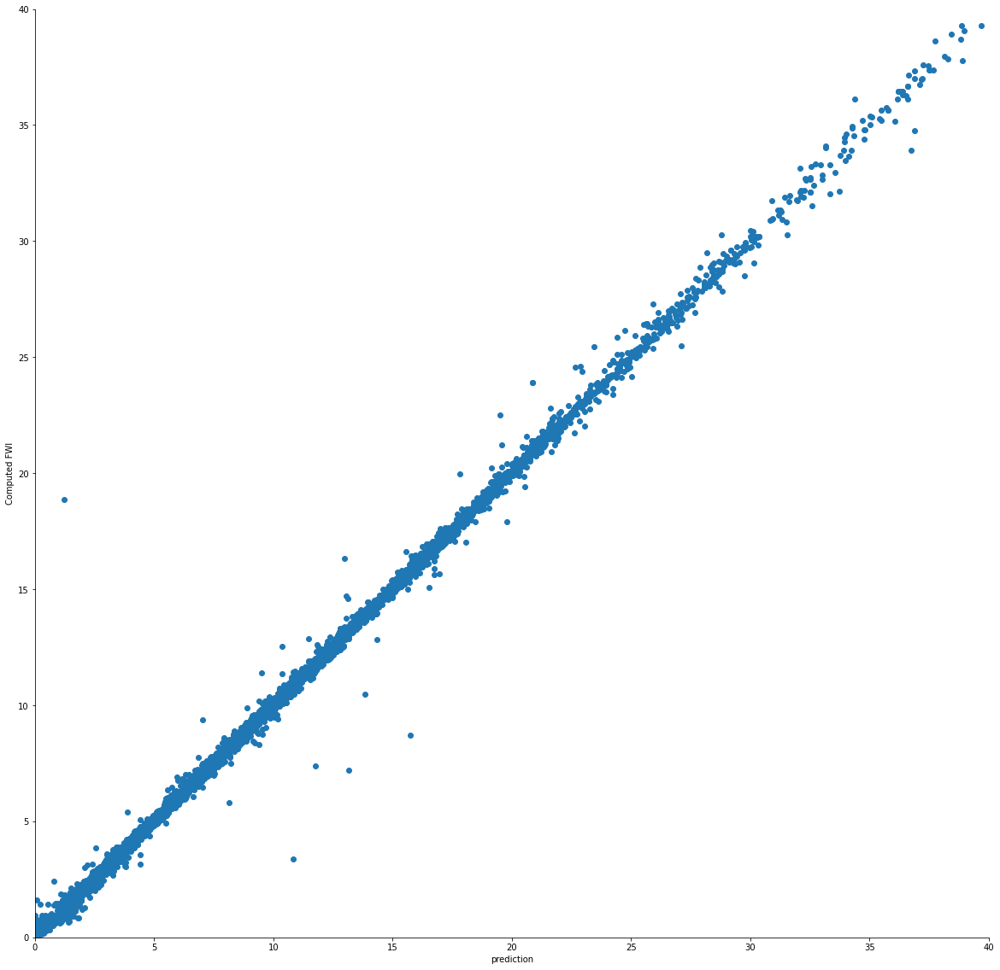

In [110]:
figure(figsize = (20,20))
plot(model.predict(test_features.reshape(-1,4)), test_labels,"o")
xlabel("prediction")
ylabel("Computed FWI")
ylim(0,40)
xlim(0,40)